In [31]:
%load_ext autoreload
%autoreload 2
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.nonparametric.smoothers_lowess import lowess
from clust_huge_amp import *
%load_ext autoreload
%autoreload 2

import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
from scipy.spatial.distance import pdist, squareform
from scipy.special import expit
from scipy.stats import multivariate_normal
import matplotlib.pyplot as plt
from sklearn.cluster import SpectralClustering  # Add this import


The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [32]:

def load_model_essentials(base_path='/Users/sarahurbut/Dropbox/data_for_running/'):
    """
    Load all essential components
    """
    print("Loading components...")
    
    # Load large matrices
    Y = torch.load(base_path + 'Y_tensor.pt')
    E = torch.load(base_path + 'E_matrix.pt')
    G = torch.load(base_path + 'G_matrix.pt')
    
    # Load other components
    essentials = torch.load(base_path + 'model_essentials.pt')
    
    print("Loaded all components successfully!")
    
    return Y, E, G, essentials

# Load and initialize model:
Y, E, G, essentials = load_model_essentials()



Loading components...


/var/folders/fl/ng5crz0x0fnb6c6x8dk7tfth0000gn/T/ipykernel_41712/1145408082.py:8: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  Y = torch.load(base_path + 'Y_tensor.pt')
/va

Loaded all components successfully!


In [33]:

# Subset the data
Y_100k, E_100k, G_100k, indices = subset_data(Y, E, G, start_index=0, end_index=10000)

torch.manual_seed(42)
np.random.seed(42)
if torch.cuda.is_available():
    torch.cuda.manual_seed(42)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False
# Initialize model with subsetted data

del Y

In [34]:
# When initializing the model:
original_G = G_100k # Store the original G - proper tensor copy

# Now in your batch run, load and verify:
initial_psi = torch.load('/Users/sarahurbut/Dropbox/data_for_running/initial_psi_400k.pt')
initial_clusters = torch.load('/Users/sarahurbut/Dropbox/data_for_running/initial_clusters_400k.pt')

original_cluster_sizes = {}
unique, counts = np.unique(initial_clusters, return_counts=True)
for k, count in zip(unique, counts):
    original_cluster_sizes[k] = count
print("\nOriginal cluster sizes:")
for k, count in original_cluster_sizes.items():
    print(f"Cluster {k}: {count} diseases")


# Load references (signatures only, no healthy)
refs = torch.load('/Users/sarahurbut/Dropbox/data_for_running/reference_trajectories.pt')
signature_refs = refs['signature_refs']
# When initializing the model:





Original cluster sizes:
Cluster 0: 16 diseases
Cluster 1: 21 diseases
Cluster 2: 15 diseases
Cluster 3: 82 diseases
Cluster 4: 5 diseases
Cluster 5: 7 diseases
Cluster 6: 8 diseases
Cluster 7: 22 diseases
Cluster 8: 28 diseases
Cluster 9: 12 diseases
Cluster 10: 11 diseases
Cluster 11: 8 diseases
Cluster 12: 7 diseases
Cluster 13: 13 diseases
Cluster 14: 10 diseases
Cluster 15: 5 diseases
Cluster 16: 29 diseases
Cluster 17: 17 diseases
Cluster 18: 9 diseases
Cluster 19: 23 diseases


/var/folders/fl/ng5crz0x0fnb6c6x8dk7tfth0000gn/T/ipykernel_41712/2949129839.py:5: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  initial_psi = torch.load('/Users/sarahurbut/D

In [35]:

torch.manual_seed(7)
np.random.seed(4)
# Create model without healthy reference
model = AladynSurvivalFixedKernelsAvgLoss_clust_logitInit_psitest(
    N=Y_100k.shape[0], 
    D=Y_100k.shape[1], 
    T=Y_100k.shape[2], 
    K=20,
    P=G_100k.shape[1],
    init_sd_scaler=1e-1,
    G=G_100k, 
    Y=Y_100k,
    genetic_scale=1,
    W=0.0001,
    R=0,
    prevalence_t=essentials['prevalence_t'],
    signature_references=signature_refs,  # Only pass signature refs
    healthy_reference=True,  # Explicitly set to None
    disease_names=essentials['disease_names']
)

torch.manual_seed(0)
np.random.seed(0)
# Initialize with psi and clusters
model.initialize_params(true_psi=initial_psi)
model.clusters = initial_clusters
# Verify clusters match
clusters_match = np.array_equal(initial_clusters, model.clusters)
print(f"\nClusters match exactly: {clusters_match}")

/Users/sarahurbut/aladynoulli2/pyScripts/clust_huge_amp.py:73: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  self.signature_refs = torch.tensor(signature_references, dtype=torch.float32)
/Users/sarahurbut/aladynoulli2/pyScripts/clust_huge_amp.py:80: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  self.G = torch.tensor(G, dtype=torch.float32)
/Users/sarahurbut/aladynoulli2/pyScripts/clust_huge_amp.py:83: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  self.G = torch.tensor(G_scaled, dtype=torch.float32)
/Users/sarahurbut/aladynoulli2/pyScripts


Cluster Sizes:
Cluster 0: 14 diseases
Cluster 1: 7 diseases
Cluster 2: 21 diseases
Cluster 3: 15 diseases
Cluster 4: 17 diseases
Cluster 5: 16 diseases
Cluster 6: 57 diseases
Cluster 7: 18 diseases
Cluster 8: 13 diseases
Cluster 9: 11 diseases
Cluster 10: 18 diseases
Cluster 11: 12 diseases
Cluster 12: 26 diseases
Cluster 13: 7 diseases
Cluster 14: 9 diseases
Cluster 15: 8 diseases
Cluster 16: 7 diseases
Cluster 17: 11 diseases
Cluster 18: 6 diseases
Cluster 19: 55 diseases

Calculating gamma for k=0:
Number of diseases in cluster: 14
Base value (first 5): tensor([-18.4207, -18.4207, -17.3858, -16.3508, -16.3508])
Base value centered (first 5): tensor([-0.5458, -0.5458,  0.4891,  1.5240,  1.5240])
Base value centered mean: 3.23352810482902e-06
Gamma init for k=0 (first 5): tensor([ 0.0013,  0.0101,  0.0173,  0.0224, -0.0156])

Calculating gamma for k=1:
Number of diseases in cluster: 7
Base value (first 5): tensor([-18.4207, -18.4207, -18.4207, -18.4207, -18.4207])
Base value centered

In [36]:
initial_psi=model.psi
checkpoint=torch.load('/Users/sarahurbut/Dropbox/resultshighamp/results/output_0_10000/model.pt')
model.load_state_dict(checkpoint['model_state_dict'])

# If you're doing inference, set to eval mode
model.eval()

/var/folders/fl/ng5crz0x0fnb6c6x8dk7tfth0000gn/T/ipykernel_41712/1544438175.py:2: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint=torch.load('/Users/sarahurbut/Drop

AladynSurvivalFixedKernelsAvgLoss_clust_logitInit_psitest()

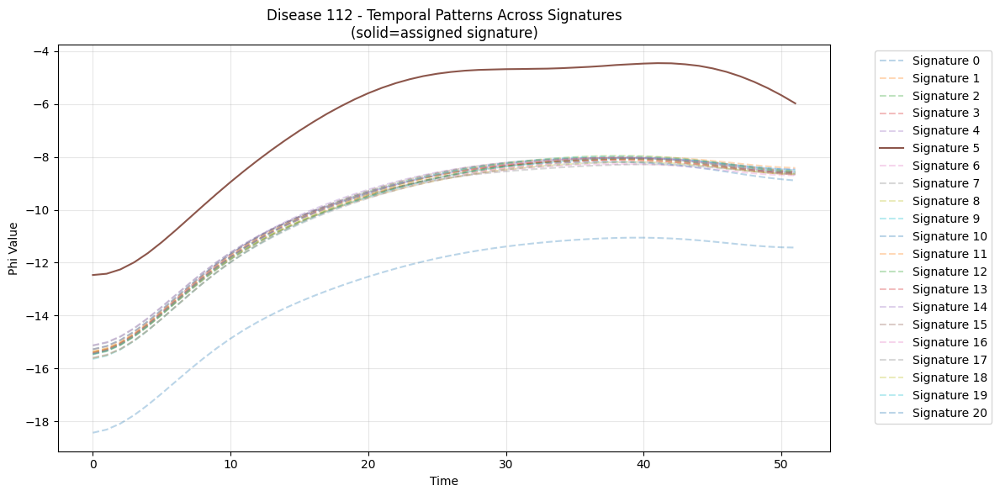


Psi values for disease 112:
Signature 0: -2.148
Signature 1: -2.055
Signature 2: -2.025
Signature 3: -2.243
Signature 4: -1.915
Signature 5: -1.085
Signature 6: -2.068
Signature 7: -2.066
Signature 8: -2.036
Signature 9: -2.165
Signature 10: -2.253
Signature 11: -2.050
Signature 12: -2.063
Signature 13: -1.999
Signature 14: -1.948
Signature 15: -1.935
Signature 16: -2.340
Signature 17: -2.151
Signature 18: -1.985
Signature 19: -2.077
Signature 20: -4.974


In [20]:

def plot_disease_signature_patterns(model, disease_idx=112):
    plt.figure(figsize=(12, 6))
    time_points = np.arange(model.T)
    
    # Get phi values for this disease across all signatures
    phi_disease = model.phi[:, disease_idx].detach()  # [K, T]
    psi_disease = model.psi[:, disease_idx].detach()  # [K]
    
    # Plot phi trajectories
    for k in range(model.K_total):
        # Make the assigned signature (highest psi) stand out
        is_assigned = (psi_disease[k] == psi_disease.max())
        alpha = 1.0 if is_assigned else 0.3
        linestyle = '-' if is_assigned else '--'
        
        plt.plot(time_points, phi_disease[k], 
                label=f'Signature {k}', 
                alpha=alpha,
                linestyle=linestyle)
    
    plt.title(f'Disease {disease_idx} - Temporal Patterns Across Signatures\n(solid=assigned signature)')
    plt.xlabel('Time')
    plt.ylabel('Phi Value')
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()

    # Print psi values
    print(f"\nPsi values for disease {disease_idx}:")
    for k in range(model.K_total):
        print(f"Signature {k}: {psi_disease[k]:.3f}")

# Call the function for MI (disease 112)
plot_disease_signature_patterns(model, disease_idx=112)

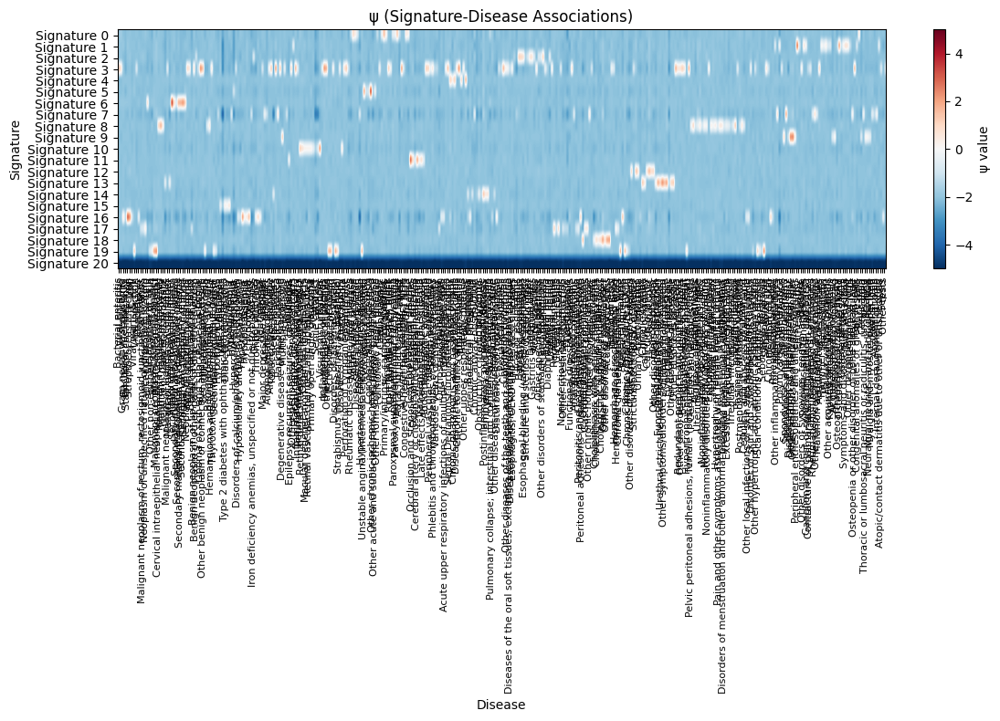

In [21]:
def plot_psi_heatmap(model, disease_names=None, figsize=(12, 8)):
    """
    Plot heatmap of psi values (signature-disease associations)
    
    Args:
        model: The trained model containing psi parameter
        disease_names: Optional list of disease names
        figsize: Tuple specifying figure size
    """
    plt.figure(figsize=figsize)
    
    # Get psi values from model
    psi = model.psi.detach().numpy()
    
    # Create heatmap
    im = plt.imshow(psi, aspect='auto', cmap='RdBu_r', vmin=-5, vmax=5)
    
    # Add colorbar
    plt.colorbar(im, label='ψ value')
    
    # Labels
    plt.xlabel('Disease')
    plt.ylabel('Signature')
    plt.title('ψ (Signature-Disease Associations)')
    
    # Optional: Add disease names if provided
    if disease_names is not None:
        plt.xticks(range(len(disease_names)), disease_names, 
                  rotation=90, fontsize=8)
    
    # Signature labels
    plt.yticks(range(psi.shape[0]), [f'Signature {i}' for i in range(psi.shape[0])])
    
    plt.tight_layout()
    plt.show()

# Usage:
plot_psi_heatmap(model, disease_names=essentials['disease_names'])  # if you have disease names
# or simply:
# plot_psi_heatmap(model)

In [25]:
# Define conditions with their indices and thresholds
conditions = {
    'Breast Cancer': {
        'index': 17,
        'early': 50,
        'late': 70
    },
    'Major Depression': {
        'index': 66,
        'early': 40,
        'late': 60
    },
    'Coronary Atherosclerosis': {
        'index': 112,
        'early': 50,
        'late': 70
    },
    'Atrial Fibrillation': {
        'index': 127,
        'early': 55,
        'late': 75
    },
    'Stroke': {
        'index': 132,
        'early': 55,
        'late': 75
    }
}



Analyzing Breast Cancer (index 17)
Found 423 patients


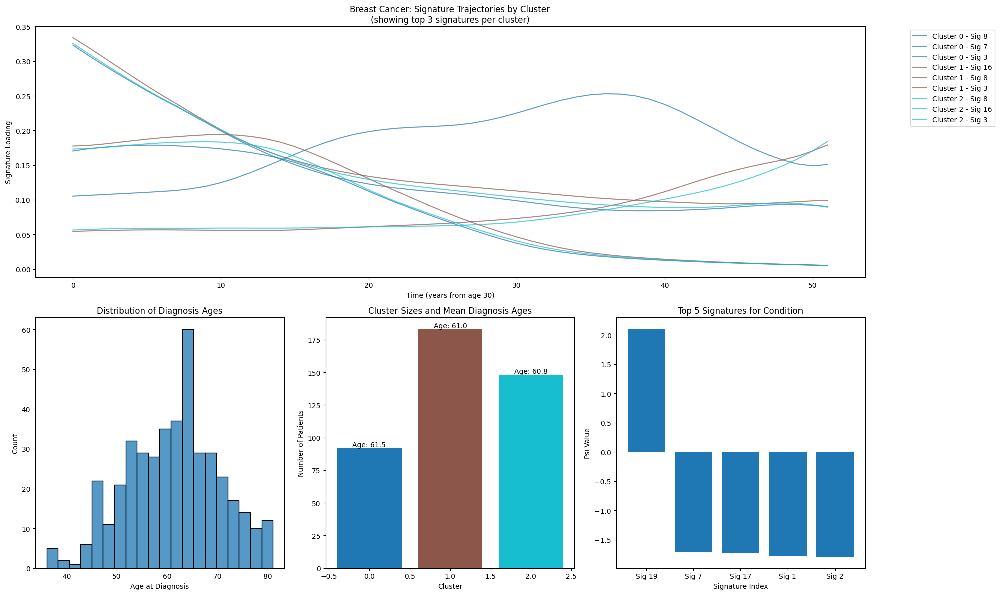


Cluster Summary:

Cluster 0:
Patients: 92
Mean diagnosis age: 61.5
Age range: 36.0 - 80.0

Cluster 1:
Patients: 183
Mean diagnosis age: 61.0
Age range: 37.0 - 81.0

Cluster 2:
Patients: 148
Mean diagnosis age: 60.8
Age range: 37.0 - 81.0

Analyzing Major Depression (index 66)
Found 723 patients


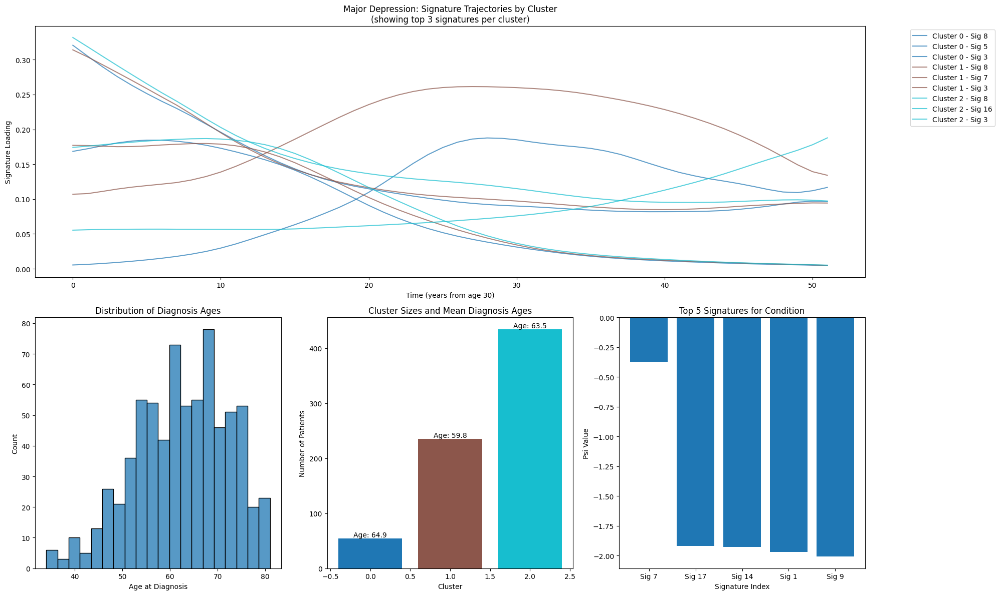


Cluster Summary:

Cluster 0:
Patients: 54
Mean diagnosis age: 64.9
Age range: 41.0 - 80.0

Cluster 1:
Patients: 235
Mean diagnosis age: 59.8
Age range: 34.0 - 79.0

Cluster 2:
Patients: 434
Mean diagnosis age: 63.5
Age range: 34.0 - 81.0

Analyzing Coronary Atherosclerosis (index 112)
Found 635 patients


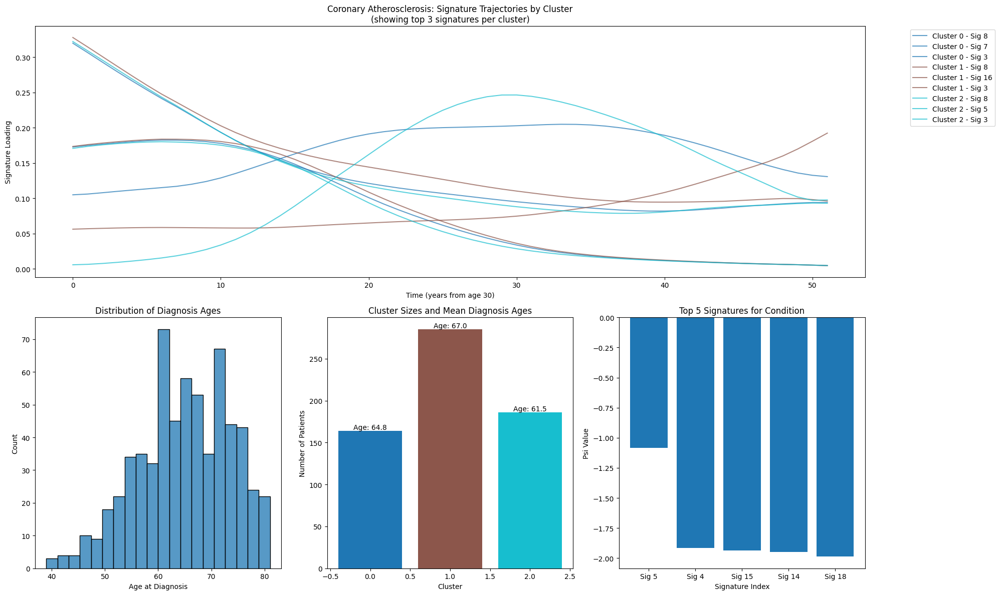


Cluster Summary:

Cluster 0:
Patients: 164
Mean diagnosis age: 64.8
Age range: 39.0 - 81.0

Cluster 1:
Patients: 285
Mean diagnosis age: 67.0
Age range: 41.0 - 81.0

Cluster 2:
Patients: 186
Mean diagnosis age: 61.5
Age range: 40.0 - 80.0

Analyzing Atrial Fibrillation (index 127)
Found 518 patients


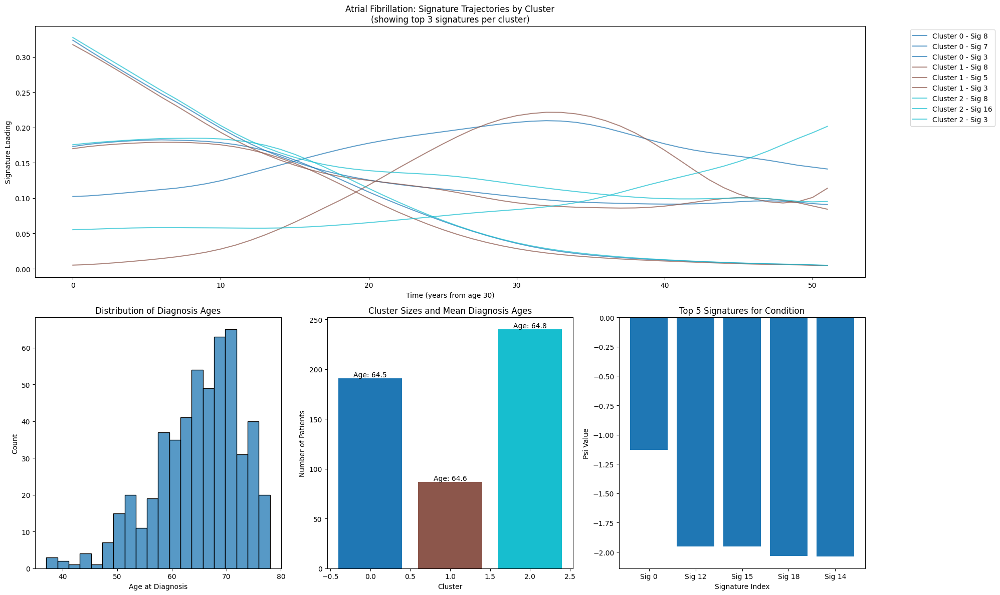


Cluster Summary:

Cluster 0:
Patients: 191
Mean diagnosis age: 64.5
Age range: 38.0 - 78.0

Cluster 1:
Patients: 87
Mean diagnosis age: 64.6
Age range: 46.0 - 78.0

Cluster 2:
Patients: 240
Mean diagnosis age: 64.8
Age range: 37.0 - 78.0

Analyzing Stroke (index 132)
Found 119 patients


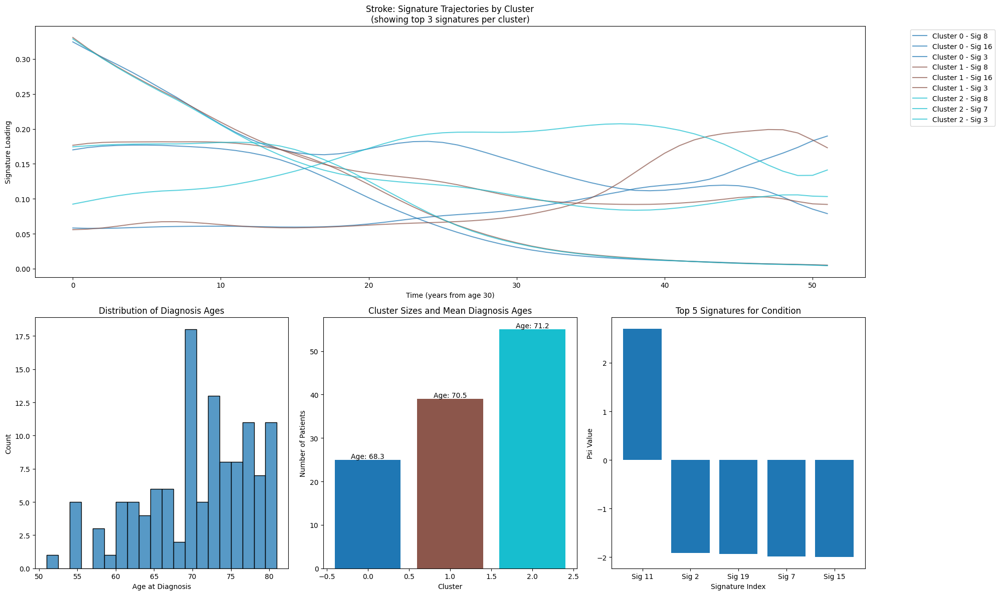


Cluster Summary:

Cluster 0:
Patients: 25
Mean diagnosis age: 68.3
Age range: 51.0 - 79.0

Cluster 1:
Patients: 39
Mean diagnosis age: 70.5
Age range: 54.0 - 81.0

Cluster 2:
Patients: 55
Mean diagnosis age: 71.2
Age range: 54.0 - 81.0


In [27]:
def analyze_disease_heterogeneity(model, conditions, n_clusters=3):
    for condition_name, params in conditions.items():
        print(f"\nAnalyzing {condition_name} (index {params['index']})")
        print("=" * 50)
        
        # Rest of the function remains the same, but use params['index'] instead of condition_idx
        condition_idx = params['index']
        early_threshold = params['early']
        late_threshold = params['late']
        

        
        # Find patients with this condition
        patients = []
        diagnosis_times = []
        
        for p in range(model.Y.shape[0]):
            if torch.any(model.Y[p, condition_idx]):
                patients.append(p)
                diag_time = torch.where(model.Y[p, condition_idx])[0][0].item()
                diagnosis_times.append(diag_time)
        
        if not patients:
            print(f"No patients found with {condition_name}")
            continue
            
        print(f"Found {len(patients)} patients")
        
        # Get signature proportions for these patients
        patient_features = []
        all_trajectories = []
        
        for p in patients:
            # Get full trajectory
            props = torch.softmax(model.lambda_[p], dim=0).detach().numpy()
            all_trajectories.append(props)
            
            # Get features for clustering (mean proportions)
            mean_props = props.mean(axis=1)
            patient_features.append(mean_props)
        
        # Cluster patients
        kmeans = KMeans(n_clusters=n_clusters, random_state=42)
        clusters = kmeans.fit_predict(patient_features)
        
        # Create visualization
        fig = plt.figure(figsize=(20, 12))
        gs = plt.GridSpec(2, 3, figure=fig)
        
        # Plot 1: Average trajectories for each cluster
        ax1 = fig.add_subplot(gs[0, :])
        cluster_colors = plt.cm.tab10(np.linspace(0, 1, n_clusters))
        
        for i in range(n_clusters):
            cluster_patients = [p for j, p in enumerate(patients) if clusters[j] == i]
            cluster_trajectories = [all_trajectories[j] for j, p in enumerate(patients) if clusters[j] == i]
            mean_trajectory = np.mean(cluster_trajectories, axis=0)
            
            # Plot mean trajectory for top signatures
            top_sigs = np.argsort(mean_trajectory.max(axis=1))[-3:]  # Top 3 signatures
            for sig in top_sigs:
                ax1.plot(mean_trajectory[sig], 
                        color=cluster_colors[i], 
                        label=f'Cluster {i} - Sig {sig}',
                        alpha=0.7)
        
        ax1.set_title(f'{condition_name}: Signature Trajectories by Cluster\n(showing top 3 signatures per cluster)')
        ax1.set_xlabel('Time (years from age 30)')
        ax1.set_ylabel('Signature Loading')
        ax1.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
        
        # Plot 2: Diagnosis age distribution
        ax2 = fig.add_subplot(gs[1, 0])
        diagnosis_ages = [30 + t for t in diagnosis_times]
        sns.histplot(diagnosis_ages, bins=20, ax=ax2)
        ax2.set_title('Distribution of Diagnosis Ages')
        ax2.set_xlabel('Age at Diagnosis')
        
        # Plot 3: Cluster characteristics
        ax3 = fig.add_subplot(gs[1, 1])
        cluster_sizes = [np.sum(clusters == i) for i in range(n_clusters)]
        cluster_mean_ages = [np.mean([30 + diagnosis_times[j] for j, c in enumerate(clusters) if c == i]) 
                           for i in range(n_clusters)]
        
        ax3.bar(range(n_clusters), cluster_sizes, color=cluster_colors)
        ax3.set_title('Cluster Sizes and Mean Diagnosis Ages')
        ax3.set_xlabel('Cluster')
        ax3.set_ylabel('Number of Patients')
        
        # Add mean ages as text
        for i, (size, age) in enumerate(zip(cluster_sizes, cluster_mean_ages)):
            ax3.text(i, size, f'Age: {age:.1f}', ha='center', va='bottom')
        
        # Plot 4: Signature importance
        ax4 = fig.add_subplot(gs[1, 2])
        psi_values = model.psi[:, condition_idx].detach().numpy()
        top_sigs = np.argsort(psi_values)[-5:][::-1]
        ax4.bar(range(5), psi_values[top_sigs])
        ax4.set_title('Top 5 Signatures for Condition')
        ax4.set_xlabel('Signature Index')
        ax4.set_ylabel('Psi Value')
        ax4.set_xticks(range(5))
        ax4.set_xticklabels([f'Sig {i}' for i in top_sigs])
        
        plt.tight_layout()
        plt.show()
        
        # Print statistical summary
        print("\nCluster Summary:")
        for i in range(n_clusters):
            cluster_patients = [p for j, p in enumerate(patients) if clusters[j] == i]
            cluster_diag_ages = [30 + diagnosis_times[j] for j, p in enumerate(patients) if clusters[j] == i]
            print(f"\nCluster {i}:")
            print(f"Patients: {len(cluster_patients)}")
            print(f"Mean diagnosis age: {np.mean(cluster_diag_ages):.1f}")
            print(f"Age range: {min(cluster_diag_ages):.1f} - {max(cluster_diag_ages):.1f}")



# Run the analysis
from sklearn.cluster import KMeans
import seaborn as sns
analyze_disease_heterogeneity(model, conditions)

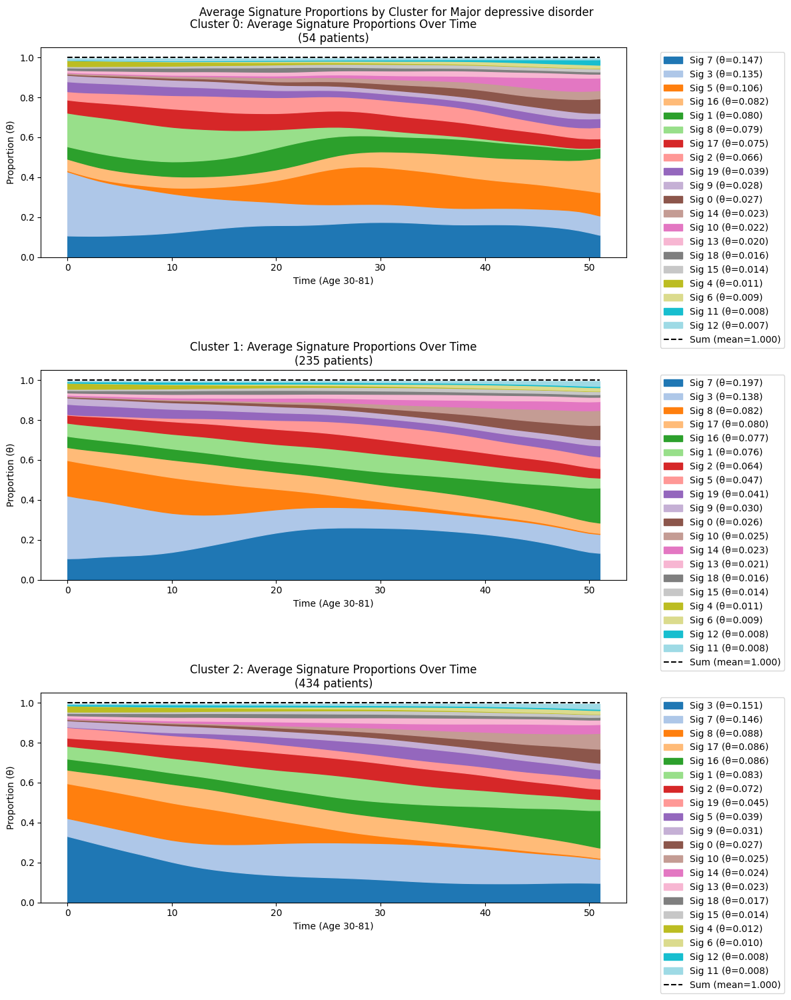

In [31]:
def plot_cluster_signature_proportions(model, condition_idx, clusters, n_top_sigs=20):
    """
    Plot average signature proportions over time for each cluster of patients with a condition
    """
    # Find patients with this condition and their diagnosis times
    patients = []
    diagnosis_times = []
    
    for p in range(model.Y.shape[0]):
        if torch.any(model.Y[p, condition_idx]):
            patients.append(p)
            diag_time = torch.where(model.Y[p, condition_idx])[0][0].item()
            diagnosis_times.append(diag_time)
    
    # Get features for clustering
    patient_features = []
    for p in patients:
        props = torch.softmax(model.lambda_[p], dim=0).detach().numpy()
        mean_props = props.mean(axis=1)
        patient_features.append(mean_props)
    
    # Perform clustering
    kmeans = KMeans(n_clusters=3, random_state=42)
    patient_clusters = kmeans.fit_predict(patient_features)
    
    # Now create the visualization
    fig, axes = plt.subplots(3, 1, figsize=(12, 15))
    time_points = np.arange(model.T)
    
    for cluster_idx in range(3):
        # Get patients in this cluster using the clusters we just created
        cluster_patients = [p for i, p in enumerate(patients) if patient_clusters[i] == cluster_idx]
        
        # Calculate average theta for this cluster
        cluster_thetas = []
        for p in cluster_patients:
            theta = torch.softmax(model.lambda_[p], dim=0).detach().numpy()
            cluster_thetas.append(theta)
        avg_theta = np.mean(cluster_thetas, axis=0)  # [K x T]
        
        # Calculate mean proportion for each signature
        mean_props = avg_theta.mean(axis=1)
        
        # Get top signatures by mean proportion
        top_sig_idx = np.argsort(mean_props)[-n_top_sigs:][::-1]
        
        # Create stacked area plot
        bottom = np.zeros(model.T)
        colors = plt.cm.tab20(np.linspace(0, 1, n_top_sigs))
        
        for i, sig in enumerate(top_sig_idx):
            axes[cluster_idx].fill_between(time_points, bottom, bottom + avg_theta[sig], 
                                         label=f'Sig {sig} (θ={mean_props[sig]:.3f})',
                                         color=colors[i])
            bottom += avg_theta[sig]
        
        # Add sum line
        axes[cluster_idx].plot(time_points, np.sum(avg_theta, axis=0), 'k--', 
                             label=f'Sum (mean={np.mean(np.sum(avg_theta, axis=0)):.3f})')
        
        axes[cluster_idx].set_title(f'Cluster {cluster_idx}: Average Signature Proportions Over Time\n'
                                  f'({len(cluster_patients)} patients)')
        axes[cluster_idx].set_xlabel('Time (Age 30-81)')
        axes[cluster_idx].set_ylabel('Proportion (θ)')
        axes[cluster_idx].set_ylim(0, 1.05)
        axes[cluster_idx].legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    
    plt.suptitle(f'Average Signature Proportions by Cluster for {model.disease_names[condition_idx]}')
    plt.tight_layout()
    plt.show()

# Usage:
plot_cluster_signature_proportions(model, condition_idx=66, clusters=None)  # For Major Depression

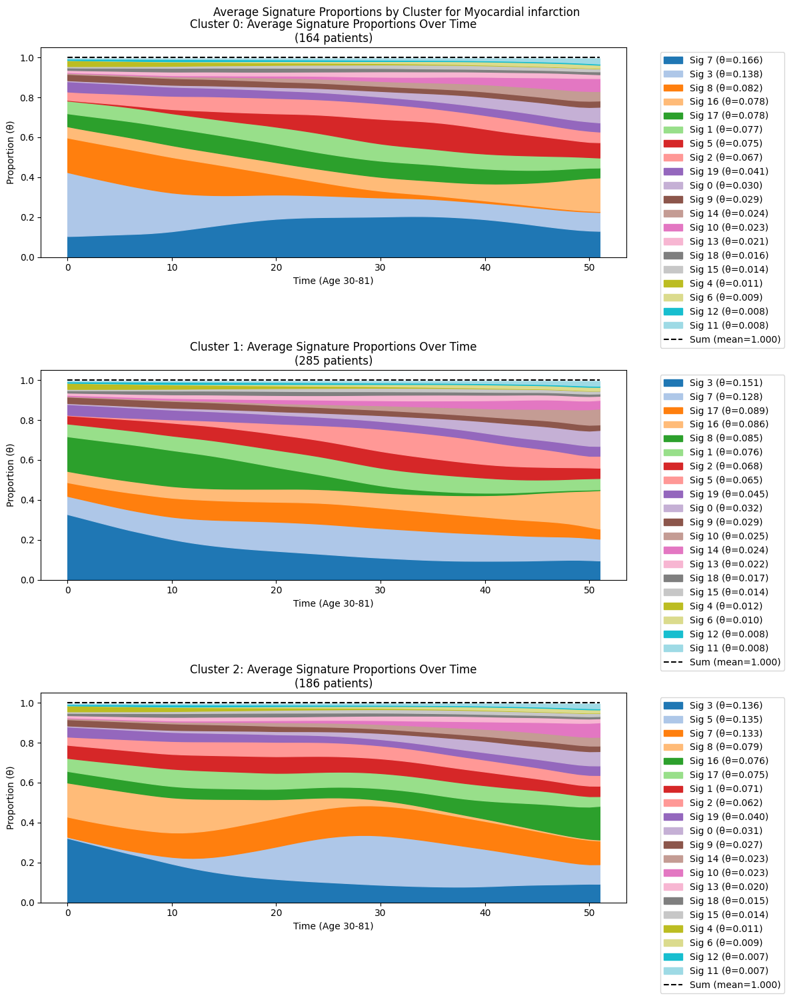

In [32]:
plot_cluster_signature_proportions(model, condition_idx=112, clusters=None) 

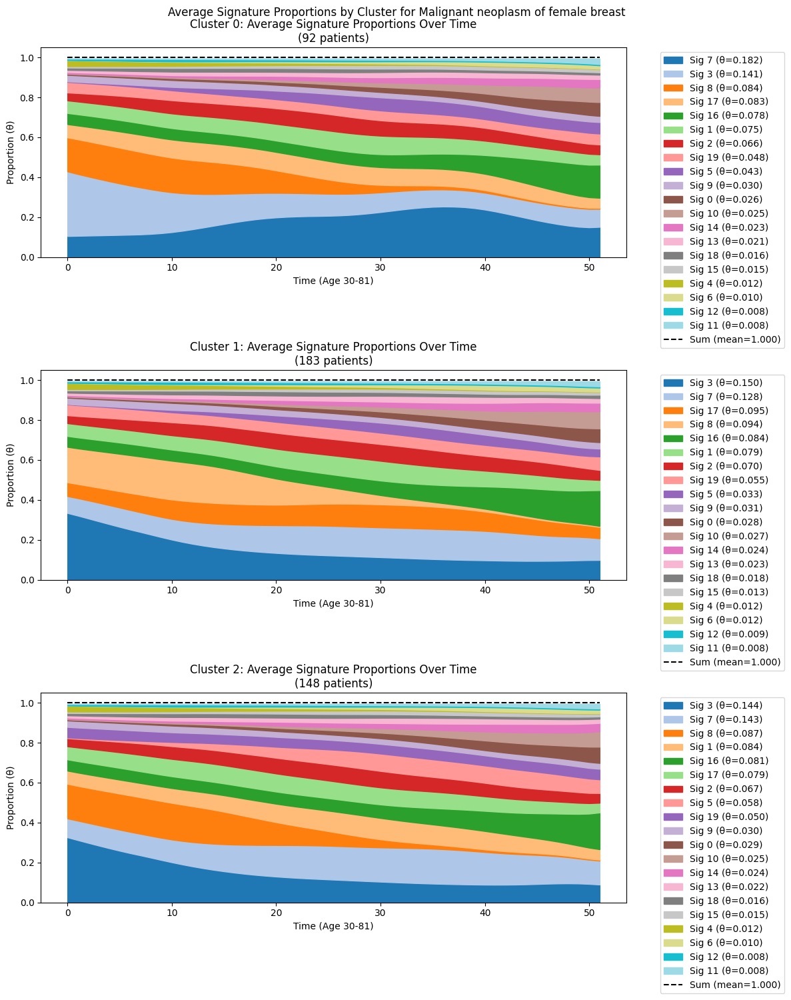

In [33]:
plot_cluster_signature_proportions(model, condition_idx=17, clusters=None) 

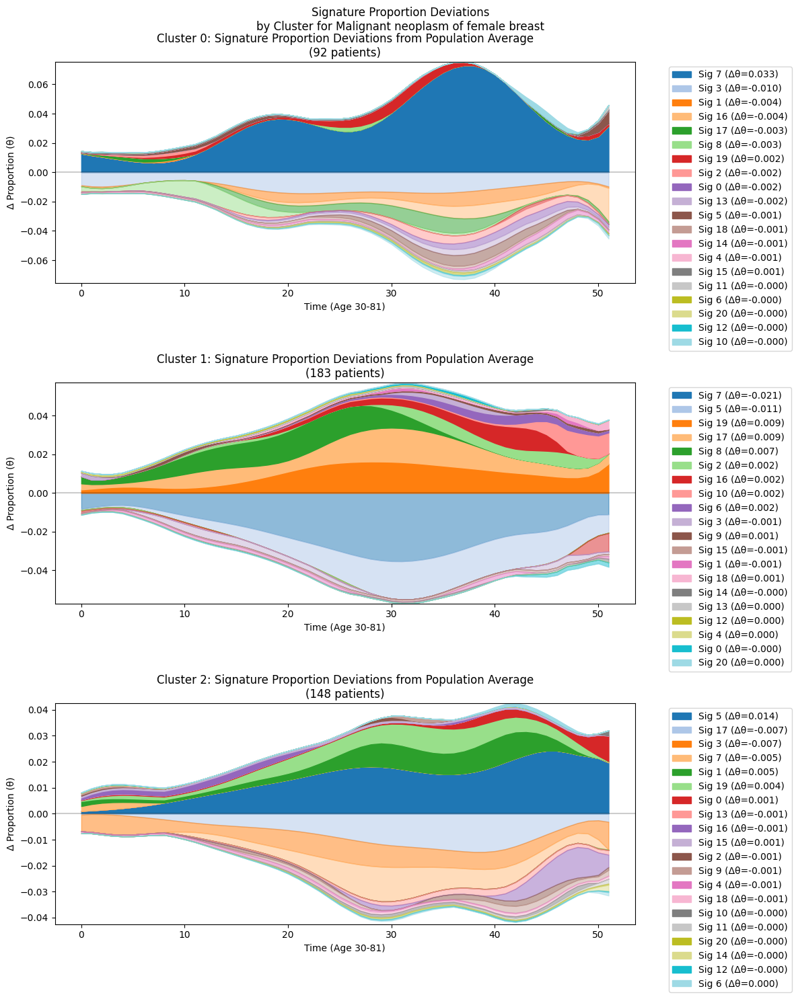

In [44]:
def plot_cluster_signature_proportions(model, condition_idx, n_top_sigs=20, subtract_reference=True):
    """
    Plot average signature proportions over time for each cluster, subtracting signature references
    """
    # Find patients with this condition
    patients = []
    for p in range(model.Y.shape[0]):
        if torch.any(model.Y[p, condition_idx]):
            patients.append(p)
    
    # Get features for clustering
    patient_features = []
    for p in patients:
        props = torch.softmax(model.lambda_[p], dim=0).detach().numpy()
        mean_props = props.mean(axis=1)
        patient_features.append(mean_props)
    
    # Perform clustering
    kmeans = KMeans(n_clusters=3, random_state=42)
    patient_clusters = kmeans.fit_predict(patient_features)
    
    # Create figure and axes
    fig, axes = plt.subplots(3, 1, figsize=(12, 15))
    time_points = np.arange(model.T)
    # Get reference trajectories including healthy state
    if model.healthy_ref is not None:
        # Create full reference including healthy state
        reference_lambda = torch.zeros((model.K_total, model.T))
        reference_lambda[:model.K] = model.signature_refs  # Disease signatures
        reference_lambda[model.K] = model.healthy_ref  # Healthy reference (-5.0)
        # Convert to proportions using softmax
        reference_theta = torch.softmax(reference_lambda, dim=0).detach().numpy()
    else:
        reference_theta = torch.softmax(model.signature_refs, dim=0).detach().numpy()
    
    for cluster_idx in range(3):
        cluster_patients = [p for i, p in enumerate(patients) if patient_clusters[i] == cluster_idx]
        
        # Calculate average theta for this cluster
        cluster_thetas = []
        for p in cluster_patients:
            # Apply softmax to get proportions
            theta = torch.softmax(model.lambda_[p], dim=0).detach().numpy()
            cluster_thetas.append(theta)
        avg_theta = np.mean(cluster_thetas, axis=0)
        
        if subtract_reference:
            # Now subtracting softmax'd values from softmax'd values
            avg_theta = avg_theta - reference_theta
        
        # Calculate mean deviation for each signature
        mean_props = avg_theta.mean(axis=1)
        
        # Get top signatures by absolute mean deviation
        top_sig_idx = np.argsort(np.abs(mean_props))[-n_top_sigs:][::-1]
        
        # Create stacked area plot
        bottom_pos = np.zeros(model.T)
        bottom_neg = np.zeros(model.T)
        colors = plt.cm.tab20(np.linspace(0, 1, n_top_sigs))
        
        for i, sig in enumerate(top_sig_idx):
            values = avg_theta[sig]
            if subtract_reference:
                # For deviations, split positive and negative
                pos_values = np.maximum(values, 0)
                neg_values = np.minimum(values, 0)
                
                axes[cluster_idx].fill_between(time_points, bottom_pos, bottom_pos + pos_values,
                                             label=f'Sig {sig} (Δθ={mean_props[sig]:.3f})',
                                             color=colors[i])
                axes[cluster_idx].fill_between(time_points, bottom_neg, bottom_neg + neg_values,
                                             color=colors[i], alpha=0.5)
                
                bottom_pos += pos_values
                bottom_neg += neg_values
            else:
                axes[cluster_idx].fill_between(time_points, bottom_pos, bottom_pos + values,
                                             label=f'Sig {sig} (θ={mean_props[sig]:.3f})',
                                             color=colors[i])
                bottom_pos += values
        
        title = f'Cluster {cluster_idx}: '
        title += 'Signature Proportion Deviations from Population Average' if subtract_reference else 'Average Signature Proportions'
        title += f'\n({len(cluster_patients)} patients)'
        
        axes[cluster_idx].set_title(title)
        axes[cluster_idx].set_xlabel('Time (Age 30-81)')
        axes[cluster_idx].set_ylabel('Δ Proportion (θ)' if subtract_reference else 'Proportion (θ)')
        axes[cluster_idx].legend(bbox_to_anchor=(1.05, 1), loc='upper left')
        
        if subtract_reference:
            # Center y-axis around 0 for deviations
            max_dev = max(abs(bottom_pos.max()), abs(bottom_neg.min()))
            axes[cluster_idx].set_ylim(-max_dev, max_dev)
            axes[cluster_idx].axhline(y=0, color='k', linestyle='-', alpha=0.2)
        else:
            axes[cluster_idx].set_ylim(0, 1.05)
    
    plt.suptitle(f'{"Signature Proportion Deviations" if subtract_reference else "Average Signature Proportions"}\n'
                f'by Cluster for {model.disease_names[condition_idx]}')
    plt.tight_layout()
    plt.show()

# Usage:
plot_cluster_signature_proportions(model, 17, n_top_sigs=20, subtract_reference=True)
### small change for git test

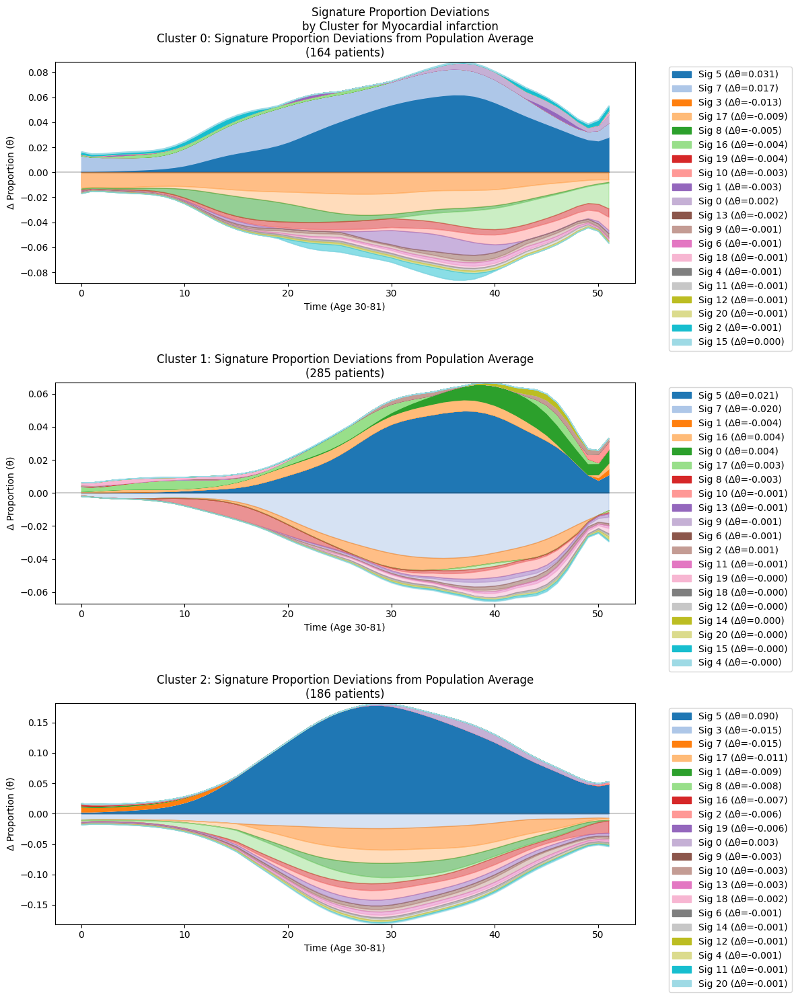

In [45]:

# Usage:
plot_cluster_signature_proportions(model, 112, n_top_sigs=20, subtract_reference=True)

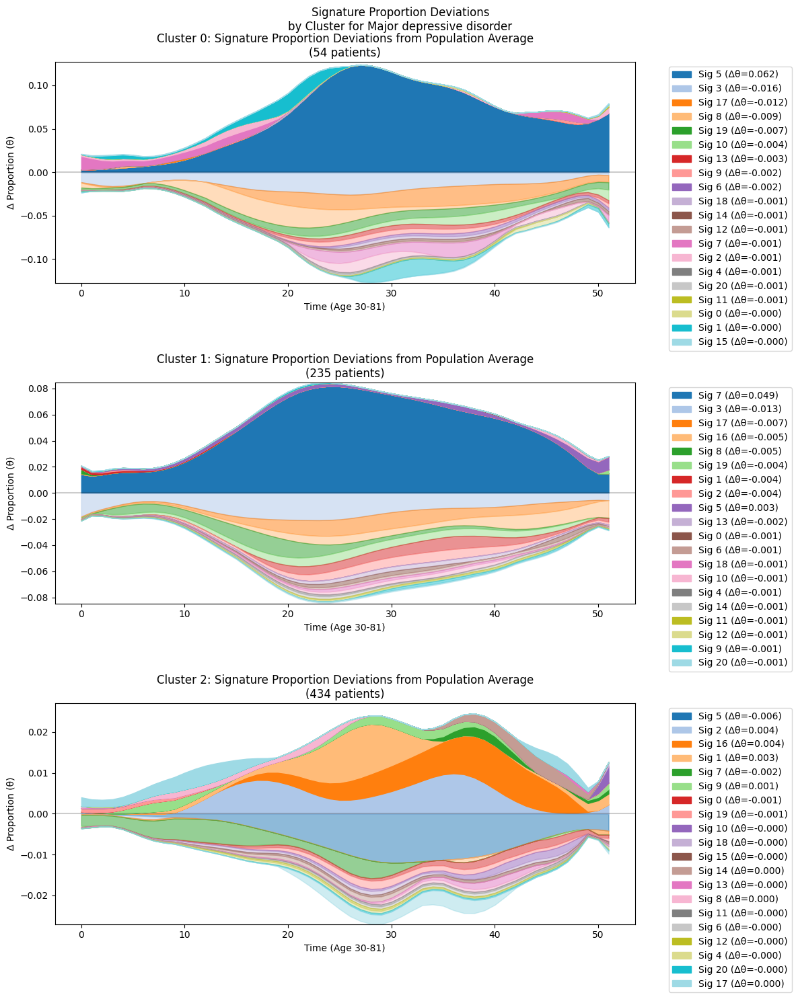

In [46]:
# Usage:
plot_cluster_signature_proportions(model, 66, n_top_sigs=20, subtract_reference=True)

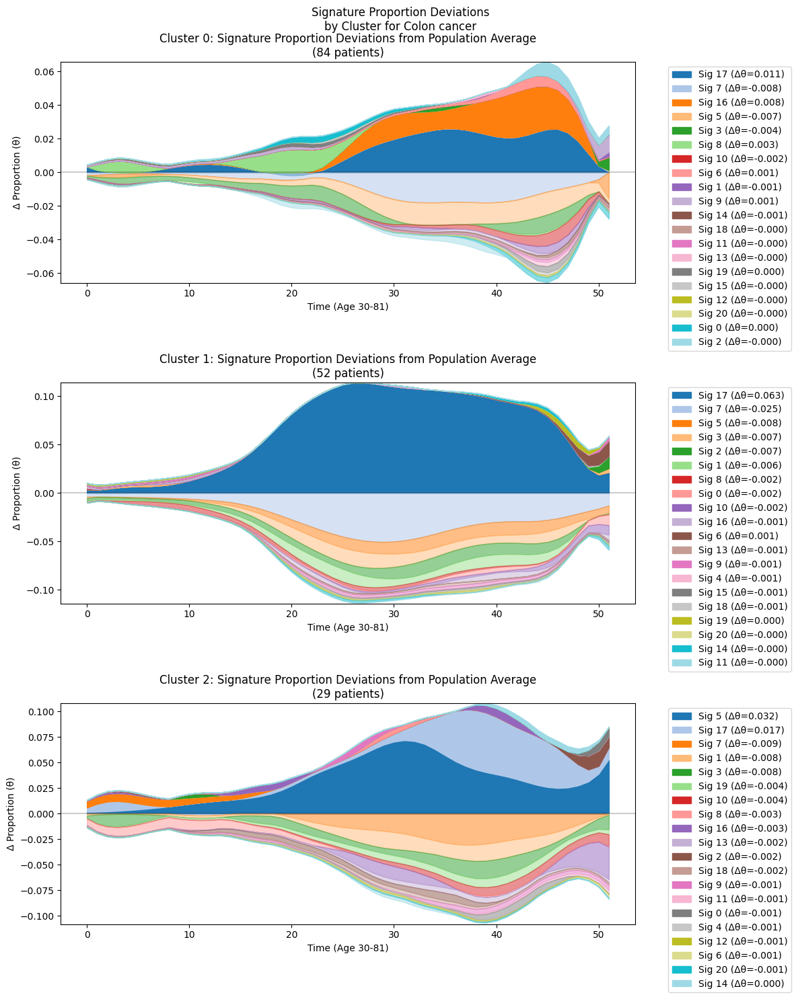

In [47]:
# Usage:
plot_cluster_signature_proportions(model, 10, n_top_sigs=20, subtract_reference=True)

In [15]:
from sklearn.cluster import KMeans

def analyze_disease_signatures(disease_indices=[66, 112, 17], ages_to_analyze=[30, 50, 80], batch_size=10000, n_clusters=3):
    """
    Analyze specific disease signatures across all batches and identify common conditions by cluster at specific ages
    """
    print(f"Starting analysis for diseases {disease_indices} across batches...")
    
    # Load batch 1 model to get disease names and signature information
    model_path = '/Users/sarahurbut/Dropbox/resultshighamp/results/output_0_10000/model.pt'
    print("\nLoading batch 1 model for reference...")
    
    try:
        model1 = torch.load(model_path)
        disease_names = model1['disease_names'][0].tolist()
        K_total = model1['model_state_dict']['lambda_'].shape[1]  # Number of signatures
        total_patients = model1['Y'].shape[0]  # Number of patients in batch 1
        total_diseases = model1['Y'].shape[1]  # Number of diseases
        total_time = model1['Y'].shape[2]  # Number of time points
        
        print(f"Found {len(disease_names)} disease names and {K_total} signatures")
        print(f"Data dimensions: {total_patients} patients, {total_diseases} diseases, {total_time} time points")
        
        # Verify disease indices are valid
        for idx in disease_indices:
            if idx >= total_diseases:
                print(f"Warning: Disease index {idx} is out of range (max: {total_diseases-1})")
                return None
            print(f"Disease {idx}: {disease_names[idx] if idx < len(disease_names) else f'Unknown Disease {idx}'}")
    except Exception as e:
        print(f"ERROR loading model: {str(e)}")
        traceback.print_exc()
        return None
    
    # For each disease, collect patients who have that disease
    disease_patients = {d: [] for d in disease_indices}
    disease_features = {d: [] for d in disease_indices}
    disease_Y_data = {d: [] for d in disease_indices}
    
    # Estimate total number of batches (assuming similar batch sizes)
    # You may need to adjust this based on your actual data
    n_batches = 10  # Adjust based on your knowledge of how many batches you have
    
    # Process each batch
    for batch in range(n_batches):
        start_idx = batch * batch_size
        end_idx = (batch + 1) * batch_size
        
        model_path = f'/Users/sarahurbut/Dropbox/resultshighamp/results/output_{start_idx}_{end_idx}/model.pt'
        print(f"\nProcessing batch {batch+1}/{n_batches} (patients {start_idx}-{end_idx})")
        
        try:
            model = torch.load(model_path)
            lambda_values = model['model_state_dict']['lambda_']
            Y_batch = model['Y'].numpy()
            
            # For each disease of interest
            for disease_idx in disease_indices:
                # Find patients with this disease
                for i in range(Y_batch.shape[0]):
                    # Check if patient has this disease at any time point
                    if np.any(Y_batch[i, disease_idx, :]):
                        # Get signature proportions for this patient
                        props = torch.softmax(lambda_values[i], dim=0).detach().numpy()
                        
                        # Calculate mean proportions across time
                        mean_props = props.mean(axis=1)
                        
                        # Store patient data
                        disease_patients[disease_idx].append(start_idx + i)
                        disease_features[disease_idx].append(mean_props)
                        disease_Y_data[disease_idx].append(Y_batch[i].copy())
                
                print(f"Disease {disease_idx}: Found {len(disease_patients[disease_idx])} patients so far")
            
        except FileNotFoundError:
            print(f"Warning: Could not find model file for batch {batch}")
            break  # Assume we've reached the end of batches
        except Exception as e:
            print(f"Error processing batch {batch}: {str(e)}")
            traceback.print_exc()
            continue
    
    # Process each disease
    results = {}
    
    for disease_idx in disease_indices:
        if len(disease_patients[disease_idx]) == 0:
            print(f"No patients found for disease {disease_idx}")
            continue
            
        disease_name = disease_names[disease_idx] if disease_idx < len(disease_names) else f"Disease {disease_idx}"
        print(f"\n\nAnalyzing {len(disease_patients[disease_idx])} patients with {disease_name}")
        
        # Convert to numpy arrays
        features = np.array(disease_features[disease_idx])
        
        # Perform clustering
        print(f"Performing clustering with {n_clusters} clusters...")
        kmeans = KMeans(n_clusters=n_clusters, random_state=42)
        patient_clusters = kmeans.fit_predict(features)
        
        # Analyze cluster sizes
        for cluster in range(n_clusters):
            cluster_size = np.sum(patient_clusters == cluster)
            print(f"Cluster {cluster}: {cluster_size} patients ({cluster_size/len(patient_clusters):.1%})")
        
        # Analyze common conditions by cluster at specific ages
        disease_results = {}
        
        for age in ages_to_analyze:
            print(f"\nAnalyzing conditions at age {age} for {disease_name}...")
            disease_results[age] = {}
            
            for cluster in range(n_clusters):
                # Get patients in this cluster
                cluster_indices = np.where(patient_clusters == cluster)[0]
                
                # Count diagnoses at this age
                diagnosis_counts = {}
                valid_patients = 0
                
                for i in cluster_indices:
                    Y = disease_Y_data[disease_idx][i]
                    
                    # Convert age to time index (assuming ages 30-81)
                    time_idx = age - 30
                    
                    if time_idx < 0 or time_idx >= Y.shape[1]:
                        continue
                    
                    valid_patients += 1
                    
                    # Count diagnoses at this age
                    for d in range(Y.shape[0]):
                        if Y[d, time_idx] > 0:
                            diagnosis_counts[d] = diagnosis_counts.get(d, 0) + 1
                
                if valid_patients == 0:
                    print(f"No valid patients in cluster {cluster} at age {age}")
                    continue
                    
                # Normalize by number of patients
                for d in diagnosis_counts:
                    diagnosis_counts[d] /= valid_patients
                
                # Sort by frequency
                sorted_diagnoses = sorted(diagnosis_counts.items(), key=lambda x: x[1], reverse=True)
                
                # Store top 20 diagnoses
                top_diagnoses = []
                for d, freq in sorted_diagnoses[:20]:
                    d_name = disease_names[d] if d < len(disease_names) else f"Disease {d}"
                    top_diagnoses.append((d_name, freq))
                
                disease_results[age][cluster] = top_diagnoses
        
        results[disease_idx] = disease_results
        
        # Print results for this disease
        print(f"\n===== DIAGNOSES FOR {disease_name} =====")
        for age in ages_to_analyze:
            print(f"\n--- At Age {age} ---")
            
            for cluster in range(n_clusters):
                if cluster not in disease_results[age]:
                    continue
                    
                print(f"\nCluster {cluster}:")
                
                for d_name, freq in disease_results[age][cluster]:
                    print(f"{d_name}: {freq:.1%}")
    
    return results

# Usage:
results = analyze_disease_signatures(disease_indices=[66, 112, 17], ages_to_analyze=[30, 50, 80])

Starting analysis for diseases [66, 112, 17] across batches...

Loading batch 1 model for reference...
Found 348 disease names and 21 signatures
Data dimensions: 10000 patients, 348 diseases, 52 time points
Disease 66: Major depressive disorder
Disease 112: Myocardial infarction
Disease 17: Malignant neoplasm of female breast

Processing batch 1/10 (patients 0-10000)


/var/folders/fl/ng5crz0x0fnb6c6x8dk7tfth0000gn/T/ipykernel_31623/2029025786.py:14: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model1 = torch.load(model_path)
/var/folders

Disease 66: Found 723 patients so far
Disease 112: Found 635 patients so far
Disease 17: Found 423 patients so far

Processing batch 2/10 (patients 10000-20000)
Disease 66: Found 1467 patients so far
Disease 112: Found 1263 patients so far
Disease 17: Found 824 patients so far

Processing batch 3/10 (patients 20000-30000)
Disease 66: Found 2183 patients so far
Disease 112: Found 1880 patients so far
Disease 17: Found 1233 patients so far

Processing batch 4/10 (patients 30000-40000)
Disease 66: Found 2965 patients so far
Disease 112: Found 2481 patients so far
Disease 17: Found 1687 patients so far

Processing batch 5/10 (patients 40000-50000)
Disease 66: Found 3735 patients so far
Disease 112: Found 3144 patients so far
Disease 17: Found 2151 patients so far

Processing batch 6/10 (patients 50000-60000)
Disease 66: Found 4533 patients so far
Disease 112: Found 3768 patients so far
Disease 17: Found 2570 patients so far

Processing batch 7/10 (patients 60000-70000)
Disease 66: Found 53

Loading model to analyze disease 66...
Analyzing Major depressive disorder


/var/folders/fl/ng5crz0x0fnb6c6x8dk7tfth0000gn/T/ipykernel_31623/860766938.py:10: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model = torch.load(model_path)


Found 723 patients with Major depressive disorder


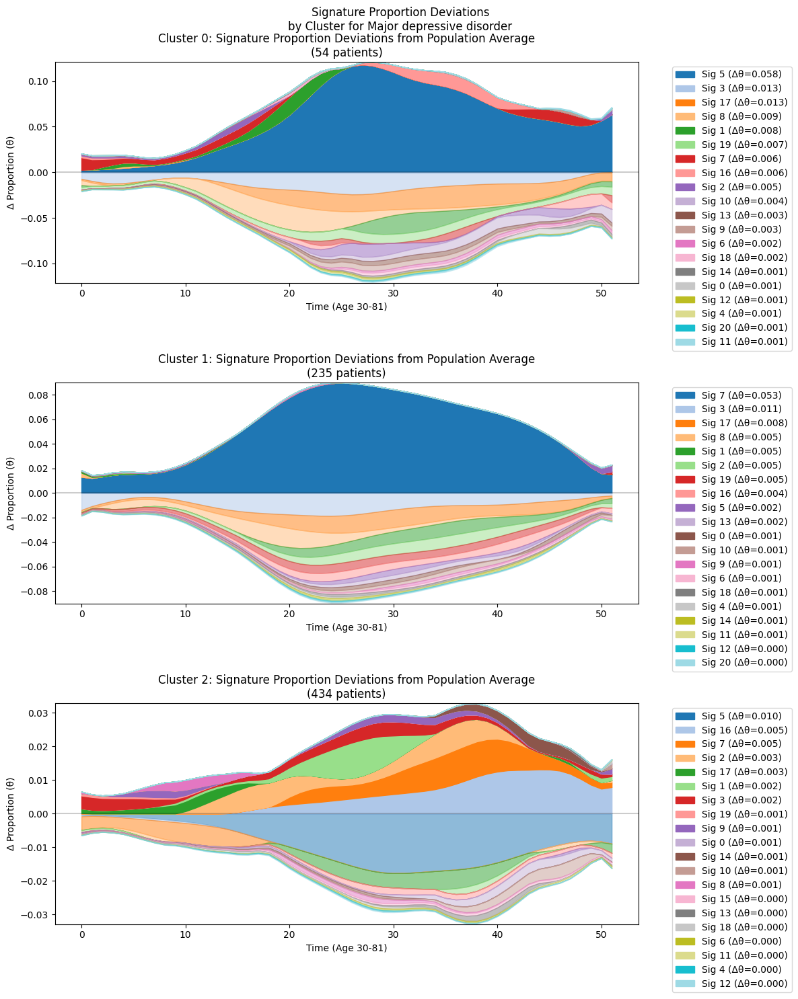

In [16]:
def plot_disease_signature_clusters(disease_idx, n_clusters=3, n_top_sigs=20, subtract_reference=True):
    """
    Plot signature proportion deviations by cluster for a specific disease
    """
    # Load model
    model_path = '/Users/sarahurbut/Dropbox/resultshighamp/results/output_0_10000/model.pt'
    print(f"Loading model to analyze disease {disease_idx}...")
    
    try:
        model = torch.load(model_path)
        disease_names = model['disease_names'][0].tolist()
        Y_data = model['Y'].numpy()
        lambda_values = model['model_state_dict']['lambda_']
        
        disease_name = disease_names[disease_idx] if disease_idx < len(disease_names) else f"Disease {disease_idx}"
        print(f"Analyzing {disease_name}")
        
        # Get reference trajectories
        if 'signature_refs' in model:
            if model.get('healthy_ref') is not None:
                # Create full reference including healthy state
                reference_lambda = torch.zeros((model['model_state_dict']['lambda_'].shape[1], Y_data.shape[2]))
                reference_lambda[:-1] = model['signature_refs']  # Disease signatures
                reference_lambda[-1] = model['healthy_ref']  # Healthy reference
                # Convert to proportions using softmax
                reference_theta = torch.softmax(reference_lambda, dim=0).detach().numpy()
            else:
                reference_theta = torch.softmax(model['signature_refs'], dim=0).detach().numpy()
        else:
            # If no reference, use population average
            all_thetas = []
            for p in range(lambda_values.shape[0]):
                theta = torch.softmax(lambda_values[p], dim=0).detach().numpy()
                all_thetas.append(theta)
            reference_theta = np.mean(all_thetas, axis=0)
        
        # Find patients with this disease
        patients = []
        for p in range(Y_data.shape[0]):
            if np.any(Y_data[p, disease_idx]):
                patients.append(p)
        
        print(f"Found {len(patients)} patients with {disease_name}")
        
        # Get features for clustering
        patient_features = []
        for p in patients:
            props = torch.softmax(lambda_values[p], dim=0).detach().numpy()
            mean_props = props.mean(axis=1)
            patient_features.append(mean_props)
        
        # Perform clustering
        kmeans = KMeans(n_clusters=n_clusters, random_state=42)
        patient_clusters = kmeans.fit_predict(patient_features)
        
        # Create figure and axes
        fig, axes = plt.subplots(n_clusters, 1, figsize=(12, 5*n_clusters))
        time_points = np.arange(Y_data.shape[2])
        
        for cluster_idx in range(n_clusters):
            cluster_patients = [p for i, p in enumerate(patients) if patient_clusters[i] == cluster_idx]
            
            # Calculate average theta for this cluster
            cluster_thetas = []
            for p in cluster_patients:
                # Apply softmax to get proportions
                theta = torch.softmax(lambda_values[p], dim=0).detach().numpy()
                cluster_thetas.append(theta)
            avg_theta = np.mean(cluster_thetas, axis=0)
            
            if subtract_reference:
                # Now subtracting softmax'd values from softmax'd values
                avg_theta = avg_theta - reference_theta
            
            # Calculate mean deviation for each signature
            mean_props = np.abs(avg_theta).mean(axis=1)
            
            # Get top signatures by absolute mean deviation
            top_sig_idx = np.argsort(mean_props)[-n_top_sigs:][::-1]
            
            # Create stacked area plot
            bottom_pos = np.zeros(Y_data.shape[2])
            bottom_neg = np.zeros(Y_data.shape[2])
            colors = plt.cm.tab20(np.linspace(0, 1, n_top_sigs))
            
            for i, sig in enumerate(top_sig_idx):
                values = avg_theta[sig]
                if subtract_reference:
                    # For deviations, split positive and negative
                    pos_values = np.maximum(values, 0)
                    neg_values = np.minimum(values, 0)
                    
                    axes[cluster_idx].fill_between(time_points, bottom_pos, bottom_pos + pos_values,
                                                 label=f'Sig {sig} (Δθ={mean_props[sig]:.3f})',
                                                 color=colors[i])
                    axes[cluster_idx].fill_between(time_points, bottom_neg, bottom_neg + neg_values,
                                                 color=colors[i], alpha=0.5)
                    
                    bottom_pos += pos_values
                    bottom_neg += neg_values
                else:
                    axes[cluster_idx].fill_between(time_points, bottom_pos, bottom_pos + values,
                                                 label=f'Sig {sig} (θ={mean_props[sig]:.3f})',
                                                 color=colors[i])
                    bottom_pos += values
            
            title = f'Cluster {cluster_idx}: '
            title += 'Signature Proportion Deviations from Population Average' if subtract_reference else 'Average Signature Proportions'
            title += f'\n({len(cluster_patients)} patients)'
            
            axes[cluster_idx].set_title(title)
            axes[cluster_idx].set_xlabel('Time (Age 30-81)')
            axes[cluster_idx].set_ylabel('Δ Proportion (θ)' if subtract_reference else 'Proportion (θ)')
            axes[cluster_idx].legend(bbox_to_anchor=(1.05, 1), loc='upper left')
            
            if subtract_reference:
                # Center y-axis around 0 for deviations
                max_dev = max(abs(bottom_pos.max()), abs(bottom_neg.min()))
                axes[cluster_idx].set_ylim(-max_dev, max_dev)
                axes[cluster_idx].axhline(y=0, color='k', linestyle='-', alpha=0.2)
            else:
                axes[cluster_idx].set_ylim(0, 1.05)
        
        plt.suptitle(f'{"Signature Proportion Deviations" if subtract_reference else "Average Signature Proportions"}\n'
                    f'by Cluster for {disease_name}')
        plt.tight_layout()
        plt.show()
        
        return fig
        
    except Exception as e:
        print(f"ERROR: {str(e)}")
        traceback.print_exc()
        return None

# Usage:
# For myocardial infarction (assuming it's disease index 66):
fig = plot_disease_signature_clusters(66, n_clusters=3, n_top_sigs=20)

# For other diseases:
# fig = plot_disease_signature_clusters(112, n_clusters=3, n_top_sigs=20)
# fig = plot_disease_signature_clusters(17, n_clusters=3, n_top_sigs=20)

Starting analysis for disease 66 across all batches...

Loading batch 1 model for reference...
Analyzing Major depressive disorder

Processing batch 1/10 (patients 0-10000)


/var/folders/fl/ng5crz0x0fnb6c6x8dk7tfth0000gn/T/ipykernel_31623/630625531.py:18: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model1 = torch.load(model_path)
/var/folders/

Found 723 patients in batch 1

Processing batch 2/10 (patients 10000-20000)
Found 744 patients in batch 2

Processing batch 3/10 (patients 20000-30000)
Found 716 patients in batch 3

Processing batch 4/10 (patients 30000-40000)
Found 782 patients in batch 4

Processing batch 5/10 (patients 40000-50000)
Found 770 patients in batch 5

Processing batch 6/10 (patients 50000-60000)
Found 798 patients in batch 6

Processing batch 7/10 (patients 60000-70000)
Found 801 patients in batch 7

Processing batch 8/10 (patients 70000-80000)
Found 771 patients in batch 8

Processing batch 9/10 (patients 80000-90000)
Found 753 patients in batch 9

Processing batch 10/10 (patients 90000-100000)
Found 788 patients in batch 10

Total patients with Major depressive disorder: 7646
Using population average as reference

Performing clustering with 3 clusters...


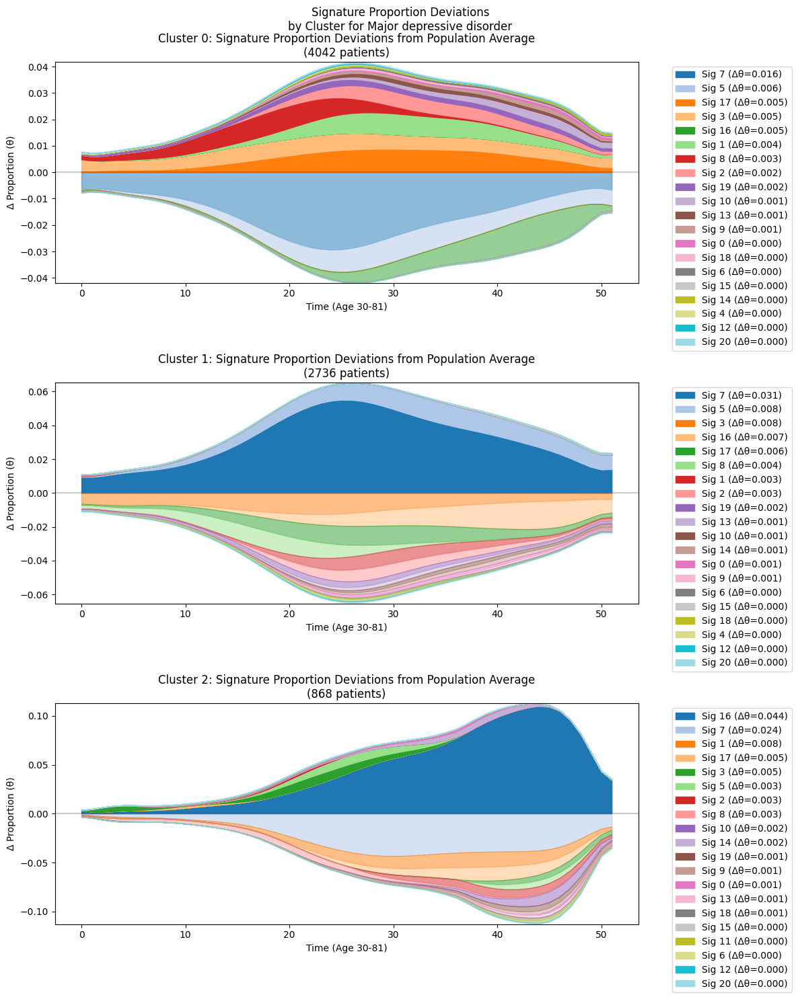

Starting analysis for disease 112 across all batches...

Loading batch 1 model for reference...
Analyzing Myocardial infarction

Processing batch 1/10 (patients 0-10000)


/var/folders/fl/ng5crz0x0fnb6c6x8dk7tfth0000gn/T/ipykernel_31623/630625531.py:18: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model1 = torch.load(model_path)
/var/folders/

Found 635 patients in batch 1

Processing batch 2/10 (patients 10000-20000)
Found 628 patients in batch 2

Processing batch 3/10 (patients 20000-30000)
Found 617 patients in batch 3

Processing batch 4/10 (patients 30000-40000)
Found 601 patients in batch 4

Processing batch 5/10 (patients 40000-50000)
Found 663 patients in batch 5

Processing batch 6/10 (patients 50000-60000)
Found 624 patients in batch 6

Processing batch 7/10 (patients 60000-70000)
Found 613 patients in batch 7

Processing batch 8/10 (patients 70000-80000)
Found 605 patients in batch 8

Processing batch 9/10 (patients 80000-90000)
Found 614 patients in batch 9

Processing batch 10/10 (patients 90000-100000)
Found 592 patients in batch 10

Total patients with Myocardial infarction: 6192
Using population average as reference

Performing clustering with 3 clusters...


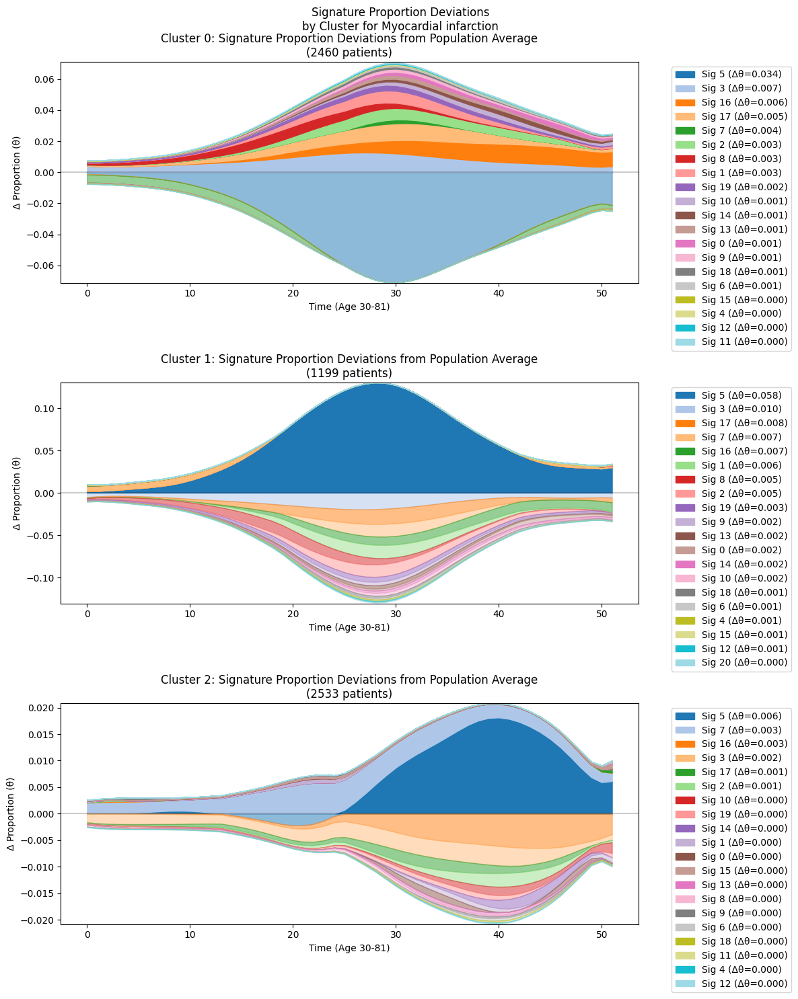

Starting analysis for disease 17 across all batches...

Loading batch 1 model for reference...
Analyzing Malignant neoplasm of female breast

Processing batch 1/10 (patients 0-10000)


/var/folders/fl/ng5crz0x0fnb6c6x8dk7tfth0000gn/T/ipykernel_31623/630625531.py:18: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model1 = torch.load(model_path)
/var/folders/

Found 423 patients in batch 1

Processing batch 2/10 (patients 10000-20000)
Found 401 patients in batch 2

Processing batch 3/10 (patients 20000-30000)
Found 409 patients in batch 3

Processing batch 4/10 (patients 30000-40000)
Found 454 patients in batch 4

Processing batch 5/10 (patients 40000-50000)
Found 464 patients in batch 5

Processing batch 6/10 (patients 50000-60000)
Found 419 patients in batch 6

Processing batch 7/10 (patients 60000-70000)
Found 461 patients in batch 7

Processing batch 8/10 (patients 70000-80000)
Found 424 patients in batch 8

Processing batch 9/10 (patients 80000-90000)
Found 471 patients in batch 9

Processing batch 10/10 (patients 90000-100000)
Found 408 patients in batch 10

Total patients with Malignant neoplasm of female breast: 4334
Using population average as reference

Performing clustering with 3 clusters...


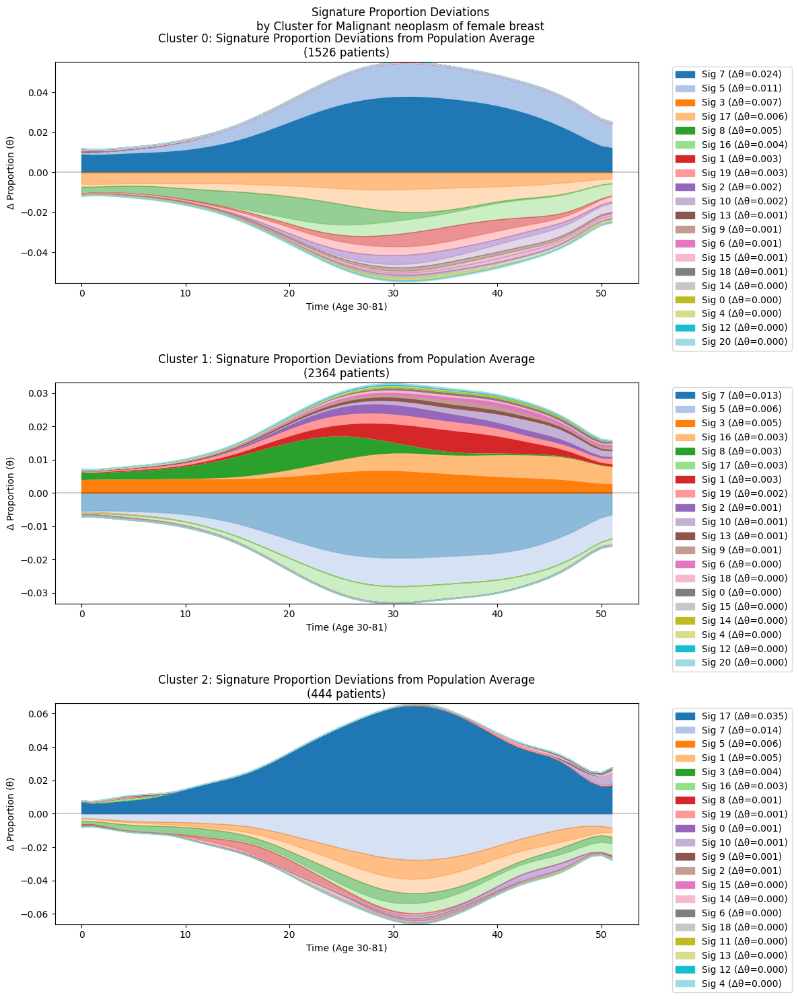

In [17]:
def plot_disease_signature_clusters_all_batches(disease_idx, batch_size=10000, n_batches=10, n_clusters=3, n_top_sigs=20, subtract_reference=True):
    """
    Plot signature proportion deviations by cluster for a specific disease across all batches
    """
    import torch
    import numpy as np
    import matplotlib.pyplot as plt
    from sklearn.cluster import KMeans
    import traceback
    
    print(f"Starting analysis for disease {disease_idx} across all batches...")
    
    # Load batch 1 model to get disease names and signature information
    model_path = '/Users/sarahurbut/Dropbox/resultshighamp/results/output_0_10000/model.pt'
    print("\nLoading batch 1 model for reference...")
    
    try:
        model1 = torch.load(model_path)
        disease_names = model1['disease_names'][0].tolist()
        K_total = model1['model_state_dict']['lambda_'].shape[1]  # Number of signatures
        time_points = model1['Y'].shape[2]  # Number of time points
        
        disease_name = disease_names[disease_idx] if disease_idx < len(disease_names) else f"Disease {disease_idx}"
        print(f"Analyzing {disease_name}")
        
        # Get reference trajectories from first batch
        if 'signature_refs' in model1:
            if model1.get('healthy_ref') is not None:
                # Create full reference including healthy state
                reference_lambda = torch.zeros((K_total, time_points))
                reference_lambda[:-1] = model1['signature_refs']  # Disease signatures
                reference_lambda[-1] = model1['healthy_ref']  # Healthy reference
                # Convert to proportions using softmax
                reference_theta = torch.softmax(reference_lambda, dim=0).detach().numpy()
            else:
                reference_theta = torch.softmax(model1['signature_refs'], dim=0).detach().numpy()
        else:
            # If no reference, we'll calculate population average later
            reference_theta = None
    except Exception as e:
        print(f"ERROR loading model: {str(e)}")
        traceback.print_exc()
        return None
    
    # Collect patients with this disease across all batches
    all_patients = []  # Will store (batch_idx, patient_idx) tuples
    all_features = []  # Will store signature proportions
    all_thetas = []    # Will store full theta matrices
    
    # Process each batch
    for batch in range(n_batches):
        start_idx = batch * batch_size
        end_idx = (batch + 1) * batch_size
        
        model_path = f'/Users/sarahurbut/Dropbox/resultshighamp/results/output_{start_idx}_{end_idx}/model.pt'
        print(f"\nProcessing batch {batch+1}/{n_batches} (patients {start_idx}-{end_idx})")
        
        try:
            model = torch.load(model_path)
            lambda_values = model['model_state_dict']['lambda_']
            Y_batch = model['Y'].numpy()
            
            # Find patients with this disease
            for i in range(Y_batch.shape[0]):
                if np.any(Y_batch[i, disease_idx]):
                    # Get signature proportions
                    theta = torch.softmax(lambda_values[i], dim=0).detach().numpy()
                    mean_props = theta.mean(axis=1)
                    
                    # Store patient data
                    all_patients.append((batch, i))
                    all_features.append(mean_props)
                    all_thetas.append(theta)
            
            print(f"Found {len(all_patients) - (0 if batch == 0 else sum(1 for p in all_patients if p[0] < batch))} patients in batch {batch+1}")
            
        except FileNotFoundError:
            print(f"Warning: Could not find model file for batch {batch}")
            break  # Assume we've reached the end of batches
        except Exception as e:
            print(f"Error processing batch {batch}: {str(e)}")
            traceback.print_exc()
            continue
    
    if len(all_patients) == 0:
        print(f"No patients found with disease {disease_idx}")
        return None
    
    print(f"\nTotal patients with {disease_name}: {len(all_patients)}")
    
    # If no reference theta, use population average
    if reference_theta is None:
        reference_theta = np.mean(all_thetas, axis=0)
        print("Using population average as reference")
    
    # Convert to numpy arrays
    all_features = np.array(all_features)
    
    # Perform clustering
    print(f"\nPerforming clustering with {n_clusters} clusters...")
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    patient_clusters = kmeans.fit_predict(all_features)
    
    # Create figure and axes
    fig, axes = plt.subplots(n_clusters, 1, figsize=(12, 5*n_clusters))
    if n_clusters == 1:
        axes = [axes]  # Make axes iterable if only one cluster
    
    time_points = np.arange(time_points)
    
    for cluster_idx in range(n_clusters):
        # Get patients in this cluster
        cluster_indices = np.where(patient_clusters == cluster_idx)[0]
        cluster_thetas = [all_thetas[i] for i in cluster_indices]
        
        # Calculate average theta for this cluster
        avg_theta = np.mean(cluster_thetas, axis=0)
        
        if subtract_reference:
            # Subtract reference from average
            avg_theta = avg_theta - reference_theta
        
        # Calculate mean deviation for each signature
        mean_props = np.abs(avg_theta).mean(axis=1)
        
        # Get top signatures by absolute mean deviation
        top_sig_idx = np.argsort(mean_props)[-n_top_sigs:][::-1]
        
        # Create stacked area plot
        bottom_pos = np.zeros(time_points.shape)
        bottom_neg = np.zeros(time_points.shape)
        colors = plt.cm.tab20(np.linspace(0, 1, n_top_sigs))
        
        for i, sig in enumerate(top_sig_idx):
            values = avg_theta[sig]
            if subtract_reference:
                # For deviations, split positive and negative
                pos_values = np.maximum(values, 0)
                neg_values = np.minimum(values, 0)
                
                axes[cluster_idx].fill_between(time_points, bottom_pos, bottom_pos + pos_values,
                                             label=f'Sig {sig} (Δθ={mean_props[sig]:.3f})',
                                             color=colors[i])
                axes[cluster_idx].fill_between(time_points, bottom_neg, bottom_neg + neg_values,
                                             color=colors[i], alpha=0.5)
                
                bottom_pos += pos_values
                bottom_neg += neg_values
            else:
                axes[cluster_idx].fill_between(time_points, bottom_pos, bottom_pos + values,
                                             label=f'Sig {sig} (θ={mean_props[sig]:.3f})',
                                             color=colors[i])
                bottom_pos += values
        
        title = f'Cluster {cluster_idx}: '
        title += 'Signature Proportion Deviations from Population Average' if subtract_reference else 'Average Signature Proportions'
        title += f'\n({len(cluster_indices)} patients)'
        
        axes[cluster_idx].set_title(title)
        axes[cluster_idx].set_xlabel('Time (Age 30-81)')
        axes[cluster_idx].set_ylabel('Δ Proportion (θ)' if subtract_reference else 'Proportion (θ)')
        axes[cluster_idx].legend(bbox_to_anchor=(1.05, 1), loc='upper left')
        
        if subtract_reference:
            # Center y-axis around 0 for deviations
            max_dev = max(abs(bottom_pos.max()), abs(bottom_neg.min()))
            axes[cluster_idx].set_ylim(-max_dev, max_dev)
            axes[cluster_idx].axhline(y=0, color='k', linestyle='-', alpha=0.2)
        else:
            axes[cluster_idx].set_ylim(0, 1.05)
    
    plt.suptitle(f'{"Signature Proportion Deviations" if subtract_reference else "Average Signature Proportions"}\n'
                f'by Cluster for {disease_name}')
    plt.tight_layout()
    plt.show()
    
    return fig

# Usage:
# For myocardial infarction (assuming it's disease index 66):
fig = plot_disease_signature_clusters_all_batches(66, n_clusters=3, n_top_sigs=20)

# For other diseases:
fig = plot_disease_signature_clusters_all_batches(112, n_clusters=3, n_top_sigs=20)
fig = plot_disease_signature_clusters_all_batches(17, n_clusters=3, n_top_sigs=20)

In [8]:
def plot_temporal_disease_prevalence(disease_idx, batch_size=10000, n_batches=10, n_clusters=3, 
                                    top_n_diseases=10, time_bins=10):
    """
    Analyze and visualize how disease prevalence changes over time for each patient cluster
    compared to the general population.
    
    Parameters:
    - disease_idx: Index of the primary disease to analyze
    - batch_size: Number of patients per batch
    - n_batches: Number of batches to process
    - n_clusters: Number of clusters to create
    - top_n_diseases: Number of top comorbid diseases to analyze
    - time_bins: Number of age bins to use for temporal analysis
    """
    import torch
    import numpy as np
    import matplotlib.pyplot as plt
    from sklearn.cluster import KMeans
    import traceback
    from scipy.stats import fisher_exact
    
    print(f"Starting temporal disease prevalence analysis for disease {disease_idx}...")
    
    # Load batch 1 model to get disease names and signature information
    model_path = '/Users/sarahurbut/Dropbox/resultshighamp/results/output_0_10000/model.pt'
    print("\nLoading batch 1 model for reference...")
    
    try:
        model1 = torch.load(model_path)
        disease_names = model1['disease_names'][0].tolist()
        K_total = model1['model_state_dict']['lambda_'].shape[1]  # Number of signatures
        time_points = model1['Y'].shape[2]  # Number of time points
        
        disease_name = disease_names[disease_idx] if disease_idx < len(disease_names) else f"Disease {disease_idx}"
        print(f"Analyzing {disease_name}")
        
    except Exception as e:
        print(f"ERROR loading model: {str(e)}")
        traceback.print_exc()
        return None
    
    # Collect patients with this disease across all batches
    all_patients = []  # Will store (batch_idx, patient_idx) tuples
    all_features = []  # Will store signature proportions
    all_disease_data = []  # Will store full disease data over time
    
    # Process each batch
    for batch in range(n_batches):
        start_idx = batch * batch_size
        end_idx = (batch + 1) * batch_size
        
        model_path = f'/Users/sarahurbut/Dropbox/resultshighamp/results/output_{start_idx}_{end_idx}/model.pt'
        print(f"\nProcessing batch {batch+1}/{n_batches} (patients {start_idx}-{end_idx})")
        
        try:
            model = torch.load(model_path)
            lambda_values = model['model_state_dict']['lambda_']
            Y_batch = model['Y'].numpy()  # Shape: [N, D, T]
            
            # Find patients with this disease
            for i in range(Y_batch.shape[0]):
                if np.any(Y_batch[i, disease_idx]):
                    # Get signature proportions
                    theta = torch.softmax(lambda_values[i], dim=0).detach().numpy()
                    mean_props = theta.mean(axis=1)
                    
                    # Store patient data
                    all_patients.append((batch, i))
                    all_features.append(mean_props)
                    all_disease_data.append(Y_batch[i])  # Full disease data over time
            
            print(f"Found {len(all_patients) - (0 if batch == 0 else sum(1 for p in all_patients if p[0] < batch))} patients in batch {batch+1}")
            
        except FileNotFoundError:
            print(f"Warning: Could not find model file for batch {batch}")
            break  # Assume we've reached the end of batches
        except Exception as e:
            print(f"Error processing batch {batch}: {str(e)}")
            traceback.print_exc()
            continue
    
    if len(all_patients) == 0:
        print(f"No patients found with disease {disease_idx}")
        return None
    
    print(f"\nTotal patients with {disease_name}: {len(all_patients)}")
    
    # Convert to numpy arrays
    all_features = np.array(all_features)
    all_disease_data = np.array(all_disease_data)  # Shape: [n_patients, D, T]
    
    # Perform clustering based on signature profiles
    print(f"\nPerforming clustering with {n_clusters} clusters...")
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    patient_clusters = kmeans.fit_predict(all_features)
    
    # Calculate overall disease prevalence (reference)
    overall_prevalence = np.mean(all_disease_data, axis=0)  # Shape: [D, T]
    
    # Find top comorbid diseases based on overall prevalence
    disease_max_prevalence = np.max(overall_prevalence, axis=1)  # Max prevalence across time
    disease_max_prevalence[disease_idx] = 0  # Exclude the primary disease
    top_diseases = np.argsort(disease_max_prevalence)[-top_n_diseases:][::-1]
    
    # Add the primary disease to the list
    if disease_idx not in top_diseases:
        top_diseases = np.append([disease_idx], top_diseases)
    
    # Create figure for temporal disease prevalence
    fig, axes = plt.subplots(len(top_diseases), n_clusters, 
                           figsize=(4*n_clusters, 3*len(top_diseases)),
                           sharex=True)
    
    # Define age range (assuming time points represent ages 30-81)
    age_range = np.linspace(30, 81, time_points)
    
    # For each disease and cluster, plot temporal prevalence
    for d_idx, d in enumerate(top_diseases):
        disease_label = disease_names[d][:30]  # Truncate long names
        
        for c_idx in range(n_clusters):
            # Get patients in this cluster
            cluster_mask = patient_clusters == c_idx
            
            # Calculate disease prevalence over time for this cluster
            cluster_prevalence = np.mean(all_disease_data[cluster_mask, d, :], axis=0)
            
            # Plot cluster prevalence vs overall prevalence
            ax = axes[d_idx, c_idx] if len(top_diseases) > 1 else axes[c_idx]
            
            # Plot overall prevalence (reference)
            ax.plot(age_range, overall_prevalence[d], 'k--', alpha=0.5, label='Population Average')
            
            # Plot cluster prevalence
            ax.plot(age_range, cluster_prevalence, 'b-', linewidth=2, 
                   label=f'Cluster {c_idx} (n={np.sum(cluster_mask)})')
            
            # Calculate and plot relative risk
            relative_risk = np.divide(cluster_prevalence, overall_prevalence[d], 
                                    out=np.ones_like(cluster_prevalence), 
                                    where=overall_prevalence[d]>0)
            
            ax_twin = ax.twinx()
            ax_twin.plot(age_range, relative_risk, 'r-', alpha=0.7, label='Relative Risk')
            ax_twin.set_ylabel('Relative Risk', color='r')
            ax_twin.tick_params(axis='y', colors='r')
            ax_twin.set_ylim(0, min(5, np.nanmax(relative_risk) * 1.2))  # Cap at 5x for visualization
            
            # Add horizontal line at RR=1
            ax_twin.axhline(y=1, color='r', linestyle=':', alpha=0.5)
            
            # Set titles and labels
            if d_idx == 0:
                ax.set_title(f'Cluster {c_idx} (n={np.sum(cluster_mask)})')
            
            if c_idx == 0:
                ax.set_ylabel(f'{disease_label}\nPrevalence')
            
            if d_idx == len(top_diseases) - 1:
                ax.set_xlabel('Age')
            
            # Add legend to first plot only
            if d_idx == 0 and c_idx == 0:
                lines1, labels1 = ax.get_legend_handles_labels()
                lines2, labels2 = ax_twin.get_legend_handles_labels()
                ax.legend(lines1 + lines2, labels1 + labels2, loc='upper left')
            
            # Highlight peak prevalence age
            peak_age_idx = np.argmax(cluster_prevalence)
            peak_age = age_range[peak_age_idx]
            peak_prev = cluster_prevalence[peak_age_idx]
            
            ax.scatter(peak_age, peak_prev, color='blue', s=50, zorder=5)
            ax.text(peak_age, peak_prev*1.1, f'Peak: {peak_age:.0f}y', 
                   ha='center', va='bottom', fontsize=8)
    
    plt.suptitle(f'Temporal Disease Prevalence Patterns for {disease_name} Patient Clusters', 
                fontsize=16)
    plt.tight_layout()
    plt.subplots_adjust(top=0.95)
    plt.show()
    
    return {
        'fig': fig,
        'patient_clusters': patient_clusters,
        'all_patients': all_patients,
        'all_disease_data': all_disease_data,
        'disease_names': disease_names,
        'top_diseases': top_diseases,
        'disease_idx': disease_idx,
        'disease_name': disease_name
    }

Starting temporal disease prevalence analysis for disease 67...

Loading batch 1 model for reference...
Analyzing Anxiety disorder

Processing batch 1/10 (patients 0-10000)
Found 537 patients in batch 1

Processing batch 2/10 (patients 10000-20000)


/var/folders/fl/ng5crz0x0fnb6c6x8dk7tfth0000gn/T/ipykernel_41712/2644694048.py:29: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model1 = torch.load(model_path)
/var/folders

Found 554 patients in batch 2

Processing batch 3/10 (patients 20000-30000)
Found 547 patients in batch 3

Processing batch 4/10 (patients 30000-40000)
Found 570 patients in batch 4

Processing batch 5/10 (patients 40000-50000)
Found 576 patients in batch 5

Processing batch 6/10 (patients 50000-60000)
Found 532 patients in batch 6

Processing batch 7/10 (patients 60000-70000)
Found 568 patients in batch 7

Processing batch 8/10 (patients 70000-80000)
Found 575 patients in batch 8

Processing batch 9/10 (patients 80000-90000)
Found 531 patients in batch 9

Processing batch 10/10 (patients 90000-100000)
Found 582 patients in batch 10

Total patients with Anxiety disorder: 5572

Performing clustering with 3 clusters...


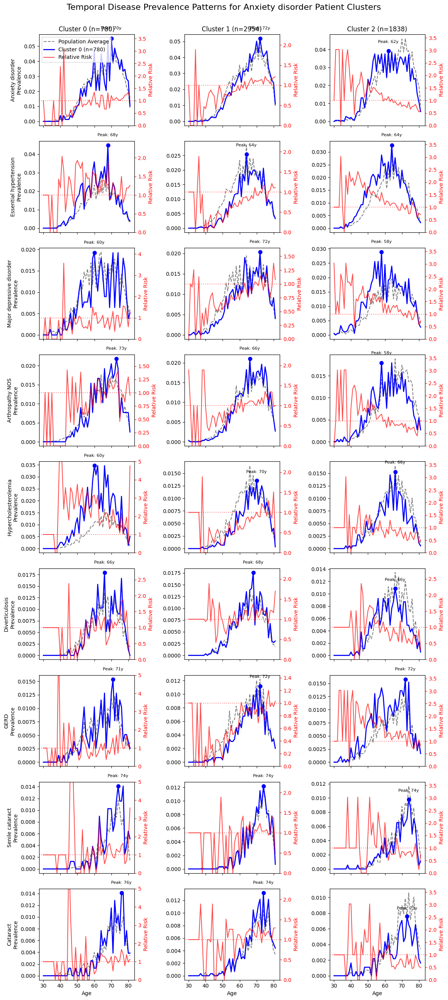

In [12]:
# For breast cancer (disease index 17)
results = plot_temporal_disease_prevalence(67, n_clusters=3, top_n_diseases=8)

# Save the figure
results['fig'].savefig('bpd.png', dpi=300, bbox_inches='tight')

In [19]:
import torch 

In [21]:
model_path = '/Users/sarahurbut/Dropbox/resultshighamp/results/output_0_10000/model.pt'
model1 = torch.load(model_path)
disease_names = model1['disease_names'][0].tolist()
K_total = model1['model_state_dict']['lambda_'].shape[1]  # Number of signatures
time_points = model1['Y'].shape[2]  # Number of time points

# Get X dimensions
if 'G' in model1:
    X_dim = model1['G'].shape[1]
    genetic_factor_names = [f"G_{i}" for i in range(X_dim)]

print(X_dim)
 

36


/var/folders/fl/ng5crz0x0fnb6c6x8dk7tfth0000gn/T/ipykernel_41712/4223421977.py:2: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model1 = torch.load(model_path)


In [22]:
def analyze_genetic_data_by_cluster(disease_idx, batch_size=10000, n_batches=10, n_clusters=3):
    """
    Analyze genetic/demographic data (G matrix/X data) across patient clusters
    for a specific disease
    
    Parameters:
    - disease_idx: Index of the disease to analyze
    - batch_size: Number of patients per batch
    - n_batches: Number of batches to process
    - n_clusters: Number of clusters to create
    """
    import torch
    import numpy as np
    import matplotlib.pyplot as plt
    from sklearn.cluster import KMeans
    import pandas as pd
    import seaborn as sns
    from scipy import stats
    
    print(f"Starting genetic data analysis for disease {disease_idx}...")
    
    # Load batch 1 model to get disease names and signature information
    model_path = '/Users/sarahurbut/Dropbox/resultshighamp/results/output_0_10000/model.pt'
    print("\nLoading batch 1 model for reference...")
    
    try:
        model1 = torch.load(model_path)
        disease_names = model1['disease_names'][0].tolist()
        K_total = model1['model_state_dict']['lambda_'].shape[1]  # Number of signatures
        time_points = model1['Y'].shape[2]  # Number of time points
        
        # Get X dimensions
        if 'X' in model1:
            X_dim = model1['G'].shape[1]
            genetic_factor_names = [f"G_{i}" for i in range(X_dim)]
        else:
            print("Warning: X matrix not found in first batch. Will try to determine dimensions from later batches.")
            genetic_factor_names = None
        
        disease_name = disease_names[disease_idx] if disease_idx < len(disease_names) else f"Disease {disease_idx}"
        print(f"Analyzing {disease_name}")
        
    except Exception as e:
        print(f"ERROR loading model: {str(e)}")
        import traceback
        traceback.print_exc()
        return None
    
    # Collect patients with this disease across all batches
    all_patients = []  # Will store (batch_idx, patient_idx) tuples
    all_features = []  # Will store signature proportions
    all_genetic_data = []  # Will store genetic/demographic data (X/G matrix)
    
    # Process each batch
    for batch in range(n_batches):
        start_idx = batch * batch_size
        end_idx = (batch + 1) * batch_size
        
        model_path = f'/Users/sarahurbut/Dropbox/resultshighamp/results/output_{start_idx}_{end_idx}/model.pt'
        print(f"\nProcessing batch {batch+1}/{n_batches} (patients {start_idx}-{end_idx})")
        
        try:
            model = torch.load(model_path)
            lambda_values = model['model_state_dict']['lambda_']
            Y_batch = model['Y'].numpy()
            
            # Get genetic data (X/G matrix) for this batch
            if 'G' in model:
                X_batch = model['G'].numpy()  # Patient genetic/demographic data
                
                # If we don't have factor names yet, create them
                if genetic_factor_names is None:
                    X_dim = X_batch.shape[1]
                    genetic_factor_names = [f"G_{i}" for i in range(X_dim)]
            else:
                print(f"Warning: G matrix not found in batch {batch}")
                continue
            
            # Find patients with this disease
            for i in range(Y_batch.shape[0]):
                if np.any(Y_batch[i, disease_idx]):
                    # Get signature proportions
                    theta = torch.softmax(lambda_values[i], dim=0).detach().numpy()
                    mean_props = theta.mean(axis=1)
                    
                    # Store patient data
                    all_patients.append((batch, i))
                    all_features.append(mean_props)
                    all_genetic_data.append(X_batch[i])
            
            print(f"Found {len(all_patients) - (0 if batch == 0 else sum(1 for p in all_patients if p[0] < batch))} patients in batch {batch+1}")
            
        except FileNotFoundError:
            print(f"Warning: Could not find model file for batch {batch}")
            break  # Assume we've reached the end of batches
        except Exception as e:
            print(f"Error processing batch {batch}: {str(e)}")
            import traceback
            traceback.print_exc()
            continue
    
    if len(all_patients) == 0:
        print(f"No patients found with disease {disease_idx}")
        return None
    
    print(f"\nTotal patients with {disease_name}: {len(all_patients)}")
    
    # Convert to numpy arrays
    all_features = np.array(all_features)
    all_genetic_data = np.array(all_genetic_data)
    
    # Perform clustering based on signature profiles
    print(f"\nPerforming clustering with {n_clusters} clusters...")
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    patient_clusters = kmeans.fit_predict(all_features)
    
    # Analyze genetic data by cluster
    genetic_by_cluster = {}
    for cluster in range(n_clusters):
        cluster_mask = patient_clusters == cluster
        genetic_by_cluster[cluster] = all_genetic_data[cluster_mask]
    
    # Calculate mean genetic values for each cluster
    mean_genetic = {cluster: np.mean(values, axis=0) for cluster, values in genetic_by_cluster.items()}
    
    # Perform statistical testing
    p_values = np.ones((len(genetic_factor_names), n_clusters))
    effect_sizes = np.zeros((len(genetic_factor_names), n_clusters))
    
    for factor_idx in range(len(genetic_factor_names)):
        for cluster in range(n_clusters):
            # Compare this cluster to all others for this factor
            cluster_values = all_genetic_data[patient_clusters == cluster, factor_idx]
            other_values = all_genetic_data[patient_clusters != cluster, factor_idx]
            
            # t-test
            t_stat, p_val = stats.ttest_ind(cluster_values, other_values)
            p_values[factor_idx, cluster] = p_val
            
            # Effect size (Cohen's d)
            mean_diff = np.mean(cluster_values) - np.mean(other_values)
            pooled_std = np.sqrt(((len(cluster_values) - 1) * np.var(cluster_values) + 
                                 (len(other_values) - 1) * np.var(other_values)) / 
                                (len(cluster_values) + len(other_values) - 2))
            effect_sizes[factor_idx, cluster] = mean_diff / pooled_std if pooled_std > 0 else 0
    
    # Apply multiple testing correction
    from statsmodels.stats.multitest import multipletests
    _, p_values_corrected, _, _ = multipletests(p_values.flatten(), method='fdr_bh')
    p_values_corrected = p_values_corrected.reshape(p_values.shape)
    
    # Create dataframe for visualization
    genetic_df = pd.DataFrame({
        'Factor': np.repeat(genetic_factor_names, n_clusters),
        'Cluster': np.tile(np.arange(n_clusters), len(genetic_factor_names)),
        'Mean_Value': np.concatenate([mean_genetic[c] for c in range(n_clusters)]),
        'P_Value': p_values.flatten(),
        'P_Value_Corrected': p_values_corrected.flatten(),
        'Effect_Size': effect_sizes.flatten()
    })
    
    # Add significance indicator
    genetic_df['Significant'] = genetic_df['P_Value_Corrected'] < 0.05
    
    # Create heatmap of mean genetic values
    plt.figure(figsize=(12, 10))
    
    # Find top differentiating factors
    factor_variance = np.var([mean_genetic[c] for c in range(n_clusters)], axis=0)
    top_factors = np.argsort(factor_variance)[-20:]  # Top 20 factors with highest variance across clusters
    
    # Reshape data for heatmap (using only top factors)
    heatmap_data = np.zeros((len(top_factors), n_clusters))
    for i, f in enumerate(top_factors):
        for c in range(n_clusters):
            heatmap_data[i, c] = mean_genetic[c][f]
    
    # Create heatmap
    ax = sns.heatmap(heatmap_data, annot=True, fmt=".3f", 
                    xticklabels=[f"Cluster {i}\n(n={np.sum(patient_clusters == i)})" for i in range(n_clusters)],
                    yticklabels=[genetic_factor_names[i] for i in top_factors],
                    cmap="RdBu_r", center=0)
    
    plt.title(f"Top Genetic Factors by Cluster for {disease_name}")
    plt.tight_layout()
    
    # Create bar plot for top significant factors
    plt.figure(figsize=(14, 12))
    
    # Find top significant factors
    significant_factors = np.where(np.any(p_values_corrected < 0.05, axis=1))[0]
    if len(significant_factors) > 0:
        # Sort by maximum effect size
        max_effect_sizes = np.max(np.abs(effect_sizes[significant_factors]), axis=1)
        top_sig_factors = significant_factors[np.argsort(max_effect_sizes)[-min(10, len(significant_factors)):]]
        
        # Create subplot for each top factor
        for i, factor_idx in enumerate(top_sig_factors):
            plt.subplot(5, 2, i+1)
            
            # Get values for this factor across clusters
            factor_values = [mean_genetic[c][factor_idx] for c in range(n_clusters)]
            
            # Create bar plot
            bars = plt.bar(range(n_clusters), factor_values)
            
            # Color bars by significance
            for c, bar in enumerate(bars):
                if p_values_corrected[factor_idx, c] < 0.05:
                    bar.set_color('red')
            
            # Add significance stars
            for c in range(n_clusters):
                if p_values_corrected[factor_idx, c] < 0.001:
                    plt.text(c, factor_values[c], '***', ha='center')
                elif p_values_corrected[factor_idx, c] < 0.01:
                    plt.text(c, factor_values[c], '**', ha='center')
                elif p_values_corrected[factor_idx, c] < 0.05:
                    plt.text(c, factor_values[c], '*', ha='center')
            
            plt.title(f"{genetic_factor_names[factor_idx]}")
            plt.xticks(range(n_clusters), [f"Cluster {i}" for i in range(n_clusters)])
            plt.axhline(y=0, color='k', linestyle='-', alpha=0.2)
            
            # Add effect size
            for c in range(n_clusters):
                plt.text(c, factor_values[c]/2, f"d={effect_sizes[factor_idx, c]:.2f}", 
                        ha='center', va='center', color='white' if effect_sizes[factor_idx, c] > 0.5 else 'black')
        
        plt.suptitle(f"Top Significant Genetic Factors for {disease_name} Clusters")
        plt.tight_layout()
        plt.subplots_adjust(top=0.9)
    else:
        plt.text(0.5, 0.5, "No significant factors found after correction", 
                ha='center', va='center', fontsize=14)
        plt.axis('off')
    
    # Return results for further analysis
    return {
        'genetic_by_cluster': genetic_by_cluster,
        'mean_genetic': mean_genetic,
        'p_values': p_values,
        'p_values_corrected': p_values_corrected,
        'effect_sizes': effect_sizes,
        'genetic_factor_names': genetic_factor_names,
        'patient_clusters': patient_clusters,
        'genetic_df': genetic_df,
        'all_patients': all_patients
    }

Starting genetic data analysis for disease 66...

Loading batch 1 model for reference...
Analyzing Major depressive disorder

Processing batch 1/10 (patients 0-10000)


/var/folders/fl/ng5crz0x0fnb6c6x8dk7tfth0000gn/T/ipykernel_41712/2407219982.py:27: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model1 = torch.load(model_path)
/var/folders

Found 723 patients in batch 1

Processing batch 2/10 (patients 10000-20000)
Found 744 patients in batch 2

Processing batch 3/10 (patients 20000-30000)
Found 716 patients in batch 3

Processing batch 4/10 (patients 30000-40000)
Found 782 patients in batch 4

Processing batch 5/10 (patients 40000-50000)
Found 770 patients in batch 5

Processing batch 6/10 (patients 50000-60000)
Found 798 patients in batch 6

Processing batch 7/10 (patients 60000-70000)
Found 801 patients in batch 7

Processing batch 8/10 (patients 70000-80000)
Found 771 patients in batch 8

Processing batch 9/10 (patients 80000-90000)
Found 753 patients in batch 9

Processing batch 10/10 (patients 90000-100000)
Found 788 patients in batch 10

Total patients with Major depressive disorder: 7646

Performing clustering with 3 clusters...

Top genetic factors for Cluster 0:
   Factor  Mean_Value  Effect_Size  P_Value_Corrected
54   G_18    0.483013    -0.606702      3.707353e-146
60   G_20   -0.008480    -0.547170      3.46

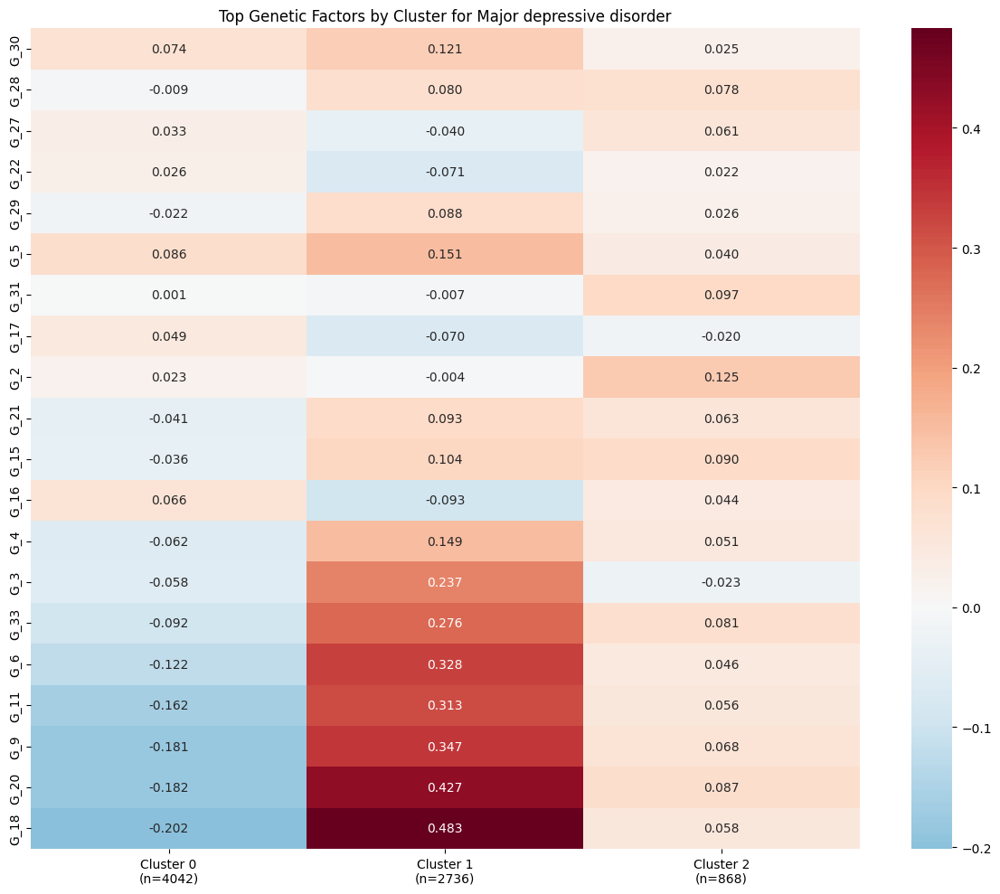

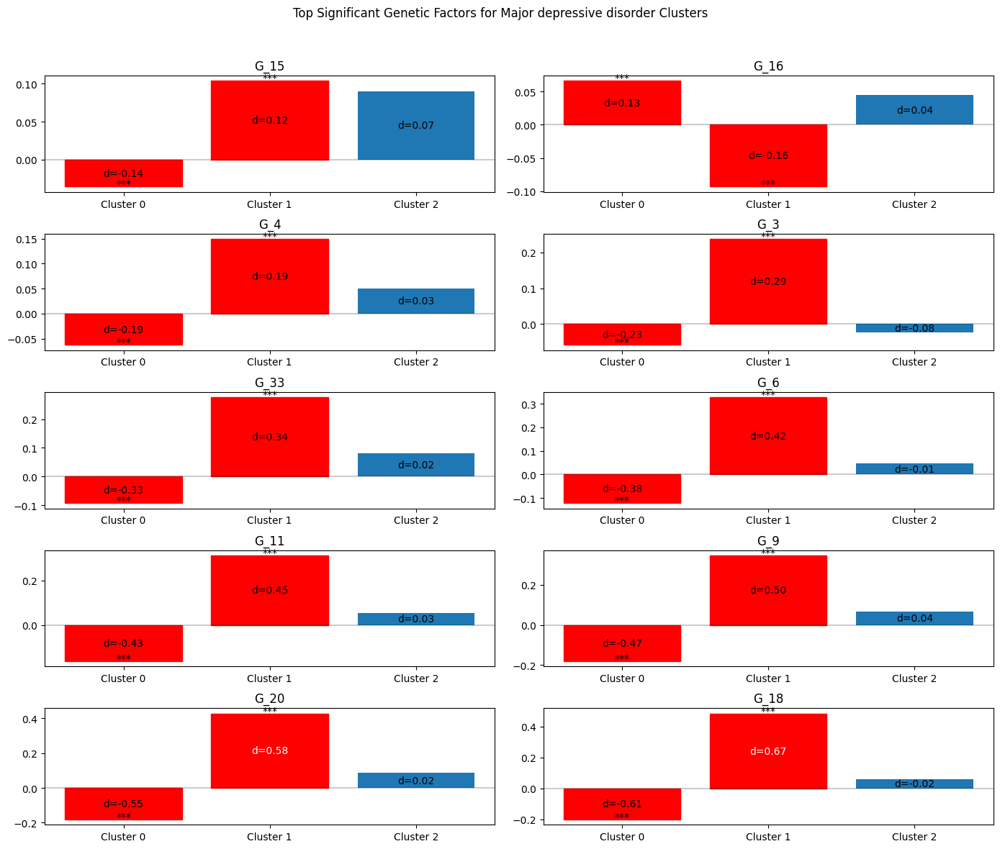

In [23]:
# For myocardial infarction (disease index 66)
genetic_results = analyze_genetic_data_by_cluster(66, n_clusters=3)

# To find the most significant genetic factors for each cluster
for cluster in range(3):
    print(f"\nTop genetic factors for Cluster {cluster}:")
    cluster_results = genetic_results['genetic_df'][
        (genetic_results['genetic_df']['Cluster'] == cluster) & 
        (genetic_results['genetic_df']['Significant'])
    ].sort_values('Effect_Size', key=abs, ascending=False)
    
    if len(cluster_results) > 0:
        print(cluster_results[['Factor', 'Mean_Value', 'Effect_Size', 'P_Value_Corrected']].head(5))
    else:
        print("No significant factors found")

# If you know specific genetic risk scores of interest
cad_prs_indices = []  # Fill with indices of CAD PRS or genetic risk factors
if cad_prs_indices:
    print("\nAnalyzing CAD genetic risk factors:")
    for idx in cad_prs_indices:
        factor_name = genetic_results['genetic_factor_names'][idx]
        print(f"\n{factor_name}:")
        for cluster in range(3):
            mean_val = genetic_results['mean_genetic'][cluster][idx]
            p_val = genetic_results['p_values_corrected'][idx, cluster]
            effect = genetic_results['effect_sizes'][idx, cluster]
            print(f"  Cluster {cluster}: Mean={mean_val:.4f}, Effect Size={effect:.2f}, p={p_val:.4f}")

Starting genetic data analysis for disease 66...
Loaded 36 PRS names from ~/Dropbox/prs_names.csv

Loading batch 1 model for reference...
Analyzing Major depressive disorder

Processing batch 1/10 (patients 0-10000)
Found 723 patients in batch 1

Processing batch 2/10 (patients 10000-20000)


/var/folders/fl/ng5crz0x0fnb6c6x8dk7tfth0000gn/T/ipykernel_41712/969237693.py:41: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model1 = torch.load(model_path)
/var/folders/

Found 744 patients in batch 2

Processing batch 3/10 (patients 20000-30000)
Found 716 patients in batch 3

Processing batch 4/10 (patients 30000-40000)
Found 782 patients in batch 4

Processing batch 5/10 (patients 40000-50000)
Found 770 patients in batch 5

Processing batch 6/10 (patients 50000-60000)
Found 798 patients in batch 6

Processing batch 7/10 (patients 60000-70000)
Found 801 patients in batch 7

Processing batch 8/10 (patients 70000-80000)
Found 771 patients in batch 8

Processing batch 9/10 (patients 80000-90000)
Found 753 patients in batch 9

Processing batch 10/10 (patients 90000-100000)
Found 788 patients in batch 10

Total patients with Major depressive disorder: 7646

Performing clustering with 3 clusters...

Top genetic factors for Cluster 0:
   Factor  Mean_Value  Effect_Size  P_Value_Corrected
54     HT    0.483013    -0.606702      3.707353e-146
60    ISS   -0.008480    -0.547170      3.466190e-120
27    CVD    0.032692    -0.473843       3.099849e-91
33    CAD   

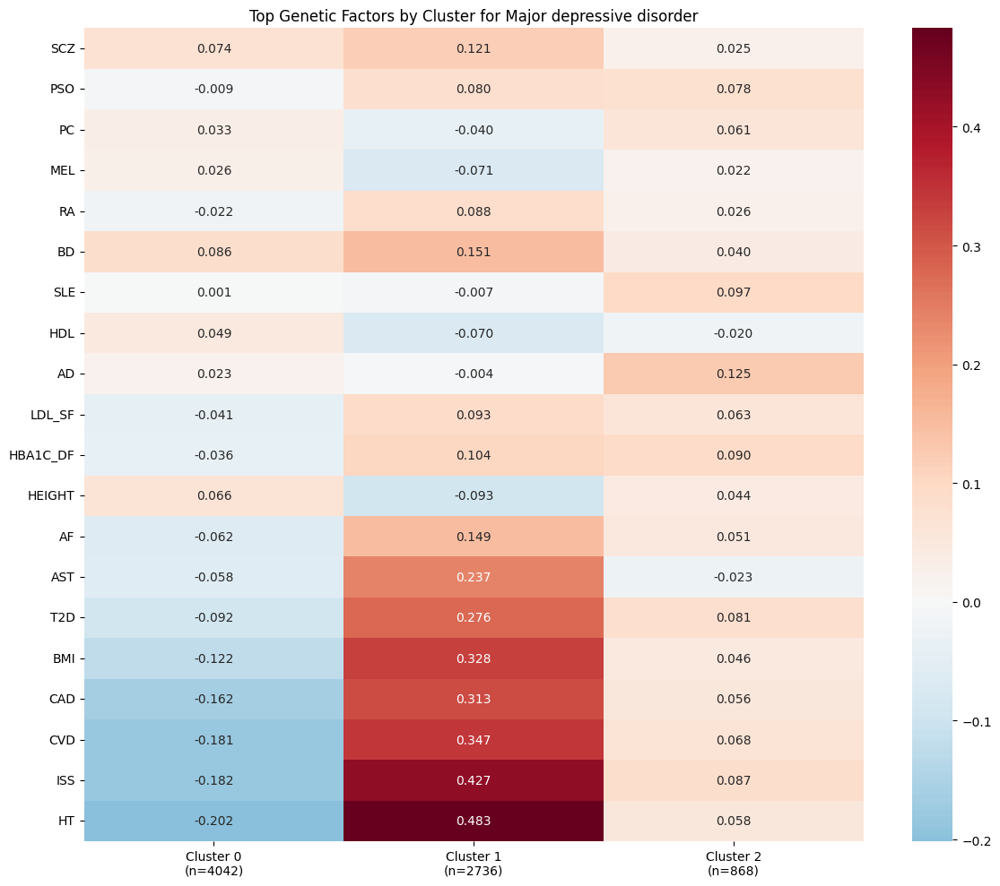

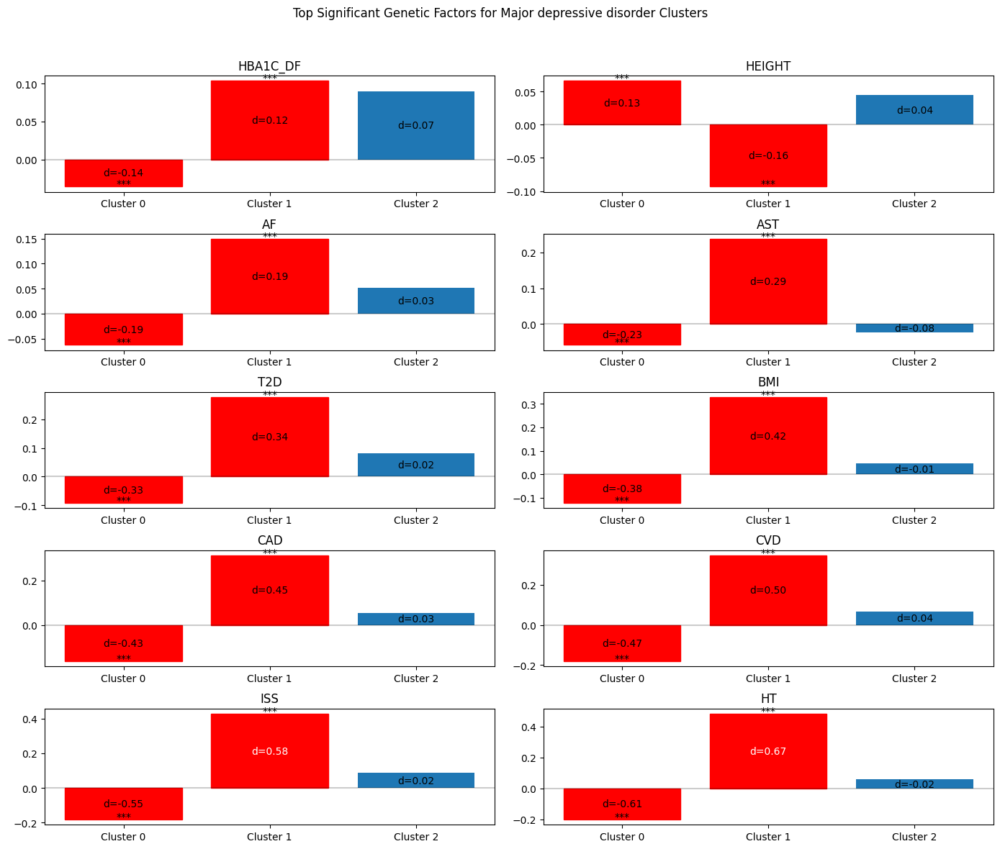

In [26]:
def analyze_genetic_data_by_cluster(disease_idx, batch_size=10000, n_batches=10, n_clusters=3, prs_names_file=None):
    """
    Analyze genetic/demographic data (G matrix/X data) across patient clusters
    for a specific disease
    
    Parameters:
    - disease_idx: Index of the disease to analyze
    - batch_size: Number of patients per batch
    - n_batches: Number of batches to process
    - n_clusters: Number of clusters to create
    - prs_names_file: Path to CSV file containing PRS names
    """
    import torch
    import numpy as np
    import matplotlib.pyplot as plt
    from sklearn.cluster import KMeans
    import pandas as pd
    import seaborn as sns
    from scipy import stats
    
    print(f"Starting genetic data analysis for disease {disease_idx}...")
    
    # Load PRS names if file is provided
    if prs_names_file:
        try:
            prs_df = pd.read_csv(prs_names_file)
            print(f"Loaded {len(prs_df)} PRS names from {prs_names_file}")
            # Create a dictionary to map indices to names
            prs_names_dict = {i: name for i, name in enumerate(prs_df.iloc[:, 0])} if len(prs_df.columns) > 0 else {}
        except Exception as e:
            print(f"Error loading PRS names: {str(e)}")
            prs_names_dict = {}
    else:
        prs_names_dict = {}
    
    # Load batch 1 model to get disease names and signature information
    model_path = '/Users/sarahurbut/Dropbox/resultshighamp/results/output_0_10000/model.pt'
    print("\nLoading batch 1 model for reference...")
    
    try:
        model1 = torch.load(model_path)
        disease_names = model1['disease_names'][0].tolist()
        K_total = model1['model_state_dict']['lambda_'].shape[1]  # Number of signatures
        time_points = model1['Y'].shape[2]  # Number of time points
        
        # Get X dimensions
        if 'G' in model1:
            X_dim = model1['G'].shape[1]
            # Use PRS names if available, otherwise use generic names
            genetic_factor_names = [prs_names_dict.get(i, f"G_{i}") for i in range(X_dim)]
        else:
            print("Warning: G matrix not found in first batch. Will try to determine dimensions from later batches.")
            genetic_factor_names = None
        
        disease_name = disease_names[disease_idx] if disease_idx < len(disease_names) else f"Disease {disease_idx}"
        print(f"Analyzing {disease_name}")
        
    except Exception as e:
        print(f"ERROR loading model: {str(e)}")
        import traceback
        traceback.print_exc()
        return None
    
    # Collect patients with this disease across all batches
    all_patients = []  # Will store (batch_idx, patient_idx) tuples
    all_features = []  # Will store signature proportions
    all_genetic_data = []  # Will store genetic/demographic data (X/G matrix)
    
    # Process each batch
    for batch in range(n_batches):
        start_idx = batch * batch_size
        end_idx = (batch + 1) * batch_size
        
        model_path = f'/Users/sarahurbut/Dropbox/resultshighamp/results/output_{start_idx}_{end_idx}/model.pt'
        print(f"\nProcessing batch {batch+1}/{n_batches} (patients {start_idx}-{end_idx})")
        
        try:
            model = torch.load(model_path)
            lambda_values = model['model_state_dict']['lambda_']
            Y_batch = model['Y'].numpy()
            
            # Get genetic data (X/G matrix) for this batch
            if 'G' in model:
                X_batch = model['G'].numpy()  # Patient genetic/demographic data
                
                # If we don't have factor names yet, create them
                if genetic_factor_names is None:
                    X_dim = X_batch.shape[1]
                    genetic_factor_names = [prs_names_dict.get(i, f"G_{i}") for i in range(X_dim)]
            else:
                print(f"Warning: G matrix not found in batch {batch}")
                continue
            
            # Find patients with this disease
            for i in range(Y_batch.shape[0]):
                if np.any(Y_batch[i, disease_idx]):
                    # Get signature proportions
                    theta = torch.softmax(lambda_values[i], dim=0).detach().numpy()
                    mean_props = theta.mean(axis=1)
                    
                    # Store patient data
                    all_patients.append((batch, i))
                    all_features.append(mean_props)
                    all_genetic_data.append(X_batch[i])
            
            print(f"Found {len(all_patients) - (0 if batch == 0 else sum(1 for p in all_patients if p[0] < batch))} patients in batch {batch+1}")
            
        except FileNotFoundError:
            print(f"Warning: Could not find model file for batch {batch}")
            break  # Assume we've reached the end of batches
        except Exception as e:
            print(f"Error processing batch {batch}: {str(e)}")
            import traceback
            traceback.print_exc()
            continue
    
    if len(all_patients) == 0:
        print(f"No patients found with disease {disease_idx}")
        return None
    
    print(f"\nTotal patients with {disease_name}: {len(all_patients)}")
    
    # Convert to numpy arrays
    all_features = np.array(all_features)
    all_genetic_data = np.array(all_genetic_data)
    
    # Perform clustering based on signature profiles
    print(f"\nPerforming clustering with {n_clusters} clusters...")
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    patient_clusters = kmeans.fit_predict(all_features)
    
    # Analyze genetic data by cluster
    genetic_by_cluster = {}
    for cluster in range(n_clusters):
        cluster_mask = patient_clusters == cluster
        genetic_by_cluster[cluster] = all_genetic_data[cluster_mask]
    
    # Calculate mean genetic values for each cluster
    mean_genetic = {cluster: np.mean(values, axis=0) for cluster, values in genetic_by_cluster.items()}
    
    # Perform statistical testing
    p_values = np.ones((len(genetic_factor_names), n_clusters))
    effect_sizes = np.zeros((len(genetic_factor_names), n_clusters))
    
    for factor_idx in range(len(genetic_factor_names)):
        for cluster in range(n_clusters):
            # Compare this cluster to all others for this factor
            cluster_values = all_genetic_data[patient_clusters == cluster, factor_idx]
            other_values = all_genetic_data[patient_clusters != cluster, factor_idx]
            
            # t-test
            t_stat, p_val = stats.ttest_ind(cluster_values, other_values)
            p_values[factor_idx, cluster] = p_val
            
            # Effect size (Cohen's d)
            mean_diff = np.mean(cluster_values) - np.mean(other_values)
            pooled_std = np.sqrt(((len(cluster_values) - 1) * np.var(cluster_values) + 
                                 (len(other_values) - 1) * np.var(other_values)) / 
                                (len(cluster_values) + len(other_values) - 2))
            effect_sizes[factor_idx, cluster] = mean_diff / pooled_std if pooled_std > 0 else 0
    
    # Apply multiple testing correction
    from statsmodels.stats.multitest import multipletests
    _, p_values_corrected, _, _ = multipletests(p_values.flatten(), method='fdr_bh')
    p_values_corrected = p_values_corrected.reshape(p_values.shape)
    
    # Create dataframe for visualization
    genetic_df = pd.DataFrame({
        'Factor': np.repeat(genetic_factor_names, n_clusters),
        'Cluster': np.tile(np.arange(n_clusters), len(genetic_factor_names)),
        'Mean_Value': np.concatenate([mean_genetic[c] for c in range(n_clusters)]),
        'P_Value': p_values.flatten(),
        'P_Value_Corrected': p_values_corrected.flatten(),
        'Effect_Size': effect_sizes.flatten()
    })
    
    # Add significance indicator
    genetic_df['Significant'] = genetic_df['P_Value_Corrected'] < 0.05
    
    # Create heatmap of mean genetic values
    plt.figure(figsize=(12, 10))
    
    # Find top differentiating factors
    factor_variance = np.var([mean_genetic[c] for c in range(n_clusters)], axis=0)
    top_factors = np.argsort(factor_variance)[-20:]  # Top 20 factors with highest variance across clusters
    
    # Reshape data for heatmap (using only top factors)
    heatmap_data = np.zeros((len(top_factors), n_clusters))
    for i, f in enumerate(top_factors):
        for c in range(n_clusters):
            heatmap_data[i, c] = mean_genetic[c][f]
    
    # Create heatmap
    ax = sns.heatmap(heatmap_data, annot=True, fmt=".3f", 
                    xticklabels=[f"Cluster {i}\n(n={np.sum(patient_clusters == i)})" for i in range(n_clusters)],
                    yticklabels=[genetic_factor_names[i] for i in top_factors],
                    cmap="RdBu_r", center=0)
    
    plt.title(f"Top Genetic Factors by Cluster for {disease_name}")
    plt.tight_layout()
    
    # Create bar plot for top significant factors
    plt.figure(figsize=(14, 12))
    
    # Find top significant factors
    significant_factors = np.where(np.any(p_values_corrected < 0.05, axis=1))[0]
    if len(significant_factors) > 0:
        # Sort by maximum effect size
        max_effect_sizes = np.max(np.abs(effect_sizes[significant_factors]), axis=1)
        top_sig_factors = significant_factors[np.argsort(max_effect_sizes)[-min(10, len(significant_factors)):]]
        
        # Create subplot for each top factor
        for i, factor_idx in enumerate(top_sig_factors):
            plt.subplot(5, 2, i+1)
            
            # Get values for this factor across clusters
            factor_values = [mean_genetic[c][factor_idx] for c in range(n_clusters)]
            
            # Create bar plot
            bars = plt.bar(range(n_clusters), factor_values)
            
            # Color bars by significance
            for c, bar in enumerate(bars):
                if p_values_corrected[factor_idx, c] < 0.05:
                    bar.set_color('red')
            
            # Add significance stars
            for c in range(n_clusters):
                if p_values_corrected[factor_idx, c] < 0.001:
                    plt.text(c, factor_values[c], '***', ha='center')
                elif p_values_corrected[factor_idx, c] < 0.01:
                    plt.text(c, factor_values[c], '**', ha='center')
                elif p_values_corrected[factor_idx, c] < 0.05:
                    plt.text(c, factor_values[c], '*', ha='center')
            
            plt.title(f"{genetic_factor_names[factor_idx]}")
            plt.xticks(range(n_clusters), [f"Cluster {i}" for i in range(n_clusters)])
            plt.axhline(y=0, color='k', linestyle='-', alpha=0.2)
            
            # Add effect size
            for c in range(n_clusters):
                plt.text(c, factor_values[c]/2, f"d={effect_sizes[factor_idx, c]:.2f}", 
                        ha='center', va='center', color='white' if effect_sizes[factor_idx, c] > 0.5 else 'black')
        
        plt.suptitle(f"Top Significant Genetic Factors for {disease_name} Clusters")
        plt.tight_layout()
        plt.subplots_adjust(top=0.9)
    else:
        plt.text(0.5, 0.5, "No significant factors found after correction", 
                ha='center', va='center', fontsize=14)
        plt.axis('off')
    
    # Return results for further analysis
    return {
        'genetic_by_cluster': genetic_by_cluster,
        'mean_genetic': mean_genetic,
        'p_values': p_values,
        'p_values_corrected': p_values_corrected,
        'effect_sizes': effect_sizes,
        'genetic_factor_names': genetic_factor_names,
        'patient_clusters': patient_clusters,
        'genetic_df': genetic_df,
        'all_patients': all_patients
    }


# For myocardial infarction (disease index 66)
genetic_results = analyze_genetic_data_by_cluster(66, n_clusters=3, 
                                                 prs_names_file='~/Dropbox/prs_names.csv')

# To find the most significant genetic factors for each cluster
for cluster in range(3):
    print(f"\nTop genetic factors for Cluster {cluster}:")
    cluster_results = genetic_results['genetic_df'][
        (genetic_results['genetic_df']['Cluster'] == cluster) & 
        (genetic_results['genetic_df']['Significant'])
    ].sort_values('Effect_Size', key=abs, ascending=False)
    
    if len(cluster_results) > 0:
        print(cluster_results[['Factor', 'Mean_Value', 'Effect_Size', 'P_Value_Corrected']].head(5))
    else:
        print("No significant factors found")

# If you know specific PRS of interest (now using names instead of indices)
prs_of_interest = ['CAD_PRS', 'BMI_PRS', 'LDL_PRS']  # Replace with actual PRS names
if prs_of_interest:
    print("\nAnalyzing specific genetic risk factors:")
    for prs_name in prs_of_interest:
        # Find the index of this PRS
        if prs_name in genetic_results['genetic_factor_names']:
            idx = genetic_results['genetic_factor_names'].index(prs_name)
            print(f"\n{prs_name}:")
            for cluster in range(3):
                mean_val = genetic_results['mean_genetic'][cluster][idx]
                p_val = genetic_results['p_values_corrected'][idx, cluster]
                effect = genetic_results['effect_sizes'][idx, cluster]
                print(f"  Cluster {cluster}: Mean={mean_val:.4f}, Effect Size={effect:.2f}, p={p_val:.4f}")
        else:
            print(f"{prs_name} not found in genetic factors")

Starting genetic data analysis for disease 112...
Loaded 36 PRS names from ~/Dropbox/prs_names.csv

Loading batch 1 model for reference...
Analyzing Myocardial infarction

Processing batch 1/10 (patients 0-10000)


/var/folders/fl/ng5crz0x0fnb6c6x8dk7tfth0000gn/T/ipykernel_41712/969237693.py:41: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model1 = torch.load(model_path)
/var/folders/

Found 635 patients in batch 1

Processing batch 2/10 (patients 10000-20000)
Found 628 patients in batch 2

Processing batch 3/10 (patients 20000-30000)
Found 617 patients in batch 3

Processing batch 4/10 (patients 30000-40000)
Found 601 patients in batch 4

Processing batch 5/10 (patients 40000-50000)
Found 663 patients in batch 5

Processing batch 6/10 (patients 50000-60000)
Found 624 patients in batch 6

Processing batch 7/10 (patients 60000-70000)
Found 613 patients in batch 7

Processing batch 8/10 (patients 70000-80000)
Found 605 patients in batch 8

Processing batch 9/10 (patients 80000-90000)
Found 614 patients in batch 9

Processing batch 10/10 (patients 90000-100000)
Found 592 patients in batch 10

Total patients with Myocardial infarction: 6192

Performing clustering with 3 clusters...

Top genetic factors for Cluster 0:
    Factor  Mean_Value  Effect_Size  P_Value_Corrected
33     CAD   -0.083047    -1.253304       0.000000e+00
27     CVD    0.035022    -1.053860       0.00

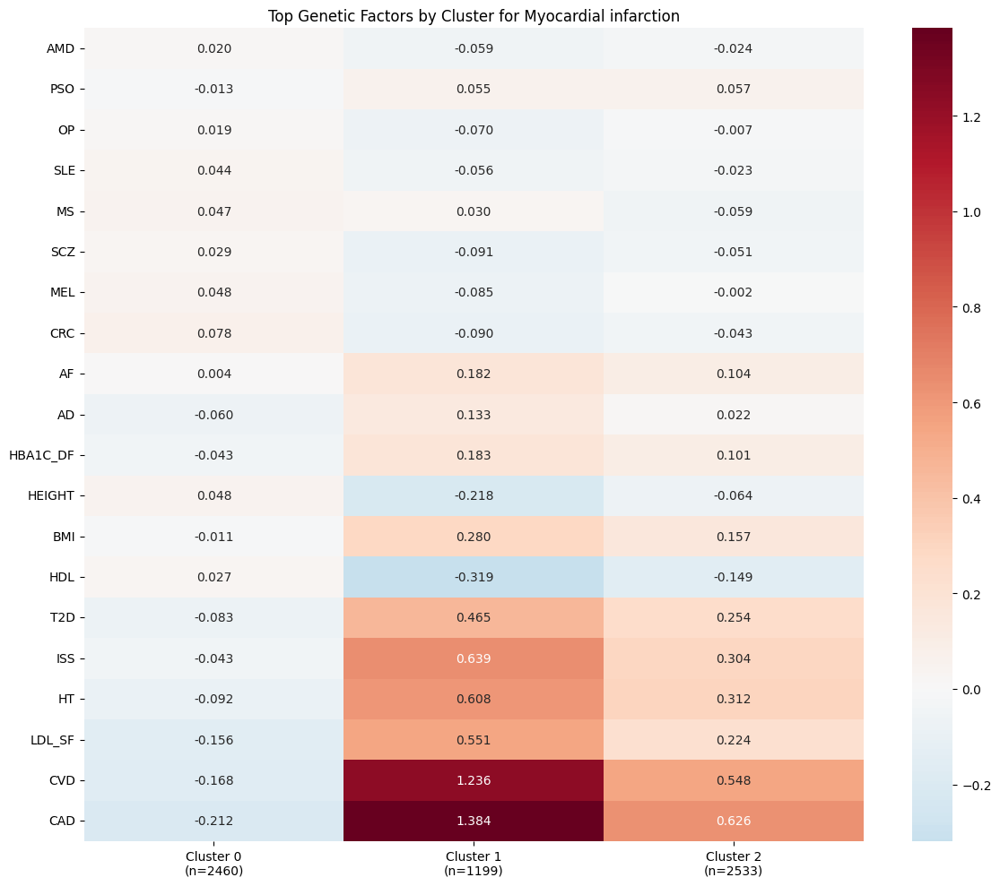

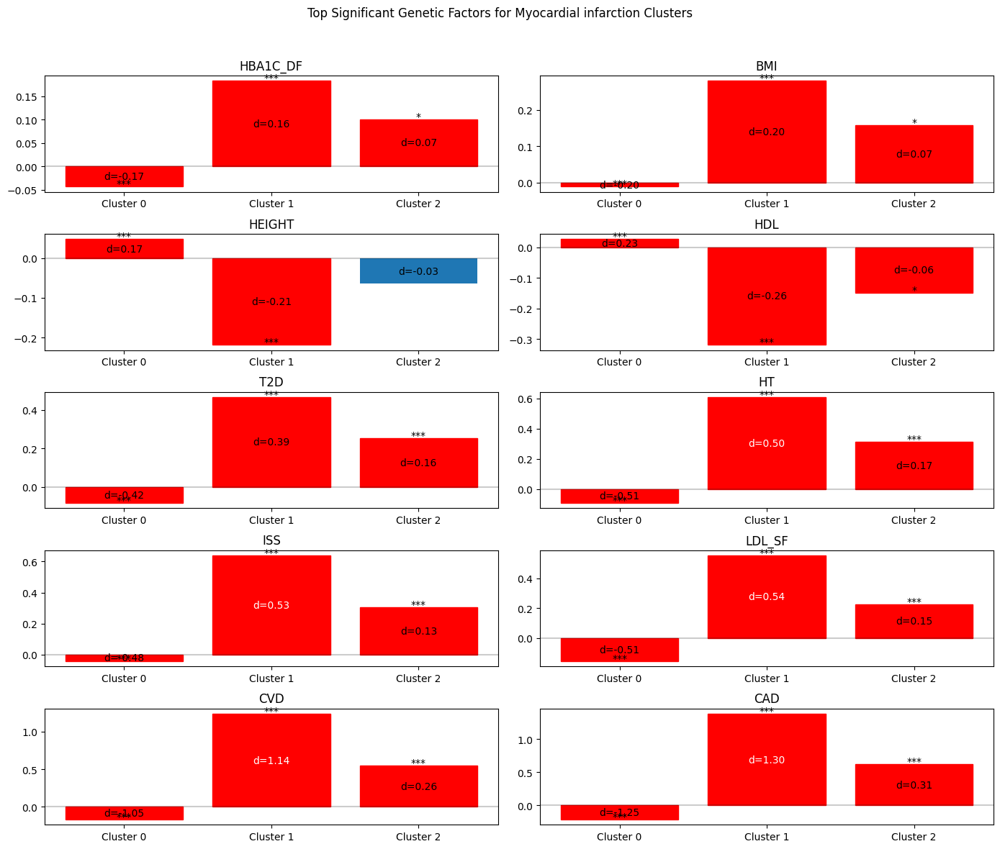

In [27]:
# For myocardial infarction (disease index 66)
genetic_results = analyze_genetic_data_by_cluster(112, n_clusters=3, 
                                                 prs_names_file='~/Dropbox/prs_names.csv')

# To find the most significant genetic factors for each cluster
for cluster in range(3):
    print(f"\nTop genetic factors for Cluster {cluster}:")
    cluster_results = genetic_results['genetic_df'][
        (genetic_results['genetic_df']['Cluster'] == cluster) & 
        (genetic_results['genetic_df']['Significant'])
    ].sort_values('Effect_Size', key=abs, ascending=False)
    
    if len(cluster_results) > 0:
        print(cluster_results[['Factor', 'Mean_Value', 'Effect_Size', 'P_Value_Corrected']].head(5))
    else:
        print("No significant factors found")

# If you know specific PRS of interest (now using names instead of indices)
prs_of_interest = ['CAD_PRS', 'BMI_PRS', 'LDL_PRS']  # Replace with actual PRS names
if prs_of_interest:
    print("\nAnalyzing specific genetic risk factors:")
    for prs_name in prs_of_interest:
        # Find the index of this PRS
        if prs_name in genetic_results['genetic_factor_names']:
            idx = genetic_results['genetic_factor_names'].index(prs_name)
            print(f"\n{prs_name}:")
            for cluster in range(3):
                mean_val = genetic_results['mean_genetic'][cluster][idx]
                p_val = genetic_results['p_values_corrected'][idx, cluster]
                effect = genetic_results['effect_sizes'][idx, cluster]
                print(f"  Cluster {cluster}: Mean={mean_val:.4f}, Effect Size={effect:.2f}, p={p_val:.4f}")
        else:
            print(f"{prs_name} not found in genetic factors")

Starting genetic data analysis for disease 17...
Loaded 36 PRS names from ~/Dropbox/prs_names.csv

Loading batch 1 model for reference...
Analyzing Malignant neoplasm of female breast

Processing batch 1/10 (patients 0-10000)
Found 423 patients in batch 1

Processing batch 2/10 (patients 10000-20000)


/var/folders/fl/ng5crz0x0fnb6c6x8dk7tfth0000gn/T/ipykernel_41712/969237693.py:41: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model1 = torch.load(model_path)
/var/folders/

Found 401 patients in batch 2

Processing batch 3/10 (patients 20000-30000)
Found 409 patients in batch 3

Processing batch 4/10 (patients 30000-40000)
Found 454 patients in batch 4

Processing batch 5/10 (patients 40000-50000)
Found 464 patients in batch 5

Processing batch 6/10 (patients 50000-60000)
Found 419 patients in batch 6

Processing batch 7/10 (patients 60000-70000)
Found 461 patients in batch 7

Processing batch 8/10 (patients 70000-80000)
Found 424 patients in batch 8

Processing batch 9/10 (patients 80000-90000)
Found 471 patients in batch 9

Processing batch 10/10 (patients 90000-100000)
Found 408 patients in batch 10

Total patients with Malignant neoplasm of female breast: 4334

Performing clustering with 3 clusters...

Top genetic factors for Cluster 0:
   Factor  Mean_Value  Effect_Size  P_Value_Corrected
54     HT   -0.272499     0.824957      6.235801e-136
33    CAD    0.221610     0.682547       2.062511e-95
27    CVD    0.028632     0.669398       3.984867e-92
60

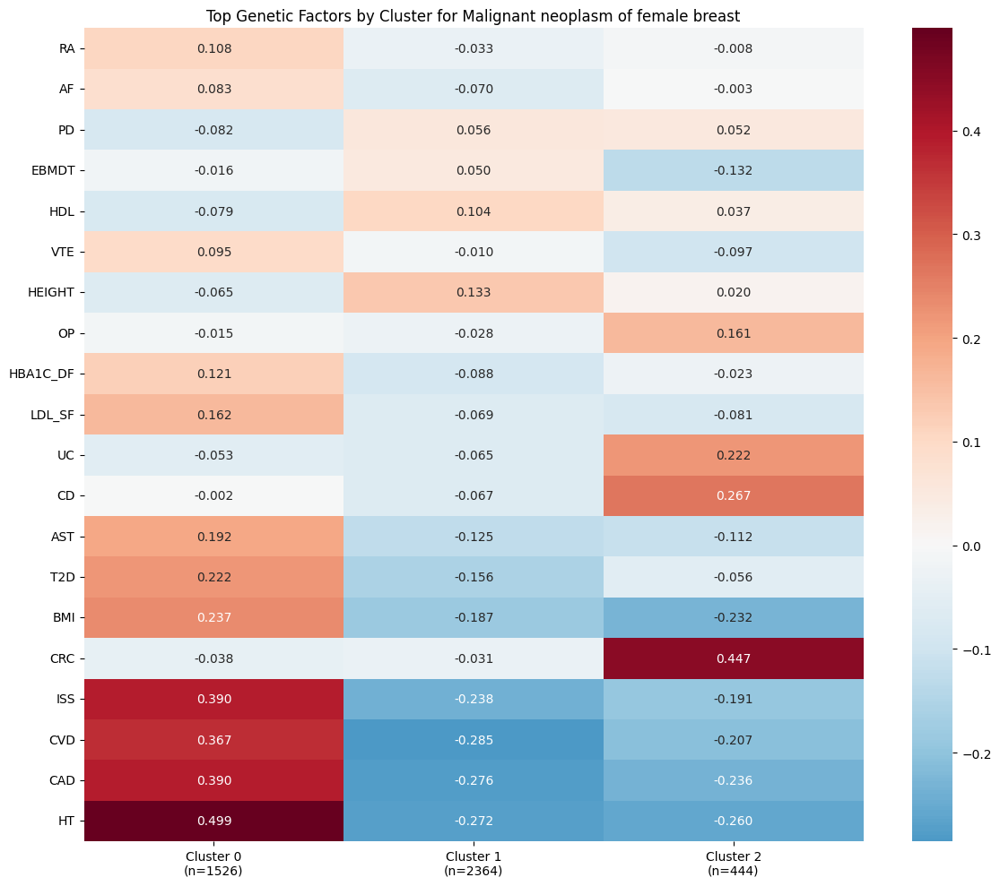

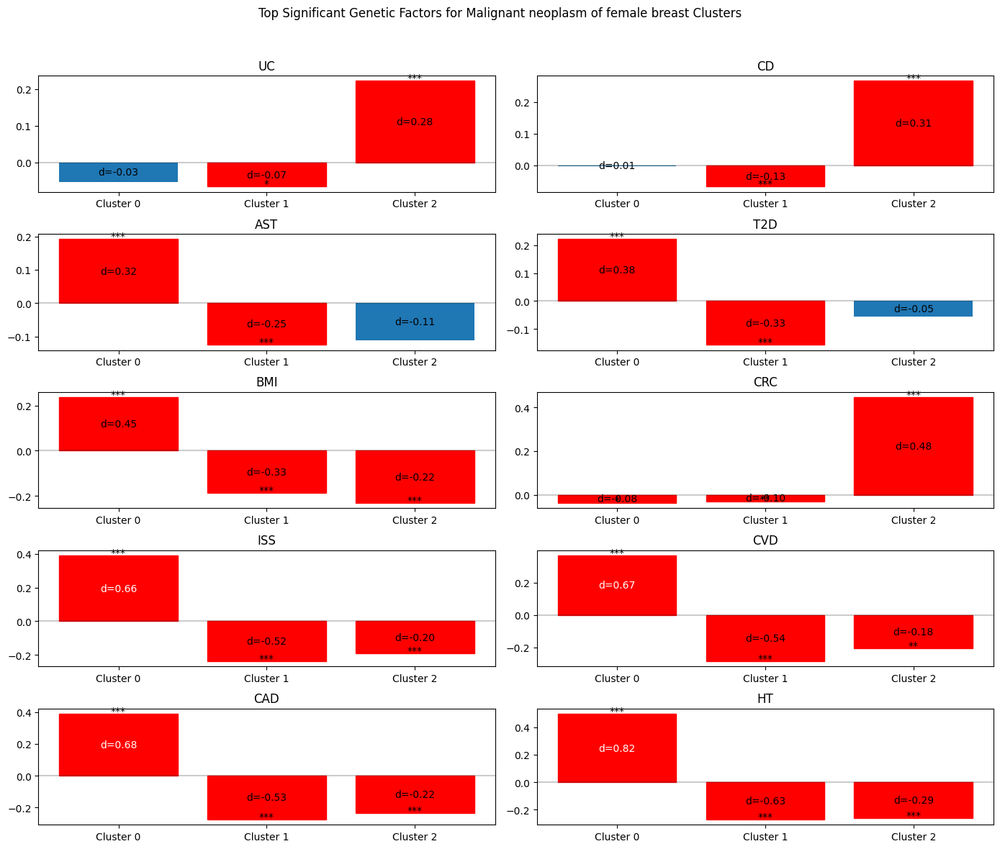

In [28]:
# For myocardial infarction (disease index 66)
genetic_results = analyze_genetic_data_by_cluster(17, n_clusters=3, 
                                                 prs_names_file='~/Dropbox/prs_names.csv')

# To find the most significant genetic factors for each cluster
for cluster in range(3):
    print(f"\nTop genetic factors for Cluster {cluster}:")
    cluster_results = genetic_results['genetic_df'][
        (genetic_results['genetic_df']['Cluster'] == cluster) & 
        (genetic_results['genetic_df']['Significant'])
    ].sort_values('Effect_Size', key=abs, ascending=False)
    
    if len(cluster_results) > 0:
        print(cluster_results[['Factor', 'Mean_Value', 'Effect_Size', 'P_Value_Corrected']].head(5))
    else:
        print("No significant factors found")

# If you know specific PRS of interest (now using names instead of indices)
prs_of_interest = ['CAD_PRS', 'BMI_PRS', 'LDL_PRS']  # Replace with actual PRS names
if prs_of_interest:
    print("\nAnalyzing specific genetic risk factors:")
    for prs_name in prs_of_interest:
        # Find the index of this PRS
        if prs_name in genetic_results['genetic_factor_names']:
            idx = genetic_results['genetic_factor_names'].index(prs_name)
            print(f"\n{prs_name}:")
            for cluster in range(3):
                mean_val = genetic_results['mean_genetic'][cluster][idx]
                p_val = genetic_results['p_values_corrected'][idx, cluster]
                effect = genetic_results['effect_sizes'][idx, cluster]
                print(f"  Cluster {cluster}: Mean={mean_val:.4f}, Effect Size={effect:.2f}, p={p_val:.4f}")
        else:
            print(f"{prs_name} not found in genetic factors")

Starting analysis for disease 66 across all batches...

Loading batch 1 model for reference...
Analyzing Major depressive disorder

Processing batch 1/10 (patients 0-10000)


/var/folders/fl/ng5crz0x0fnb6c6x8dk7tfth0000gn/T/ipykernel_41712/630625531.py:18: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model1 = torch.load(model_path)
/var/folders/

Found 723 patients in batch 1

Processing batch 2/10 (patients 10000-20000)
Found 744 patients in batch 2

Processing batch 3/10 (patients 20000-30000)
Found 716 patients in batch 3

Processing batch 4/10 (patients 30000-40000)
Found 782 patients in batch 4

Processing batch 5/10 (patients 40000-50000)
Found 770 patients in batch 5

Processing batch 6/10 (patients 50000-60000)
Found 798 patients in batch 6

Processing batch 7/10 (patients 60000-70000)
Found 801 patients in batch 7

Processing batch 8/10 (patients 70000-80000)
Found 771 patients in batch 8

Processing batch 9/10 (patients 80000-90000)
Found 753 patients in batch 9

Processing batch 10/10 (patients 90000-100000)
Found 788 patients in batch 10

Total patients with Major depressive disorder: 7646
Using population average as reference

Performing clustering with 3 clusters...


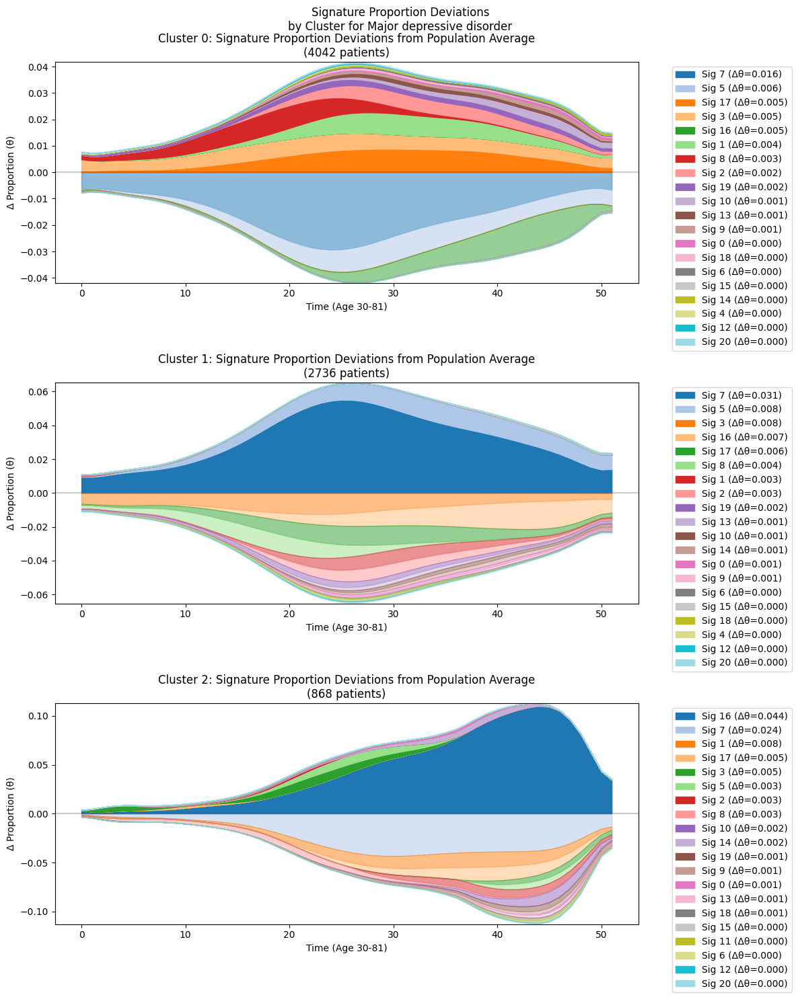

Starting analysis for disease 112 across all batches...

Loading batch 1 model for reference...
Analyzing Myocardial infarction

Processing batch 1/10 (patients 0-10000)
Found 635 patients in batch 1

Processing batch 2/10 (patients 10000-20000)


/var/folders/fl/ng5crz0x0fnb6c6x8dk7tfth0000gn/T/ipykernel_41712/630625531.py:18: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model1 = torch.load(model_path)
/var/folders/

Found 628 patients in batch 2

Processing batch 3/10 (patients 20000-30000)
Found 617 patients in batch 3

Processing batch 4/10 (patients 30000-40000)
Found 601 patients in batch 4

Processing batch 5/10 (patients 40000-50000)
Found 663 patients in batch 5

Processing batch 6/10 (patients 50000-60000)
Found 624 patients in batch 6

Processing batch 7/10 (patients 60000-70000)
Found 613 patients in batch 7

Processing batch 8/10 (patients 70000-80000)
Found 605 patients in batch 8

Processing batch 9/10 (patients 80000-90000)
Found 614 patients in batch 9

Processing batch 10/10 (patients 90000-100000)
Found 592 patients in batch 10

Total patients with Myocardial infarction: 6192
Using population average as reference

Performing clustering with 3 clusters...


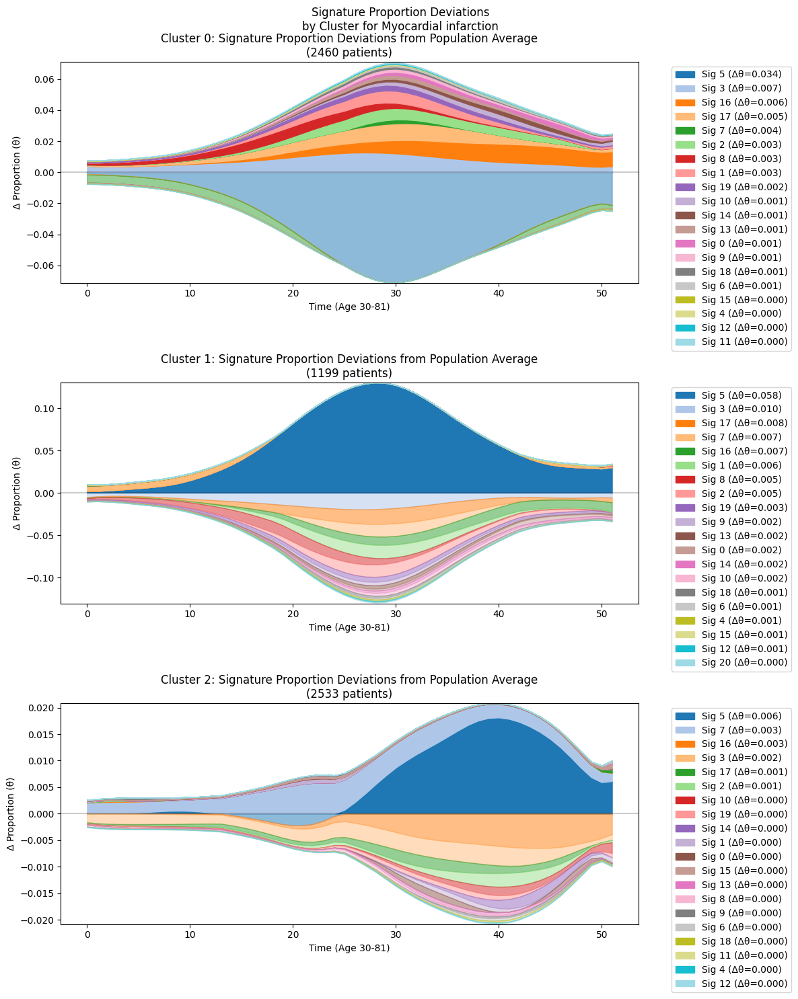

Starting analysis for disease 17 across all batches...

Loading batch 1 model for reference...
Analyzing Malignant neoplasm of female breast

Processing batch 1/10 (patients 0-10000)
Found 423 patients in batch 1

Processing batch 2/10 (patients 10000-20000)


/var/folders/fl/ng5crz0x0fnb6c6x8dk7tfth0000gn/T/ipykernel_41712/630625531.py:18: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model1 = torch.load(model_path)
/var/folders/

Found 401 patients in batch 2

Processing batch 3/10 (patients 20000-30000)
Found 409 patients in batch 3

Processing batch 4/10 (patients 30000-40000)
Found 454 patients in batch 4

Processing batch 5/10 (patients 40000-50000)
Found 464 patients in batch 5

Processing batch 6/10 (patients 50000-60000)
Found 419 patients in batch 6

Processing batch 7/10 (patients 60000-70000)
Found 461 patients in batch 7

Processing batch 8/10 (patients 70000-80000)
Found 424 patients in batch 8

Processing batch 9/10 (patients 80000-90000)
Found 471 patients in batch 9

Processing batch 10/10 (patients 90000-100000)
Found 408 patients in batch 10

Total patients with Malignant neoplasm of female breast: 4334
Using population average as reference

Performing clustering with 3 clusters...


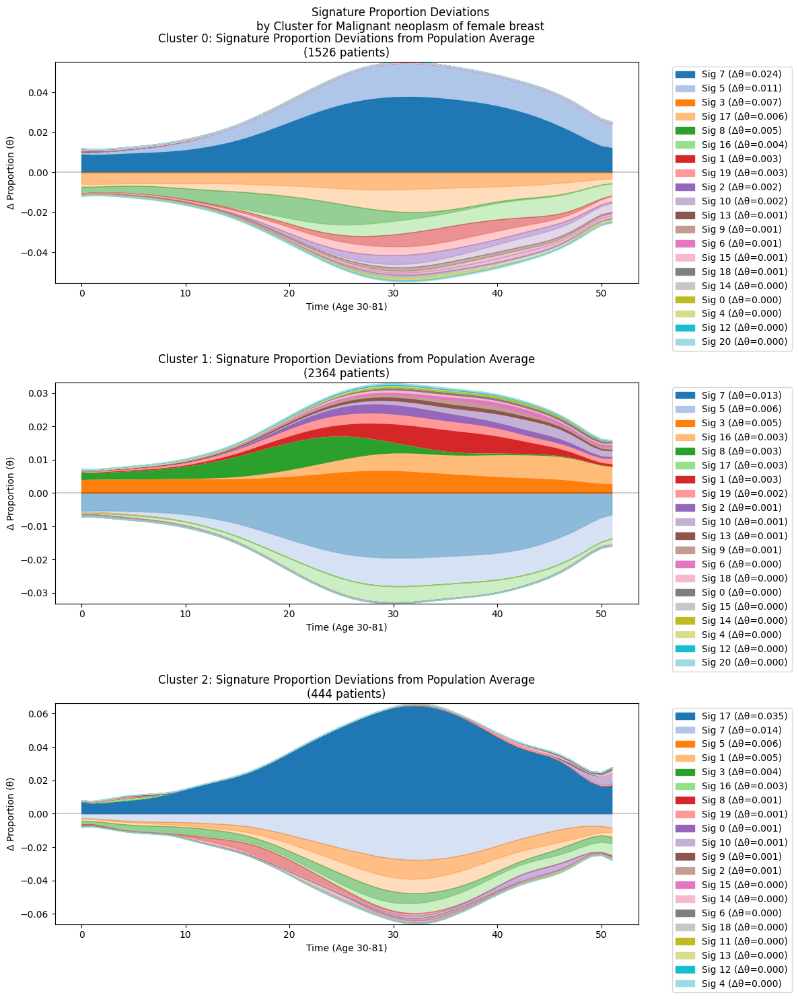

In [6]:
def plot_disease_signature_clusters_all_batches(disease_idx, batch_size=10000, n_batches=10, n_clusters=3, n_top_sigs=20, subtract_reference=True):
    """
    Plot signature proportion deviations by cluster for a specific disease across all batches
    """
    import torch
    import numpy as np
    import matplotlib.pyplot as plt
    from sklearn.cluster import KMeans
    import traceback
    
    print(f"Starting analysis for disease {disease_idx} across all batches...")
    
    # Load batch 1 model to get disease names and signature information
    model_path = '/Users/sarahurbut/Dropbox/resultshighamp/results/output_0_10000/model.pt'
    print("\nLoading batch 1 model for reference...")
    
    try:
        model1 = torch.load(model_path)
        disease_names = model1['disease_names'][0].tolist()
        K_total = model1['model_state_dict']['lambda_'].shape[1]  # Number of signatures
        time_points = model1['Y'].shape[2]  # Number of time points
        
        disease_name = disease_names[disease_idx] if disease_idx < len(disease_names) else f"Disease {disease_idx}"
        print(f"Analyzing {disease_name}")
        
        # Get reference trajectories from first batch
        if 'signature_refs' in model1:
            if model1.get('healthy_ref') is not None:
                # Create full reference including healthy state
                reference_lambda = torch.zeros((K_total, time_points))
                reference_lambda[:-1] = model1['signature_refs']  # Disease signatures
                reference_lambda[-1] = model1['healthy_ref']  # Healthy reference
                # Convert to proportions using softmax
                reference_theta = torch.softmax(reference_lambda, dim=0).detach().numpy()
            else:
                reference_theta = torch.softmax(model1['signature_refs'], dim=0).detach().numpy()
        else:
            # If no reference, we'll calculate population average later
            reference_theta = None
    except Exception as e:
        print(f"ERROR loading model: {str(e)}")
        traceback.print_exc()
        return None
    
    # Collect patients with this disease across all batches
    all_patients = []  # Will store (batch_idx, patient_idx) tuples
    all_features = []  # Will store signature proportions
    all_thetas = []    # Will store full theta matrices
    
    # Process each batch
    for batch in range(n_batches):
        start_idx = batch * batch_size
        end_idx = (batch + 1) * batch_size
        
        model_path = f'/Users/sarahurbut/Dropbox/resultshighamp/results/output_{start_idx}_{end_idx}/model.pt'
        print(f"\nProcessing batch {batch+1}/{n_batches} (patients {start_idx}-{end_idx})")
        
        try:
            model = torch.load(model_path)
            lambda_values = model['model_state_dict']['lambda_']
            Y_batch = model['Y'].numpy()
            
            # Find patients with this disease
            for i in range(Y_batch.shape[0]):
                if np.any(Y_batch[i, disease_idx]):
                    # Get signature proportions
                    theta = torch.softmax(lambda_values[i], dim=0).detach().numpy()
                    mean_props = theta.mean(axis=1)
                    
                    # Store patient data
                    all_patients.append((batch, i))
                    all_features.append(mean_props)
                    all_thetas.append(theta)
            
            print(f"Found {len(all_patients) - (0 if batch == 0 else sum(1 for p in all_patients if p[0] < batch))} patients in batch {batch+1}")
            
        except FileNotFoundError:
            print(f"Warning: Could not find model file for batch {batch}")
            break  # Assume we've reached the end of batches
        except Exception as e:
            print(f"Error processing batch {batch}: {str(e)}")
            traceback.print_exc()
            continue
    
    if len(all_patients) == 0:
        print(f"No patients found with disease {disease_idx}")
        return None
    
    print(f"\nTotal patients with {disease_name}: {len(all_patients)}")
    
    # If no reference theta, use population average
    if reference_theta is None:
        reference_theta = np.mean(all_thetas, axis=0)
        print("Using population average as reference")
    
    # Convert to numpy arrays
    all_features = np.array(all_features)
    
    # Perform clustering
    print(f"\nPerforming clustering with {n_clusters} clusters...")
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    patient_clusters = kmeans.fit_predict(all_features)
    
    # Create figure and axes
    fig, axes = plt.subplots(n_clusters, 1, figsize=(12, 5*n_clusters))
    if n_clusters == 1:
        axes = [axes]  # Make axes iterable if only one cluster
    
    time_points = np.arange(time_points)
    
    for cluster_idx in range(n_clusters):
        # Get patients in this cluster
        cluster_indices = np.where(patient_clusters == cluster_idx)[0]
        cluster_thetas = [all_thetas[i] for i in cluster_indices]
        
        # Calculate average theta for this cluster
        avg_theta = np.mean(cluster_thetas, axis=0)
        
        if subtract_reference:
            # Subtract reference from average
            avg_theta = avg_theta - reference_theta
        
        # Calculate mean deviation for each signature
        mean_props = np.abs(avg_theta).mean(axis=1)
        
        # Get top signatures by absolute mean deviation
        top_sig_idx = np.argsort(mean_props)[-n_top_sigs:][::-1]
        
        # Create stacked area plot
        bottom_pos = np.zeros(time_points.shape)
        bottom_neg = np.zeros(time_points.shape)
        colors = plt.cm.tab20(np.linspace(0, 1, n_top_sigs))
        
        for i, sig in enumerate(top_sig_idx):
            values = avg_theta[sig]
            if subtract_reference:
                # For deviations, split positive and negative
                pos_values = np.maximum(values, 0)
                neg_values = np.minimum(values, 0)
                
                axes[cluster_idx].fill_between(time_points, bottom_pos, bottom_pos + pos_values,
                                             label=f'Sig {sig} (Δθ={mean_props[sig]:.3f})',
                                             color=colors[i])
                axes[cluster_idx].fill_between(time_points, bottom_neg, bottom_neg + neg_values,
                                             color=colors[i], alpha=0.5)
                
                bottom_pos += pos_values
                bottom_neg += neg_values
            else:
                axes[cluster_idx].fill_between(time_points, bottom_pos, bottom_pos + values,
                                             label=f'Sig {sig} (θ={mean_props[sig]:.3f})',
                                             color=colors[i])
                bottom_pos += values
        
        title = f'Cluster {cluster_idx}: '
        title += 'Signature Proportion Deviations from Population Average' if subtract_reference else 'Average Signature Proportions'
        title += f'\n({len(cluster_indices)} patients)'
        
        axes[cluster_idx].set_title(title)
        axes[cluster_idx].set_xlabel('Time (Age 30-81)')
        axes[cluster_idx].set_ylabel('Δ Proportion (θ)' if subtract_reference else 'Proportion (θ)')
        axes[cluster_idx].legend(bbox_to_anchor=(1.05, 1), loc='upper left')
        
        if subtract_reference:
            # Center y-axis around 0 for deviations
            max_dev = max(abs(bottom_pos.max()), abs(bottom_neg.min()))
            axes[cluster_idx].set_ylim(-max_dev, max_dev)
            axes[cluster_idx].axhline(y=0, color='k', linestyle='-', alpha=0.2)
        else:
            axes[cluster_idx].set_ylim(0, 1.05)
    
    plt.suptitle(f'{"Signature Proportion Deviations" if subtract_reference else "Average Signature Proportions"}\n'
                f'by Cluster for {disease_name}')
    plt.tight_layout()
    plt.show()
    
    return fig

# Usage:
# For myocardial infarction (assuming it's disease index 66):
fig = plot_disease_signature_clusters_all_batches(66, n_clusters=3, n_top_sigs=20)

# For other diseases:
fig = plot_disease_signature_clusters_all_batches(112, n_clusters=3, n_top_sigs=20)
fig = plot_disease_signature_clusters_all_batches(17, n_clusters=3, n_top_sigs=20)

In [7]:
# For breast cancer (disease index 17)
results = plot_temporal_disease_prevalence(17, n_clusters=3, top_n_diseases=8)

# Save the figure
results['fig'].savefig('breast_cancer_temporal_prevalence.png', dpi=300, bbox_inches='tight')

NameError: name 'plot_temporal_disease_prevalence' is not defined

In [5]:
def analyze_psi_importance(model, condition_indices, n_top_sigs=5):
    """
    Analyze signature importance across diseases using normalized psi values (% of max)
    """
    disease_patterns = {}
    
    for condition_idx in condition_indices:
        # Get psi values for this disease
        psi_disease = model.psi[:, condition_idx].detach().numpy()
        
        # Normalize to percent of max
        psi_max = np.max(np.abs(psi_disease))
        psi_normalized = (psi_disease / psi_max) * 100
        
        # Store patterns
        top_sigs = np.argsort(np.abs(psi_disease))[-n_top_sigs:][::-1]
        disease_patterns[condition_idx] = {
            'disease_name': model.disease_names[condition_idx],
            'top_signatures': top_sigs,
            'psi_values': psi_normalized,  # Store normalized values
            'max_psi': psi_max  # Store max for reference
        }
    
    # Create visualization
    fig, ax = plt.subplots(figsize=(15, 8))
    
    diseases = list(disease_patterns.keys())
    y_pos = np.arange(len(diseases))
    
    # Create heatmap
    signature_matrix = np.zeros((len(diseases), model.K_total))
    for i, d in enumerate(diseases):
        signature_matrix[i, :] = disease_patterns[d]['psi_values']
    
    im = ax.imshow(signature_matrix, aspect='auto', cmap='RdBu_r')
    plt.colorbar(im, label='ψ (% of max)')
    
    ax.set_yticks(y_pos)
    ax.set_yticklabels([f"{disease_patterns[d]['disease_name']}\n(max ψ={disease_patterns[d]['max_psi']:.2f})" 
                        for d in diseases])
    ax.set_xlabel('Signature Index')
    ax.set_title('Normalized ψ (Signature-Disease Associations)')
    
    plt.tight_layout()
    plt.show()
    
    # Print summary
    print("\nMost Important Signatures by Disease:")
    for d in diseases:
        print(f"\n{disease_patterns[d]['disease_name']} (max ψ={disease_patterns[d]['max_psi']:.2f}):")
        top_sigs = disease_patterns[d]['top_signatures']
        psi_vals = disease_patterns[d]['psi_values']
        for sig in top_sigs:
            print(f"  Signature {sig}: {psi_vals[sig]:.1f}% of max")

# Usage:
conditions = [17, 66, 112]  # Breast Cancer, Major Depression, MI
analyze_psi_importance(model, conditions)

NameError: name 'model' is not defined

In [57]:
checkpoint['initial_state']['psi']

tensor([[-2.0162, -1.9909, -1.9982,  ..., -1.9936, -1.9885, -2.0048],
        [-2.0034, -1.9774, -2.0040,  ..., -1.9989, -2.0033, -1.9827],
        [-1.9909, -1.9892, -2.0000,  ..., -1.9940, -1.9808, -2.0092],
        ...,
        [-2.0022, -1.9927, -1.9903,  ..., -1.9766, -2.0031, -2.0167],
        [-1.9907, -1.9997, -1.9918,  ..., -1.9948, -1.9953, -1.9874],
        [-5.0113, -5.0115, -5.0025,  ..., -4.9993, -4.9923, -5.0097]])

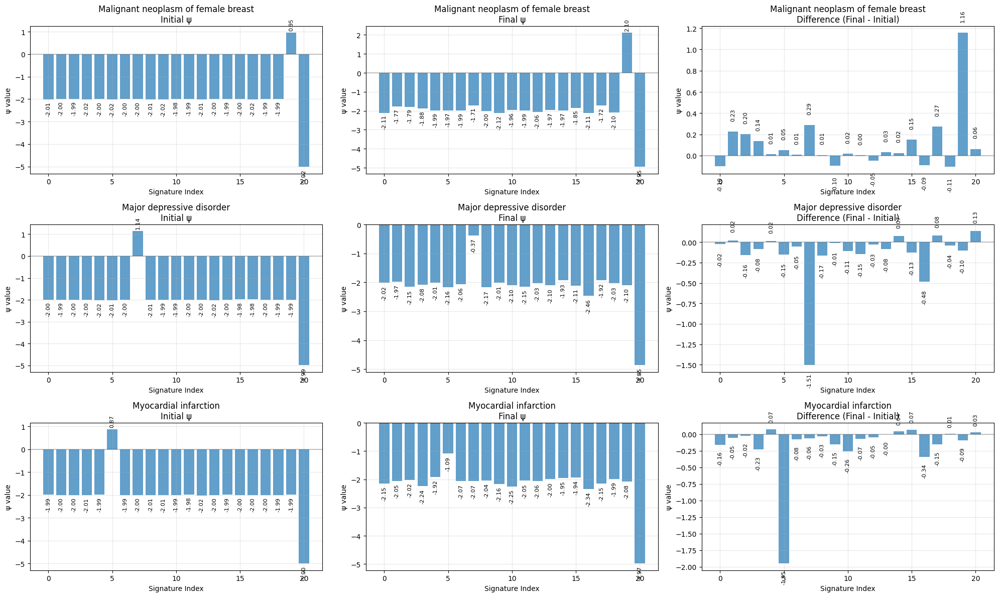

In [76]:
def visualize_psi_changes(model, checkpoint, condition_indices):
    """
    Visualize initial psi, final psi, and their difference for each disease
    """
    # Get initial and final psi
    initial_psi = checkpoint['initial_state']['psi']
    final_psi = model.psi
    
    fig, axes = plt.subplots(len(condition_indices), 3, figsize=(20, 4*len(condition_indices)))
    
    for idx, condition_idx in enumerate(condition_indices):
        # Get psi values for this disease
        initial_disease_psi = initial_psi[:, condition_idx].detach().numpy()
        final_disease_psi = final_psi[:, condition_idx].detach().numpy()
        difference = final_disease_psi - initial_disease_psi
        
        # Plot all three
        data = [initial_disease_psi, final_disease_psi, difference]
        titles = ['Initial ψ', 'Final ψ', 'Difference (Final - Initial)']
        
        for ax, d, title in zip(axes[idx], data, titles):
            ax.bar(range(len(d)), d, alpha=0.7)
            ax.set_xlabel('Signature Index')
            ax.set_ylabel('ψ value')
            ax.set_title(f'{model.disease_names[condition_idx]}\n{title}')
            ax.grid(True, alpha=0.3)
            ax.axhline(y=0, color='black', linestyle='-', alpha=0.2)
            
            # Add value labels on top of bars
            for i, v in enumerate(d):
                ax.text(i, v + (0.1 if v >= 0 else -0.1), 
                       f'{v:.2f}', ha='center', va='bottom' if v >= 0 else 'top',
                       rotation=90, fontsize=8)
    
    plt.tight_layout()
    plt.show()

# Usage:
conditions = [17, 66, 112]  # Breast Cancer, Major Depression, MI
visualize_psi_changes(model, checkpoint, conditions)

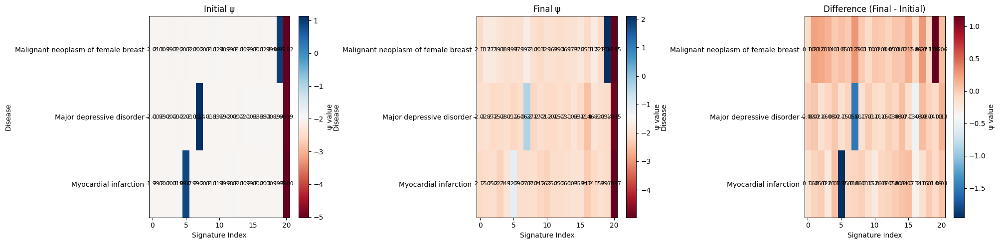

In [80]:
def visualize_psi_evolution_compact(model, checkpoint, condition_indices):
    """
    Create three heatmaps (initial, final, difference) showing all diseases together
    """
    # Get initial and final psi
    initial_psi = checkpoint['initial_state']['psi']
    final_psi = model.psi
    
    # Create figure with three subplots
    fig, axes = plt.subplots(1, 3, figsize=(20, 5))
    titles = ['Initial ψ', 'Final ψ', 'Difference (Final - Initial)']
    
    # Prepare data for each subplot
    data = []
    for condition_idx in condition_indices:
        initial = initial_psi[:, condition_idx].detach().numpy()
        final = final_psi[:, condition_idx].detach().numpy()
        difference = final - initial
        data.append([initial, final, difference])
    
    # Convert to numpy arrays
    data = np.array(data)  # Shape: (n_diseases, 3, n_signatures)
    
    # Plot each heatmap
    for i, (ax, title) in enumerate(zip(axes, titles)):
        im = ax.imshow(data[:, i, :], aspect='auto', 
                      cmap='RdBu_r' if 'Difference' in title else 'RdBu')
        plt.colorbar(im, ax=ax, label='ψ value')
        
        # Customize plot
        ax.set_xlabel('Signature Index')
        ax.set_ylabel('Disease')
        ax.set_title(title)
        
        # Set disease names as y-tick labels
        ax.set_yticks(range(len(condition_indices)))
        ax.set_yticklabels([model.disease_names[idx] for idx in condition_indices])
        
        # Add value annotations
        for y in range(data.shape[0]):
            for x in range(data.shape[2]):
                ax.text(x, y, f'{data[y, i, x]:.2f}', 
                       ha='center', va='center', fontsize=8)
    
    plt.tight_layout()
    plt.show()

# Usage:
conditions = [17, 66, 112]  # Breast Cancer, Major Depression, MI
visualize_psi_evolution_compact(model, checkpoint, conditions)

In [3]:
def analyze_cluster_disease_patterns(disease_idx, batch_size=10000, n_batches=10, n_clusters=3, top_n=20):
    """
    Analyze distinctive disease patterns for each cluster of patients with a specific disease
    
    Parameters:
    - disease_idx: Index of the disease to analyze
    - batch_size: Number of patients per batch
    - n_batches: Number of batches to process
    - n_clusters: Number of clusters to create
    - top_n: Number of top distinctive diseases to show
    """
    import torch
    import numpy as np
    import matplotlib.pyplot as plt
    from sklearn.cluster import KMeans
    import traceback
    from scipy.stats import fisher_exact
    
    print(f"Starting disease pattern analysis for disease {disease_idx} across all batches...")
    
    # Load batch 1 model to get disease names and signature information
    model_path = '/Users/sarahurbut/Dropbox/resultshighamp/results/output_0_10000/model.pt'
    print("\nLoading batch 1 model for reference...")
    
    try:
        model1 = torch.load(model_path)
        disease_names = model1['disease_names'][0].tolist()
        K_total = model1['model_state_dict']['lambda_'].shape[1]  # Number of signatures
        time_points = model1['Y'].shape[2]  # Number of time points
        
        disease_name = disease_names[disease_idx] if disease_idx < len(disease_names) else f"Disease {disease_idx}"
        print(f"Analyzing {disease_name}")
        
    except Exception as e:
        print(f"ERROR loading model: {str(e)}")
        traceback.print_exc()
        return None
    
    # Collect patients with this disease across all batches
    all_patients = []  # Will store (batch_idx, patient_idx) tuples
    all_features = []  # Will store signature proportions
    all_disease_profiles = []  # Will store disease occurrence profiles
    
    # Process each batch
    for batch in range(n_batches):
        start_idx = batch * batch_size
        end_idx = (batch + 1) * batch_size
        
        model_path = f'/Users/sarahurbut/Dropbox/resultshighamp/results/output_{start_idx}_{end_idx}/model.pt'
        print(f"\nProcessing batch {batch+1}/{n_batches} (patients {start_idx}-{end_idx})")
        
        try:
            model = torch.load(model_path)
            lambda_values = model['model_state_dict']['lambda_']
            Y_batch = model['Y'].numpy()
            
            # Find patients with this disease
            for i in range(Y_batch.shape[0]):
                if np.any(Y_batch[i, disease_idx]):
                    # Get signature proportions
                    theta = torch.softmax(lambda_values[i], dim=0).detach().numpy()
                    mean_props = theta.mean(axis=1)
                    
                    # Get disease profile (ever occurred)
                    disease_profile = np.max(Y_batch[i], axis=1)
                    
                    # Store patient data
                    all_patients.append((batch, i))
                    all_features.append(mean_props)
                    all_disease_profiles.append(disease_profile)
            
            print(f"Found {len(all_patients) - (0 if batch == 0 else sum(1 for p in all_patients if p[0] < batch))} patients in batch {batch+1}")
            
        except FileNotFoundError:
            print(f"Warning: Could not find model file for batch {batch}")
            break  # Assume we've reached the end of batches
        except Exception as e:
            print(f"Error processing batch {batch}: {str(e)}")
            traceback.print_exc()
            continue
    
    if len(all_patients) == 0:
        print(f"No patients found with disease {disease_idx}")
        return None
    
    print(f"\nTotal patients with {disease_name}: {len(all_patients)}")
    
    # Convert to numpy arrays
    all_features = np.array(all_features)
    all_disease_profiles = np.array(all_disease_profiles)
    
    # Perform clustering based on signature profiles
    print(f"\nPerforming clustering with {n_clusters} clusters...")
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    patient_clusters = kmeans.fit_predict(all_features)
    
    # Create figure for disease pattern analysis
    fig, axes = plt.subplots(n_clusters, 1, figsize=(14, 5*n_clusters))
    if n_clusters == 1:
        axes = [axes]  # Make axes iterable if only one cluster
    
    # For each cluster, find distinctive diseases
    for cluster_idx in range(n_clusters):
        # Get patients in this cluster
        in_cluster = patient_clusters == cluster_idx
        n_in_cluster = np.sum(in_cluster)
        
        # Calculate disease prevalence in this cluster vs. other clusters
        cluster_prevalence = np.mean(all_disease_profiles[in_cluster], axis=0)
        other_prevalence = np.mean(all_disease_profiles[~in_cluster], axis=0)
        
        # Calculate odds ratios and p-values using Fisher's exact test
        odds_ratios = np.ones(len(disease_names))
        p_values = np.ones(len(disease_names))
        
        for d in range(len(disease_names)):
            if d == disease_idx:
                continue  # Skip the target disease itself
                
            # Contingency table
            a = np.sum(all_disease_profiles[in_cluster, d])  # Disease present in cluster
            b = np.sum(all_disease_profiles[~in_cluster, d])  # Disease present outside cluster
            c = n_in_cluster - a  # Disease absent in cluster
            d_val = len(patient_clusters) - n_in_cluster - b  # Disease absent outside cluster
            
            # Avoid division by zero
            if a > 0 and b > 0 and c > 0 and d_val > 0:
                odds_ratios[d] = (a / c) / (b / d_val)
                _, p_values[d] = fisher_exact([[a, b], [c, d_val]])
        
        # Find most distinctive diseases (highest odds ratios with significant p-values)
        significant = p_values < 0.05
        distinctive_idx = np.argsort(odds_ratios * significant)[-top_n:]
        
        # Sort for better visualization
        sorted_idx = distinctive_idx[np.argsort(odds_ratios[distinctive_idx])]
        
        # Create horizontal bar chart
        y_pos = np.arange(len(sorted_idx))
        bars = axes[cluster_idx].barh(y_pos, odds_ratios[sorted_idx], align='center')
        
        # Add prevalence information to labels
        labels = [f"{disease_names[i]} ({cluster_prevalence[i]*100:.1f}% vs {other_prevalence[i]*100:.1f}%)" 
                 for i in sorted_idx]
        
        axes[cluster_idx].set_yticks(y_pos)
        axes[cluster_idx].set_yticklabels(labels)
        axes[cluster_idx].set_title(f'Cluster {cluster_idx}: Distinctive Diseases ({n_in_cluster} patients)')
        axes[cluster_idx].set_xlabel('Odds Ratio (log scale)')
        axes[cluster_idx].set_xscale('log')
        
        # Add reference line at OR=1
        axes[cluster_idx].axvline(x=1, color='gray', linestyle='--', alpha=0.7)
        
        # Add value labels
        for i, bar in enumerate(bars):
            value = odds_ratios[sorted_idx[i]]
            axes[cluster_idx].text(max(value + 0.1, 1.1), i, f'{value:.2f}', va='center')
    
    plt.suptitle(f'Distinctive Disease Patterns for {disease_name} Patient Clusters')
    plt.tight_layout()
    plt.show()
    
    # Return both the figure and the clustering results for further analysis
    return {
        'fig': fig,
        'patient_clusters': patient_clusters,
        'all_patients': all_patients,
        'all_disease_profiles': all_disease_profiles,
        'disease_names': disease_names
    }


def plot_cluster_comorbidity_networks(results, top_n=10):
    """
    Create comorbidity network visualizations for each cluster
    
    Parameters:
    - results: Results dictionary from analyze_cluster_disease_patterns
    - top_n: Number of top comorbidities to show
    """
    import numpy as np
    import matplotlib.pyplot as plt
    import networkx as nx
    
    patient_clusters = results['patient_clusters']
    all_disease_profiles = results['all_disease_profiles']
    disease_names = results['disease_names']
    disease_idx = np.where([name == results['disease_names'] for name in disease_names])[0][0]
    
    # Number of clusters
    n_clusters = len(np.unique(patient_clusters))
    
    # Create figure
    fig, axes = plt.subplots(1, n_clusters, figsize=(7*n_clusters, 6))
    if n_clusters == 1:
        axes = [axes]  # Make axes iterable if only one cluster
    
    # For each cluster, create comorbidity network
    for cluster_idx in range(n_clusters):
        # Get patients in this cluster
        in_cluster = patient_clusters == cluster_idx
        n_in_cluster = np.sum(in_cluster)
        
        # Calculate comorbidity rates
        comorbidity_rates = np.mean(all_disease_profiles[in_cluster], axis=0)
        
        # Find top comorbidities by prevalence
        top_comorbidities = np.argsort(comorbidity_rates)[-top_n-1:-1]  # Exclude the disease itself
        
        # Create network graph
        G = nx.Graph()
        
        # Add target disease node
        G.add_node(disease_idx, name=disease_names[disease_idx], 
                  size=1.0, color='red', rate=1.0)
        
        # Add comorbidity nodes
        for d in top_comorbidities:
            if d == disease_idx:
                continue
                
            G.add_node(d, name=disease_names[d], 
                      size=comorbidity_rates[d], 
                      color='blue',
                      rate=comorbidity_rates[d])
            
            # Add edge
            G.add_edge(disease_idx, d, weight=comorbidity_rates[d])
        
        # Create positions
        pos = nx.spring_layout(G, seed=42)
        
        # Draw nodes
        node_sizes = [G.nodes[n]['size'] * 2000 + 500 for n in G.nodes()]
        node_colors = [G.nodes[n]['color'] for n in G.nodes()]
        
        nx.draw_networkx_nodes(G, pos, node_size=node_sizes, 
                              node_color=node_colors, alpha=0.8, ax=axes[cluster_idx])
        
        # Draw edges
        edge_widths = [G[u][v]['weight'] * 5 for u, v in G.edges()]
        nx.draw_networkx_edges(G, pos, width=edge_widths, alpha=0.5, ax=axes[cluster_idx])
        
        # Add labels
        labels = {n: f"{G.nodes[n]['name'][:20]}\n({G.nodes[n]['rate']*100:.1f}%)" for n in G.nodes()}
        nx.draw_networkx_labels(G, pos, labels=labels, font_size=9, ax=axes[cluster_idx])
        
        axes[cluster_idx].set_title(f'Cluster {cluster_idx}: Top Comorbidities\n({n_in_cluster} patients)')
        axes[cluster_idx].axis('off')
    
    plt.suptitle(f'Comorbidity Networks for {disease_names[disease_idx]} Patient Clusters')
    plt.tight_layout()
    plt.show()
    
    return fig

Starting disease pattern analysis for disease 17 across all batches...

Loading batch 1 model for reference...
Analyzing Malignant neoplasm of female breast

Processing batch 1/10 (patients 0-10000)
Found 423 patients in batch 1

Processing batch 2/10 (patients 10000-20000)


/var/folders/fl/ng5crz0x0fnb6c6x8dk7tfth0000gn/T/ipykernel_41712/1814346491.py:26: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model1 = torch.load(model_path)
/var/folders

Found 401 patients in batch 2

Processing batch 3/10 (patients 20000-30000)
Found 409 patients in batch 3

Processing batch 4/10 (patients 30000-40000)
Found 454 patients in batch 4

Processing batch 5/10 (patients 40000-50000)
Found 464 patients in batch 5

Processing batch 6/10 (patients 50000-60000)
Found 419 patients in batch 6

Processing batch 7/10 (patients 60000-70000)
Found 461 patients in batch 7

Processing batch 8/10 (patients 70000-80000)
Found 424 patients in batch 8

Processing batch 9/10 (patients 80000-90000)
Found 471 patients in batch 9

Processing batch 10/10 (patients 90000-100000)
Found 408 patients in batch 10

Total patients with Malignant neoplasm of female breast: 4334

Performing clustering with 3 clusters...


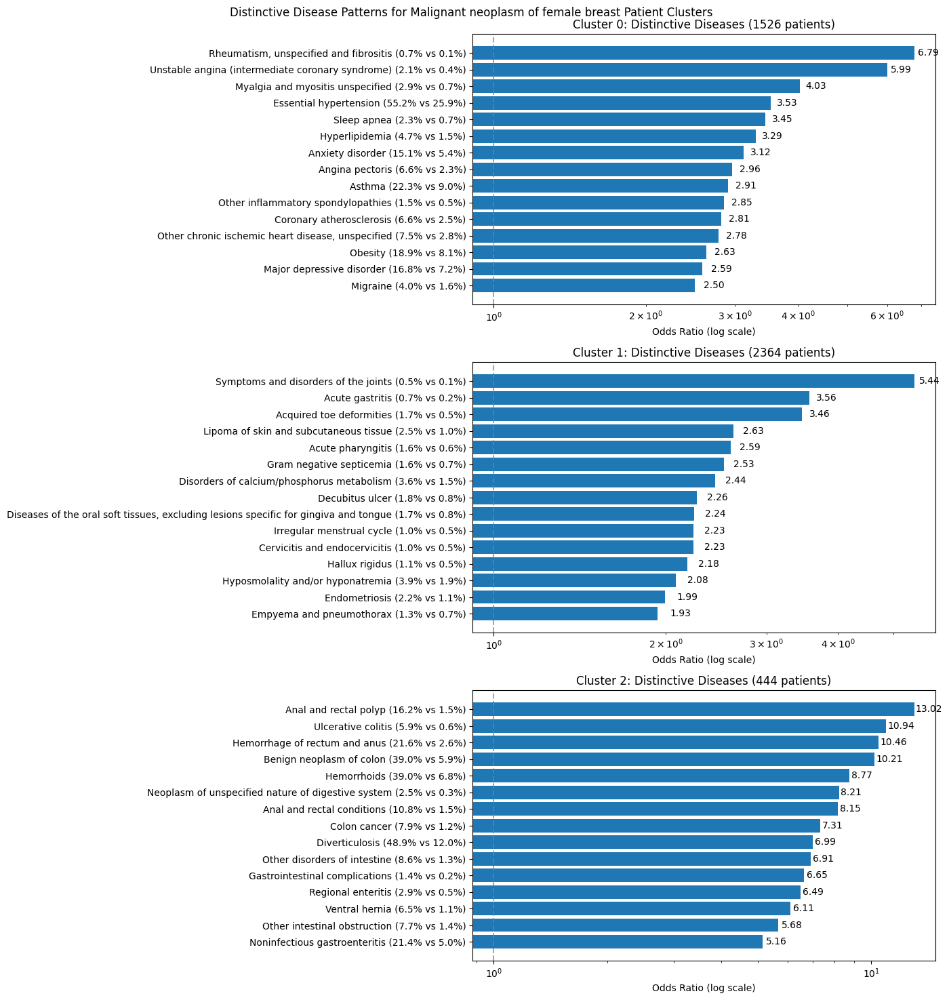

IndexError: index 0 is out of bounds for axis 0 with size 0

In [4]:
# Analyze breast cancer (assuming it's disease index 17)
results = analyze_cluster_disease_patterns(17, n_clusters=3, top_n=15)

# Create comorbidity networks
comorbidity_fig = plot_cluster_comorbidity_networks(results, top_n=8)

# Save figures
results['fig'].savefig('breast_cancer_cluster_diseases.png', dpi=300, bbox_inches='tight')
comorbidity_fig.savefig('breast_cancer_comorbidity_networks.png', dpi=300, bbox_inches='tight')

# Analyze other diseases
mi_results = analyze_cluster_disease_patterns(66, n_clusters=3)  # Myocardial infarction
diabetes_results = analyze_cluster_disease_patterns(112, n_clusters=3)  # Diabetes

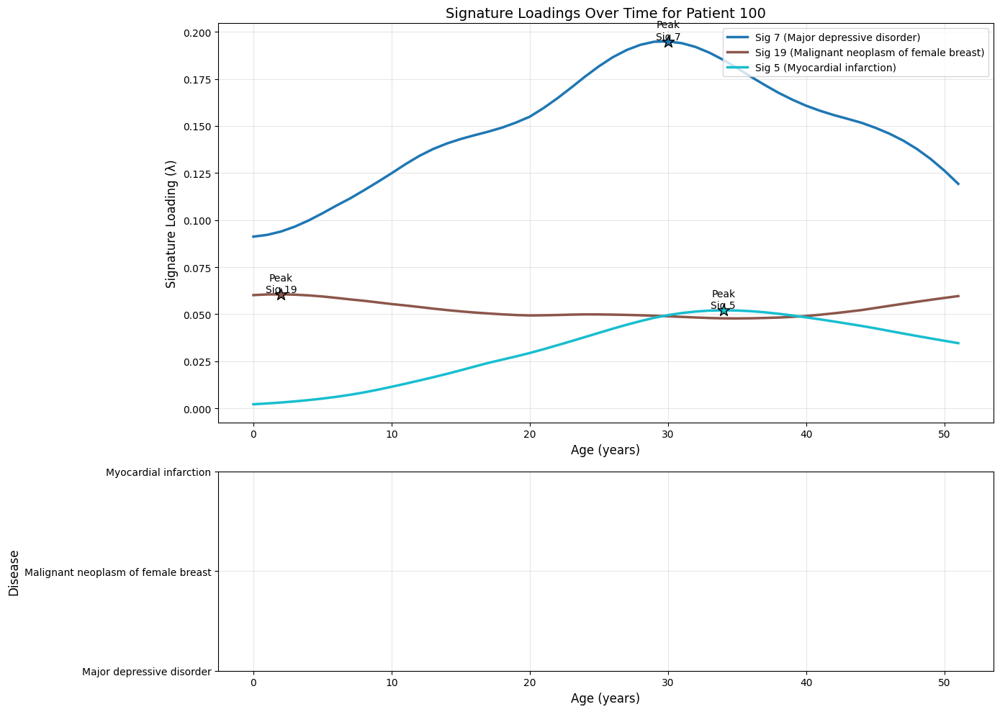

In [52]:
def plot_multi_disease_signature_patterns(model, patient_data, patient_idx, 
                                         disease_indices=None, sig_indices=None):
    """
    Plot lambda values for multiple diseases and their associated signatures for a single patient
    
    Args:
        model: Trained model with lambda values
        patient_data: Dictionary or dataset containing disease occurrence information
        patient_idx: Index of the patient to analyze
        disease_indices: List of disease indices to analyze (default: None, will use common diseases)
        sig_indices: Dictionary mapping disease indices to signature indices (default: None, will use most associated)
    """
    import torch
    import numpy as np
    import matplotlib.pyplot as plt
    from matplotlib.gridspec import GridSpec
    
    # Default to common diseases if not specified
    if disease_indices is None:
        disease_indices = [66, 17, 112]  # MI, Breast Cancer, Diabetes (adjust as needed)
    
    # Get disease names if available
    if hasattr(model, 'disease_names') and model.disease_names is not None:
        disease_names = {idx: model.disease_names[idx] for idx in disease_indices}
    else:
        disease_names = {idx: f"Disease {idx}" for idx in disease_indices}
    
    # Find most associated signatures for each disease if not specified
    if sig_indices is None:
        sig_indices = {}
        for disease_idx in disease_indices:
            psi_disease = model.psi[:, disease_idx].detach()
            sig_indices[disease_idx] = torch.argmax(psi_disease).item()
    
    # Get diagnosis times for each disease
    diagnosis_times = {}
    for disease_idx in disease_indices:
        # Check if patient had this disease
        if isinstance(patient_data, dict) and 'Y' in patient_data:
            # If patient_data is a dictionary with Y matrix
            diag_time = np.where(patient_data['Y'][patient_idx, disease_idx])[0]
        elif hasattr(patient_data, 'shape'):
            # If patient_data is a tensor/array
            diag_time = np.where(patient_data[patient_idx, disease_idx])[0]
        else:
            diag_time = []
            
        if len(diag_time) > 0:
            diagnosis_times[disease_idx] = diag_time[0]
    
    # Create figure with two subplots
    fig = plt.figure(figsize=(14, 10))
    gs = GridSpec(2, 1, height_ratios=[2, 1])
    
    # Main plot for lambda values
    ax1 = fig.add_subplot(gs[0])
    
    # Get time points
    time_points = np.arange(model.lambda_.shape[2])
    
    # Plot lambda values for each signature
    colors = plt.cm.tab10(np.linspace(0, 1, len(sig_indices)))
    signature_lines = []
    
    for i, (disease_idx, sig_idx) in enumerate(sig_indices.items()):
        # Get lambda values for this signature
        lambda_values = torch.softmax(model.lambda_[patient_idx].detach(), dim=0)[sig_idx].numpy()
        
        # Plot with disease-specific color
        line, = ax1.plot(time_points, lambda_values, 
                        color=colors[i], 
                        linewidth=2.5,
                        label=f"Sig {sig_idx} ({disease_names[disease_idx]})")
        signature_lines.append(line)
        
        # Mark diagnosis time if available
        if disease_idx in diagnosis_times:
            diag_time = diagnosis_times[disease_idx]
            ax1.axvline(x=diag_time, color=colors[i], linestyle='--', alpha=0.7)
            ax1.text(diag_time, 0.95 - 0.05*i, f"{disease_names[disease_idx]} dx", 
                    color=colors[i], ha='center', va='top', transform=ax1.get_xaxis_transform())
    
    # Set title and labels for main plot
    ax1.set_title(f'Signature Loadings Over Time for Patient {patient_idx}', fontsize=14)
    ax1.set_xlabel('Age (years)', fontsize=12)
    ax1.set_ylabel('Signature Loading (λ)', fontsize=12)
    ax1.grid(True, alpha=0.3)
    ax1.legend(loc='upper right')
    
    # Second plot for disease occurrence
    ax2 = fig.add_subplot(gs[1], sharex=ax1)
    
    # Create disease timeline
    for i, disease_idx in enumerate(disease_indices):
        if disease_idx in diagnosis_times:
            diag_time = diagnosis_times[disease_idx]
            ax2.scatter(diag_time, i, marker='o', s=100, color=colors[i])
            ax2.hlines(i, 0, diag_time, colors=colors[i], linestyles='-', alpha=0.3)
            ax2.hlines(i, diag_time, time_points[-1], colors=colors[i], linestyles='--', alpha=0.3)
    
    # Set y-ticks to disease names
    ax2.set_yticks(range(len(disease_indices)))
    ax2.set_yticklabels([disease_names[idx] for idx in disease_indices])
    ax2.set_ylabel('Disease', fontsize=12)
    ax2.set_xlabel('Age (years)', fontsize=12)
    ax2.grid(True, alpha=0.3)
    
    # Add annotations for peak times
    for i, (disease_idx, sig_idx) in enumerate(sig_indices.items()):
        lambda_values = torch.softmax(model.lambda_[patient_idx].detach(), dim=0)[sig_idx].numpy()
        peak_time = time_points[np.argmax(lambda_values)]
        peak_value = np.max(lambda_values)
        
        ax1.scatter(peak_time, peak_value, marker='*', s=150, color=colors[i], 
                   edgecolor='black', zorder=10)
        ax1.text(peak_time, peak_value, f"Peak\nSig {sig_idx}", 
                ha='center', va='bottom', fontsize=10)
    
    plt.tight_layout()
    plt.show()
    
    # Return information for further analysis
    return {
        'patient_idx': patient_idx,
        'disease_indices': disease_indices,
        'sig_indices': sig_indices,
        'diagnosis_times': diagnosis_times,
        'fig': fig
    }

# Example usage:
# Define disease-signature mapping based on psi matrix analysis
disease_sig_mapping = {
    66: 7,    # MI -> Signature 5
    17: 19,   # Breast Cancer -> Signature 17
    112: 5    # Diabetes -> Signature 7
}

# Plot for a specific patient with multiple conditions
result = plot_multi_disease_signature_patterns(
    model, 
    model.Y,  # Your disease occurrence data
    patient_idx=100,  # Patient with multiple conditions
    disease_indices=[66, 17, 112],  # MI, Breast Cancer, Diabetes
    sig_indices=disease_sig_mapping
)

Disease Major depressive disorder (idx 66) -> Signature 7
Disease Malignant neoplasm of female breast (idx 17) -> Signature 19
Disease Myocardial infarction (idx 112) -> Signature 5
Disease Parkinson's disease (idx 73) -> Signature 3
Found 5 patients with 2+ conditions

Analyzing Patient 78:
  - Major depressive disorder diagnosed at age 45
  - Parkinson's disease diagnosed at age 48


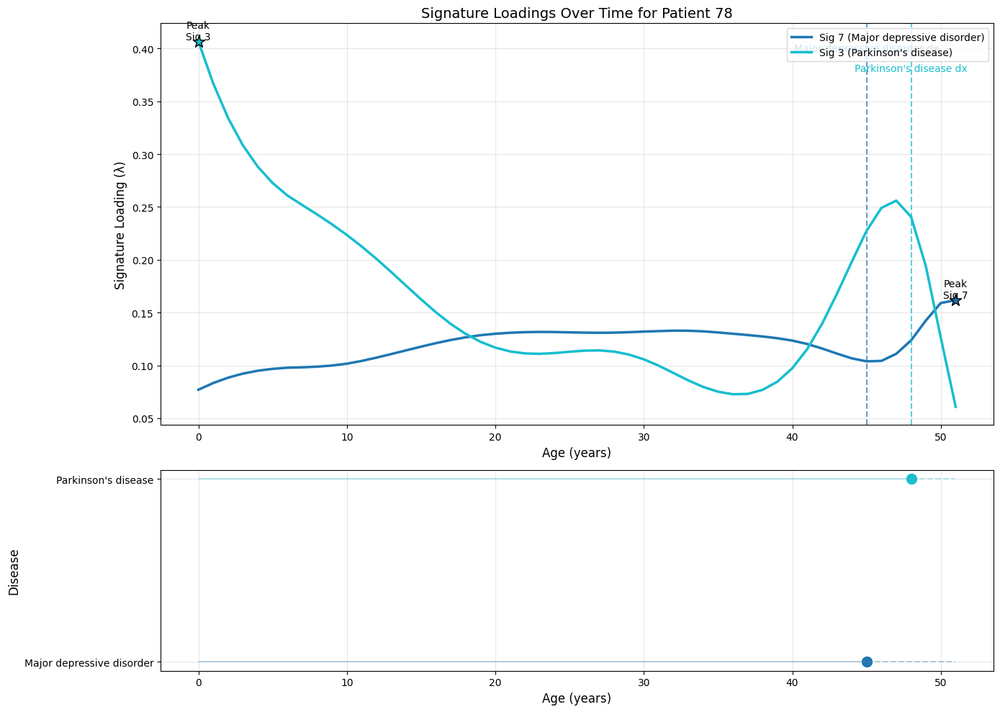


Peak Timing Analysis:
                disease_name  signature  diagnosis_time  peak_time  \
0  Major depressive disorder          7              45         51   
1        Parkinson's disease          3              48          0   

   peak_to_diagnosis  
0                  6  
1                -48  

Analyzing Patient 87:
  - Major depressive disorder diagnosed at age 31
  - Myocardial infarction diagnosed at age 37


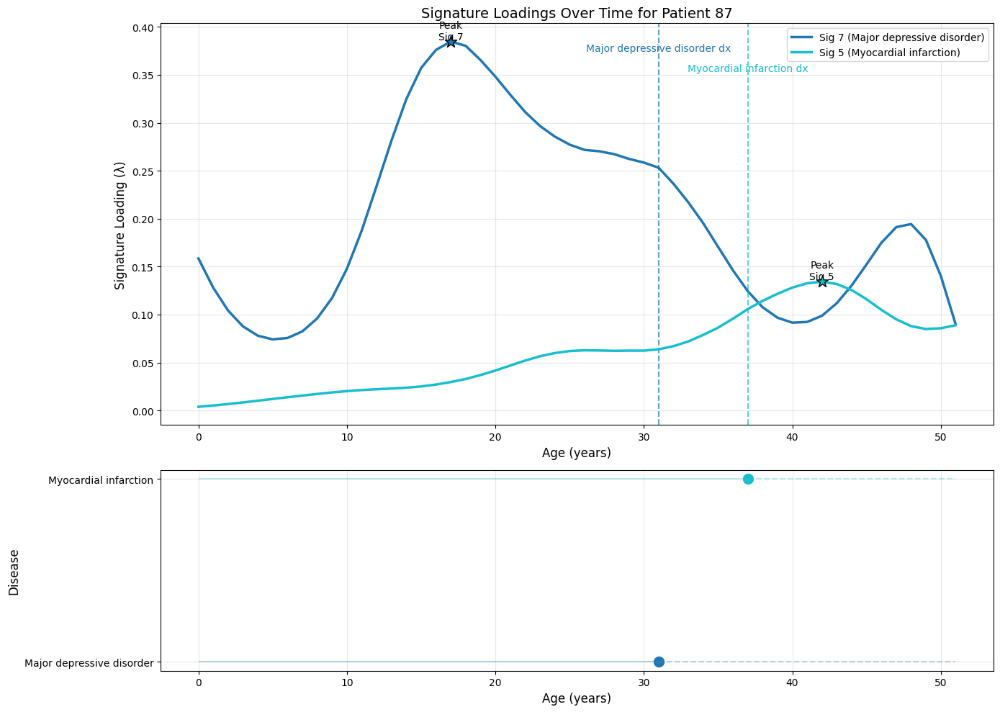


Peak Timing Analysis:
                disease_name  signature  diagnosis_time  peak_time  \
0  Major depressive disorder          7              31         17   
1      Myocardial infarction          5              37         42   

   peak_to_diagnosis  
0                -14  
1                  5  

Analyzing Patient 153:
  - Major depressive disorder diagnosed at age 34
  - Myocardial infarction diagnosed at age 28


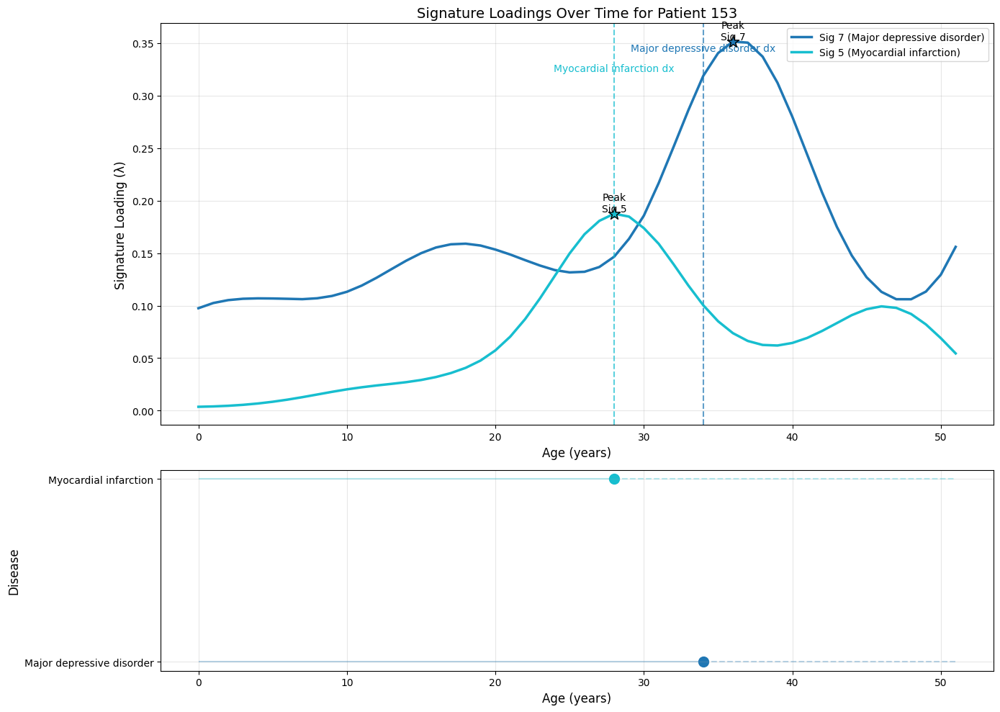


Peak Timing Analysis:
                disease_name  signature  diagnosis_time  peak_time  \
0  Major depressive disorder          7              34         36   
1      Myocardial infarction          5              28         28   

   peak_to_diagnosis  
0                  2  
1                  0  

Analyzing Patient 215:
  - Major depressive disorder diagnosed at age 48
  - Myocardial infarction diagnosed at age 34


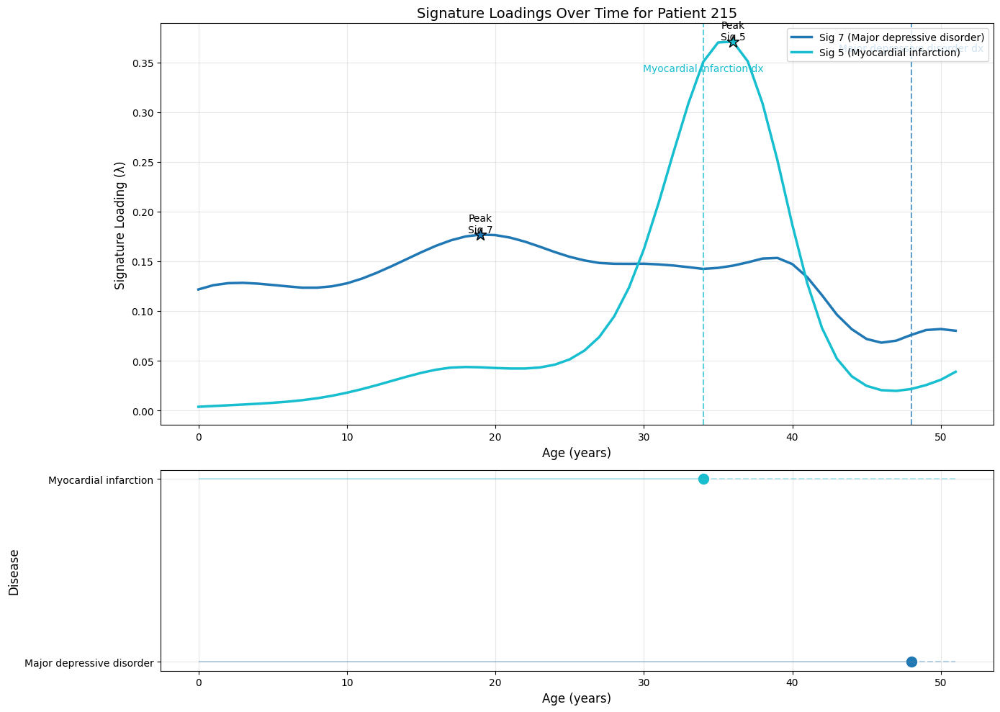


Peak Timing Analysis:
                disease_name  signature  diagnosis_time  peak_time  \
0  Major depressive disorder          7              48         19   
1      Myocardial infarction          5              34         36   

   peak_to_diagnosis  
0                -29  
1                  2  

Analyzing Patient 220:
  - Major depressive disorder diagnosed at age 37
  - Malignant neoplasm of female breast diagnosed at age 27


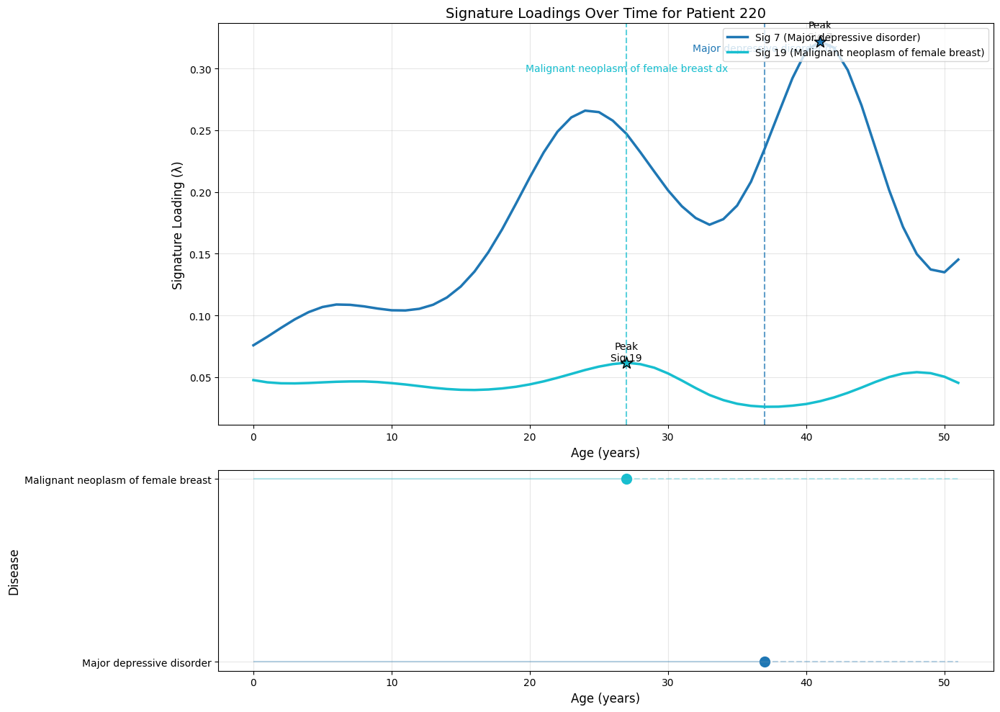


Peak Timing Analysis:
                          disease_name  signature  diagnosis_time  peak_time  \
0            Major depressive disorder          7              37         41   
1  Malignant neoplasm of female breast         19              27         27   

   peak_to_diagnosis  
0                  4  
1                  0  

=== AGGREGATE ANALYSIS ===

Average Peak Timing Relative to Diagnosis:
                                          mean        std  count
disease_name                                                    
Major depressive disorder            -6.200000  15.006665      5
Malignant neoplasm of female breast   0.000000        NaN      1
Myocardial infarction                 2.333333   2.516611      3
Parkinson's disease                 -48.000000        NaN      1

Signature Peak Sequence Analysis:

Common Peak Sequences:
  Major depressive disorder -> Myocardial infarction: 2 patients
  Parkinson's disease -> Major depressive disorder: 1 patients
  Myocardial infar

In [55]:
def find_and_analyze_multi_disease_patients(model, patient_data, 
                                           disease_indices=None, 
                                           min_conditions=2,
                                           max_patients=5):
    """
    Systematically find patients with multiple conditions and analyze their signature patterns
    
    Args:
        model: Trained model with lambda values
        patient_data: Disease occurrence data (Y matrix)
        disease_indices: List of disease indices to consider (default: common diseases)
        min_conditions: Minimum number of conditions a patient must have
        max_patients: Maximum number of patients to analyze
    
    Returns:
        Dictionary with analysis results
    """
    import torch
    import numpy as np
    import matplotlib.pyplot as plt
    from matplotlib.gridspec import GridSpec
    import pandas as pd
    
    # Default to common diseases if not specified
    if disease_indices is None:
        disease_indices = [66, 17, 112, 73, 42, 88]  # MI, Breast Cancer, Diabetes, Depression, etc.
    
    # Get disease names if available
    if hasattr(model, 'disease_names') and model.disease_names is not None:
        disease_names = {idx: model.disease_names[idx] for idx in disease_indices}
    else:
        disease_names = {idx: f"Disease {idx}" for idx in disease_indices}
    
    # Find most associated signatures for each disease
    sig_indices = {}
    for disease_idx in disease_indices:
        psi_disease = model.psi[:, disease_idx].detach()
        sig_indices[disease_idx] = torch.argmax(psi_disease).item()
        print(f"Disease {disease_names[disease_idx]} (idx {disease_idx}) -> Signature {sig_indices[disease_idx]}")
    
    # Find patients with multiple conditions
    multi_disease_patients = []
    patient_conditions = []
    
    # Convert patient_data to numpy if it's a tensor
    if isinstance(patient_data, torch.Tensor):
        Y_data = patient_data.numpy()
    elif isinstance(patient_data, dict) and 'Y' in patient_data:
        Y_data = patient_data['Y'].numpy() if isinstance(patient_data['Y'], torch.Tensor) else patient_data['Y']
    else:
        Y_data = patient_data
    
    # Check each patient
    for patient_idx in range(Y_data.shape[0]):
        # Count conditions for this patient
        conditions = []
        for disease_idx in disease_indices:
            if np.any(Y_data[patient_idx, disease_idx]):
                diag_time = np.where(Y_data[patient_idx, disease_idx])[0][0]
                conditions.append((disease_idx, diag_time))
        
        # If patient has enough conditions, add to list
        if len(conditions) >= min_conditions:
            multi_disease_patients.append(patient_idx)
            patient_conditions.append(conditions)
            
            # Break if we have enough patients
            if len(multi_disease_patients) >= max_patients:
                break
    
    print(f"Found {len(multi_disease_patients)} patients with {min_conditions}+ conditions")
    
    # Analyze each patient
    results = []
    
    for i, patient_idx in enumerate(multi_disease_patients):
        print(f"\nAnalyzing Patient {patient_idx}:")
        
        # Get conditions for this patient
        conditions = patient_conditions[i]
        patient_disease_indices = [c[0] for c in conditions]
        
        # Print conditions
        for disease_idx, diag_time in conditions:
            print(f"  - {disease_names[disease_idx]} diagnosed at age {diag_time}")
        
        # Create patient-specific signature mapping
        patient_sig_mapping = {d: sig_indices[d] for d in patient_disease_indices}
        
        # Create figure
        fig = plt.figure(figsize=(14, 10))
        gs = GridSpec(2, 1, height_ratios=[2, 1])
        
        # Main plot for lambda values
        ax1 = fig.add_subplot(gs[0])
        
        # Get time points
        time_points = np.arange(model.lambda_.shape[2])
        
        # Plot lambda values for each signature
        colors = plt.cm.tab10(np.linspace(0, 1, len(patient_disease_indices)))
        
        # Store peak times and values
        peak_data = []
        
        for j, disease_idx in enumerate(patient_disease_indices):
            sig_idx = patient_sig_mapping[disease_idx]
            diag_time = next(t for d, t in conditions if d == disease_idx)
            
            # Get lambda values for this signature
            lambda_values = torch.softmax(model.lambda_[patient_idx].detach(), dim=0)[sig_idx].numpy()
            
            # Find peak
            peak_time = time_points[np.argmax(lambda_values)]
            peak_value = np.max(lambda_values)
            
            # Store peak data
            peak_data.append({
                'disease_idx': disease_idx,
                'disease_name': disease_names[disease_idx],
                'signature': sig_idx,
                'diagnosis_time': diag_time,
                'peak_time': peak_time,
                'peak_value': peak_value,
                'peak_to_diagnosis': peak_time - diag_time
            })
            
            # Plot with disease-specific color
            line, = ax1.plot(time_points, lambda_values, 
                            color=colors[j], 
                            linewidth=2.5,
                            label=f"Sig {sig_idx} ({disease_names[disease_idx]})")
            
            # Mark diagnosis time
            ax1.axvline(x=diag_time, color=colors[j], linestyle='--', alpha=0.7)
            ax1.text(diag_time, 0.95 - 0.05*j, f"{disease_names[disease_idx]} dx", 
                    color=colors[j], ha='center', va='top', transform=ax1.get_xaxis_transform())
            
            # Mark peak time
            ax1.scatter(peak_time, peak_value, marker='*', s=150, color=colors[j], 
                       edgecolor='black', zorder=10)
            ax1.text(peak_time, peak_value, f"Peak\nSig {sig_idx}", 
                    ha='center', va='bottom', fontsize=10)
        
        # Set title and labels for main plot
        ax1.set_title(f'Signature Loadings Over Time for Patient {patient_idx}', fontsize=14)
        ax1.set_xlabel('Age (years)', fontsize=12)
        ax1.set_ylabel('Signature Loading (λ)', fontsize=12)
        ax1.grid(True, alpha=0.3)
        ax1.legend(loc='upper right')
        
        # Second plot for disease occurrence
        ax2 = fig.add_subplot(gs[1], sharex=ax1)
        
        # Create disease timeline
        for j, disease_idx in enumerate(patient_disease_indices):
            diag_time = next(t for d, t in conditions if d == disease_idx)
            ax2.scatter(diag_time, j, marker='o', s=100, color=colors[j])
            ax2.hlines(j, 0, diag_time, colors=colors[j], linestyles='-', alpha=0.3)
            ax2.hlines(j, diag_time, time_points[-1], colors=colors[j], linestyles='--', alpha=0.3)
        
        # Set y-ticks to disease names
        ax2.set_yticks(range(len(patient_disease_indices)))
        ax2.set_yticklabels([disease_names[idx] for idx in patient_disease_indices])
        ax2.set_ylabel('Disease', fontsize=12)
        ax2.set_xlabel('Age (years)', fontsize=12)
        ax2.grid(True, alpha=0.3)
        
        plt.tight_layout()
        plt.show()
        
        # Create peak timing summary
        peak_df = pd.DataFrame(peak_data)
        print("\nPeak Timing Analysis:")
        print(peak_df[['disease_name', 'signature', 'diagnosis_time', 'peak_time', 'peak_to_diagnosis']])
        
        # Store results
        results.append({
            'patient_idx': patient_idx,
            'conditions': conditions,
            'peak_data': peak_data,
            'peak_df': peak_df,
            'fig': fig
        })
    
    # Aggregate analysis across patients
    if results:
        all_peaks = pd.concat([r['peak_df'] for r in results])
        
        print("\n=== AGGREGATE ANALYSIS ===")
        print("\nAverage Peak Timing Relative to Diagnosis:")
        print(all_peaks.groupby('disease_name')['peak_to_diagnosis'].agg(['mean', 'std', 'count']))
        
        print("\nSignature Peak Sequence Analysis:")
        # For each patient, analyze the sequence of signature peaks
        sequence_patterns = []
        
        for r in results:
            # Sort peaks by time
            sorted_peaks = sorted(r['peak_data'], key=lambda x: x['peak_time'])
            sequence = [(p['disease_name'], p['peak_time']) for p in sorted_peaks]
            sequence_patterns.append(sequence)
        
        # Count common sequences
        sequence_counts = {}
        for seq in sequence_patterns:
            seq_names = tuple(s[0] for s in seq)
            if seq_names in sequence_counts:
                sequence_counts[seq_names] += 1
            else:
                sequence_counts[seq_names] = 1
        
        print("\nCommon Peak Sequences:")
        for seq, count in sorted(sequence_counts.items(), key=lambda x: x[1], reverse=True):
            print(f"  {' -> '.join(seq)}: {count} patients")
    
    return {
        'multi_disease_patients': multi_disease_patients,
        'patient_conditions': patient_conditions,
        'patient_results': results,
        'disease_signatures': sig_indices,
        'aggregate_peaks': all_peaks if results else None
    }

# Usage:
results = find_and_analyze_multi_disease_patients(
    model,
    model.Y,  # Your disease occurrence data
    disease_indices=[66, 17, 112, 73],  # MI, Breast Cancer, Diabetes, Depression
    min_conditions=2,
    max_patients=5
)

In [56]:
def plot_multi_disease_signature_patterns(model, patient_data, patient_idx, 
                                         disease_indices=None, sig_indices=None,
                                         show_population_reference=True):
    """
    Plot lambda values for multiple diseases and their associated signatures for a single patient
    
    Args:
        model: Trained model with lambda values
        patient_data: Dictionary or dataset containing disease occurrence information
        patient_idx: Index of the patient to analyze
        disease_indices: List of disease indices to analyze (default: None, will use common diseases)
        sig_indices: Dictionary mapping disease indices to signature indices (default: None, will use most associated)
        show_population_reference: Whether to show population average signature loadings
    """
    import torch
    import numpy as np
    import matplotlib.pyplot as plt
    from matplotlib.gridspec import GridSpec
    
    # Default to common diseases if not specified
    if disease_indices is None:
        disease_indices = [66, 17, 112]  # MI, Breast Cancer, Diabetes (adjust as needed)
    
    # Get disease names if available
    if hasattr(model, 'disease_names') and model.disease_names is not None:
        disease_names = {idx: model.disease_names[idx] for idx in disease_indices}
    else:
        disease_names = {idx: f"Disease {idx}" for idx in disease_indices}
    
    # Find most associated signatures for each disease if not specified
    if sig_indices is None:
        sig_indices = {}
        for disease_idx in disease_indices:
            psi_disease = model.psi[:, disease_idx].detach()
            sig_indices[disease_idx] = torch.argmax(psi_disease).item()
    
    # Get diagnosis times for each disease
    diagnosis_times = {}
    for disease_idx in disease_indices:
        # Check if patient had this disease
        if isinstance(patient_data, dict) and 'Y' in patient_data:
            # If patient_data is a dictionary with Y matrix
            diag_time = np.where(patient_data['Y'][patient_idx, disease_idx])[0]
        elif hasattr(patient_data, 'shape'):
            # If patient_data is a tensor/array
            diag_time = np.where(patient_data[patient_idx, disease_idx])[0]
        else:
            diag_time = []
            
        if len(diag_time) > 0:
            diagnosis_times[disease_idx] = diag_time[0]
    
    # Create figure with two subplots
    fig = plt.figure(figsize=(14, 10))
    gs = GridSpec(2, 1, height_ratios=[2, 1])
    
    # Main plot for lambda values
    ax1 = fig.add_subplot(gs[0])
    
    # Get time points
    time_points = np.arange(model.lambda_.shape[2])
    
    # Calculate population average signature loadings if requested
    if show_population_reference:
        # Get average lambda values across all patients
        pop_lambda_values = {}
        for disease_idx, sig_idx in sig_indices.items():
            # Calculate mean across all patients
            all_lambdas = torch.softmax(model.lambda_.detach(), dim=1)[:, sig_idx].mean(dim=0).numpy()
            pop_lambda_values[sig_idx] = all_lambdas
    
    # Plot lambda values for each signature
    colors = plt.cm.tab10(np.linspace(0, 1, len(sig_indices)))
    signature_lines = []
    
    for i, (disease_idx, sig_idx) in enumerate(sig_indices.items()):
        # Get lambda values for this signature
        lambda_values = torch.softmax(model.lambda_[patient_idx].detach(), dim=0)[sig_idx].numpy()
        
        # Plot with disease-specific color
        line, = ax1.plot(time_points, lambda_values, 
                        color=colors[i], 
                        linewidth=2.5,
                        label=f"Sig {sig_idx} ({disease_names[disease_idx]})")
        signature_lines.append(line)
        
        # Plot population reference if requested
        if show_population_reference and sig_idx in pop_lambda_values:
            ax1.plot(time_points, pop_lambda_values[sig_idx], 
                    color=colors[i], linestyle='--', alpha=0.5,
                    label=f"Pop avg Sig {sig_idx}")
        
        # Mark diagnosis time if available
        if disease_idx in diagnosis_times:
            diag_time = diagnosis_times[disease_idx]
            ax1.axvline(x=diag_time, color=colors[i], linestyle='--', alpha=0.7)
            ax1.text(diag_time, 0.95 - 0.05*i, f"{disease_names[disease_idx]} dx", 
                    color=colors[i], ha='center', va='top', transform=ax1.get_xaxis_transform())
    
    # Set title and labels for main plot
    ax1.set_title(f'Signature Loadings Over Time for Patient {patient_idx}', fontsize=14)
    ax1.set_xlabel('Age (years)', fontsize=12)
    ax1.set_ylabel('Signature Loading (λ)', fontsize=12)
    ax1.grid(True, alpha=0.3)
    ax1.legend(loc='upper right')
    
    # Second plot for disease occurrence
    ax2 = fig.add_subplot(gs[1], sharex=ax1)
    
    # Create disease timeline
    for i, disease_idx in enumerate(disease_indices):
        if disease_idx in diagnosis_times:
            diag_time = diagnosis_times[disease_idx]
            ax2.scatter(diag_time, i, marker='o', s=100, color=colors[i])
            ax2.hlines(i, 0, diag_time, colors=colors[i], linestyles='-', alpha=0.3)
            ax2.hlines(i, diag_time, time_points[-1], colors=colors[i], linestyles='--', alpha=0.3)
    
    # Set y-ticks to disease names
    ax2.set_yticks(range(len(disease_indices)))
    ax2.set_yticklabels([disease_names[idx] for idx in disease_indices])
    ax2.set_ylabel('Disease', fontsize=12)
    ax2.set_xlabel('Age (years)', fontsize=12)
    ax2.grid(True, alpha=0.3)
    
    # Add annotations for peak times
    for i, (disease_idx, sig_idx) in enumerate(sig_indices.items()):
        lambda_values = torch.softmax(model.lambda_[patient_idx].detach(), dim=0)[sig_idx].numpy()
        peak_time = time_points[np.argmax(lambda_values)]
        peak_value = np.max(lambda_values)
        
        ax1.scatter(peak_time, peak_value, marker='*', s=150, color=colors[i], 
                   edgecolor='black', zorder=10)
        ax1.text(peak_time, peak_value, f"Peak\nSig {sig_idx}", 
                ha='center', va='bottom', fontsize=10)
    
    plt.tight_layout()
    plt.show()
    
    # Return information for further analysis
    return {
        'patient_idx': patient_idx,
        'disease_indices': disease_indices,
        'sig_indices': sig_indices,
        'diagnosis_times': diagnosis_times,
        'fig': fig
    }

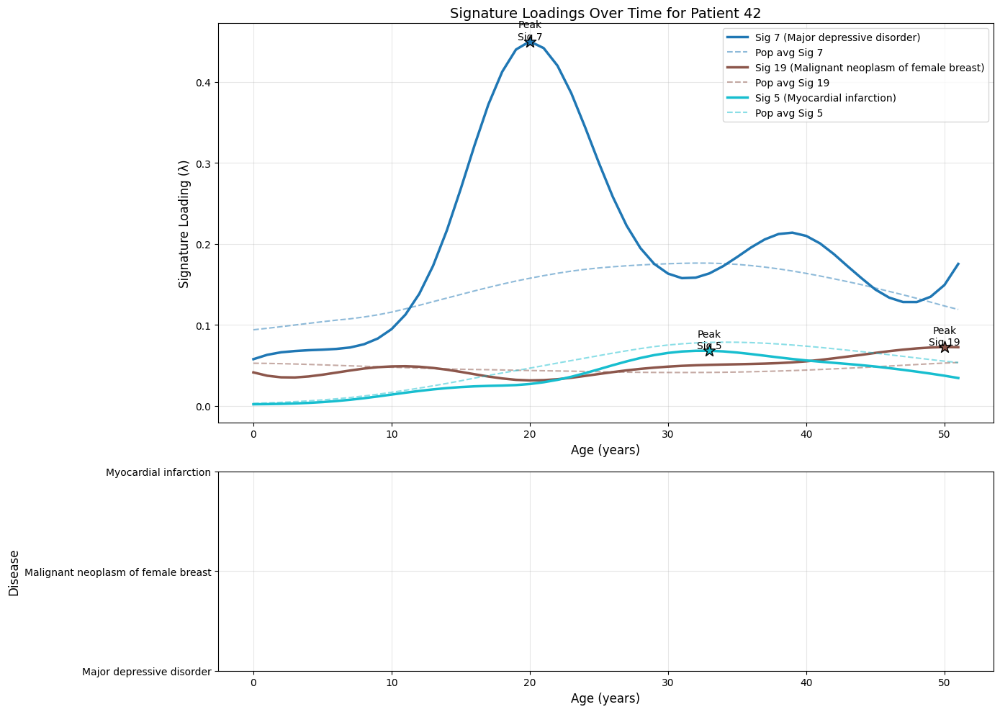

{'patient_idx': 42,
 'disease_indices': [66, 17, 112],
 'sig_indices': {66: 7, 17: 19, 112: 5},
 'diagnosis_times': {},
 'fig': <Figure size 1400x1000 with 2 Axes>}

In [57]:
plot_multi_disease_signature_patterns(model, model.Y, 42,
                                         disease_indices=None, sig_indices=None,
                                         show_population_reference=True)

Disease Major depressive disorder (idx 66) -> Signature 7
Disease Malignant neoplasm of female breast (idx 17) -> Signature 19
Disease Myocardial infarction (idx 112) -> Signature 5
Disease Atrial fibrillation and flutter (idx 127) -> Signature 0
Found 270 patients with 2+ conditions
Randomly selected 5 patients for analysis

Analyzing Patient 1937:
  - Myocardial infarction diagnosed at age 46
  - Atrial fibrillation and flutter diagnosed at age 37


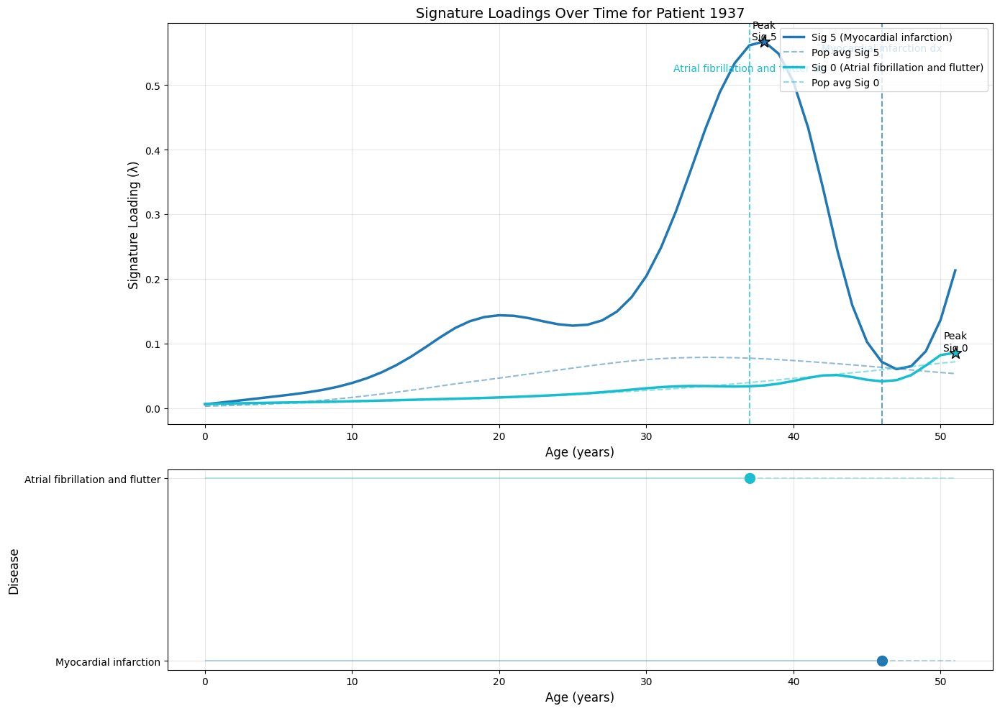


Peak Timing Analysis:
                      disease_name  signature  diagnosis_time  peak_time  \
0            Myocardial infarction          5              46         38   
1  Atrial fibrillation and flutter          0              37         51   

   peak_to_diagnosis  
0                 -8  
1                 14  

Analyzing Patient 358:
  - Major depressive disorder diagnosed at age 44
  - Myocardial infarction diagnosed at age 43


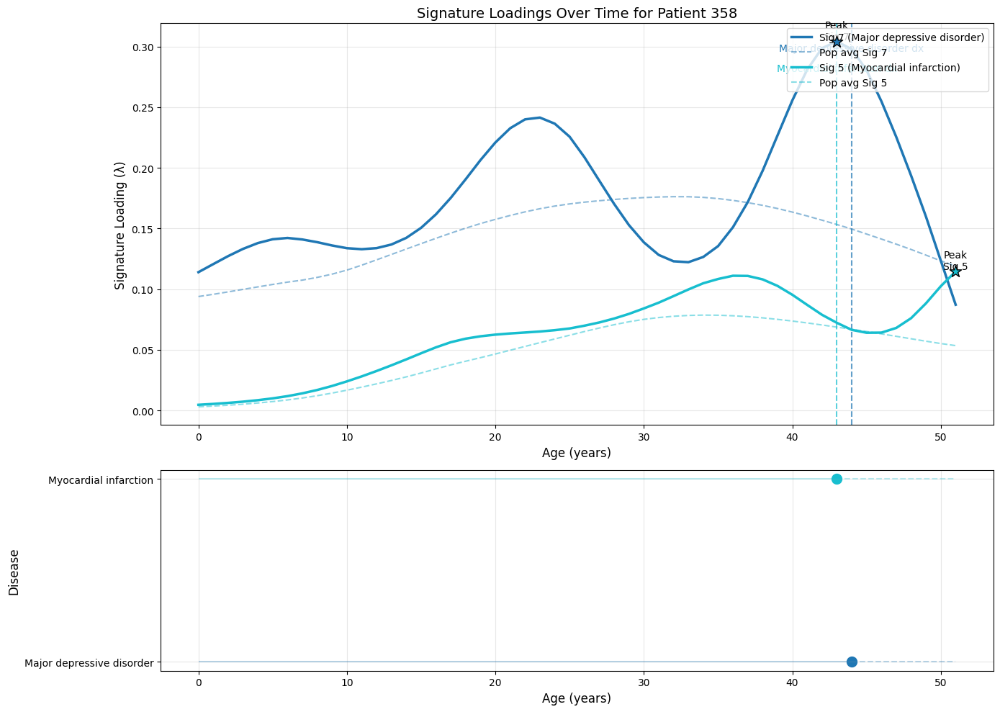


Peak Timing Analysis:
                disease_name  signature  diagnosis_time  peak_time  \
0  Major depressive disorder          7              44         43   
1      Myocardial infarction          5              43         51   

   peak_to_diagnosis  
0                 -1  
1                  8  

Analyzing Patient 4803:
  - Myocardial infarction diagnosed at age 27
  - Atrial fibrillation and flutter diagnosed at age 9


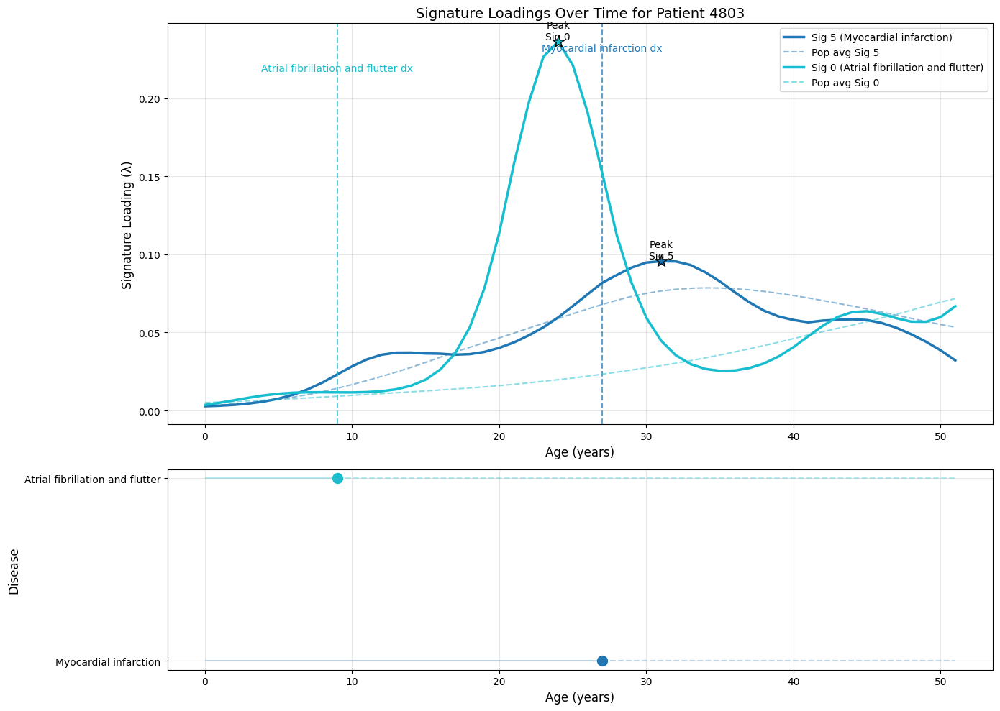


Peak Timing Analysis:
                      disease_name  signature  diagnosis_time  peak_time  \
0            Myocardial infarction          5              27         31   
1  Atrial fibrillation and flutter          0               9         24   

   peak_to_diagnosis  
0                  4  
1                 15  

Analyzing Patient 4242:
  - Major depressive disorder diagnosed at age 11
  - Myocardial infarction diagnosed at age 21


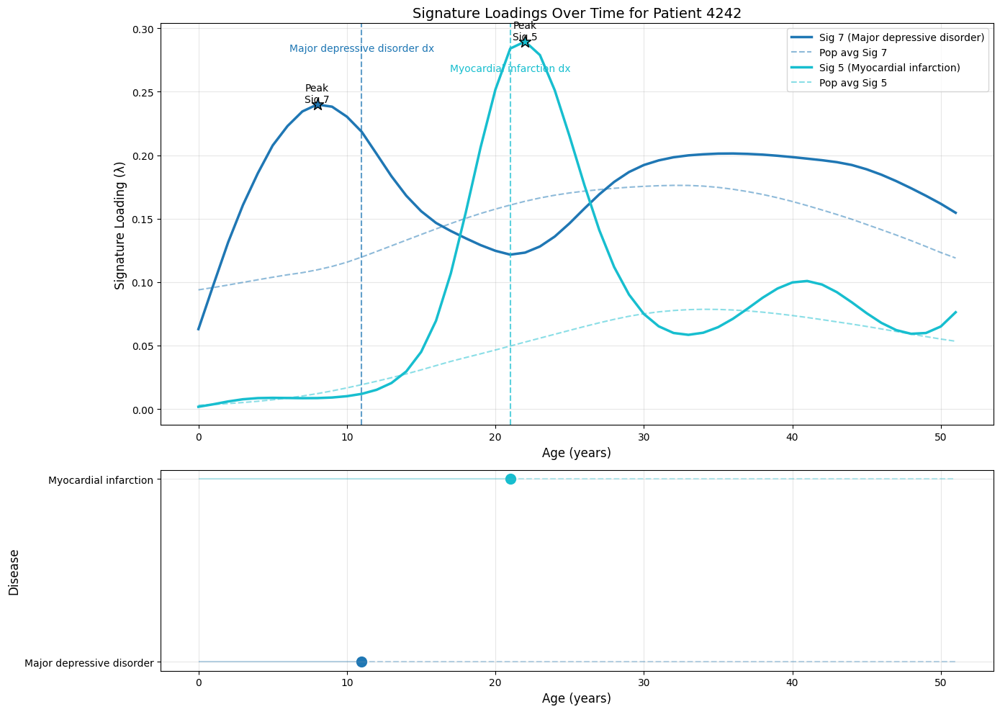


Peak Timing Analysis:
                disease_name  signature  diagnosis_time  peak_time  \
0  Major depressive disorder          7              11          8   
1      Myocardial infarction          5              21         22   

   peak_to_diagnosis  
0                 -3  
1                  1  

Analyzing Patient 3908:
  - Myocardial infarction diagnosed at age 42
  - Atrial fibrillation and flutter diagnosed at age 32


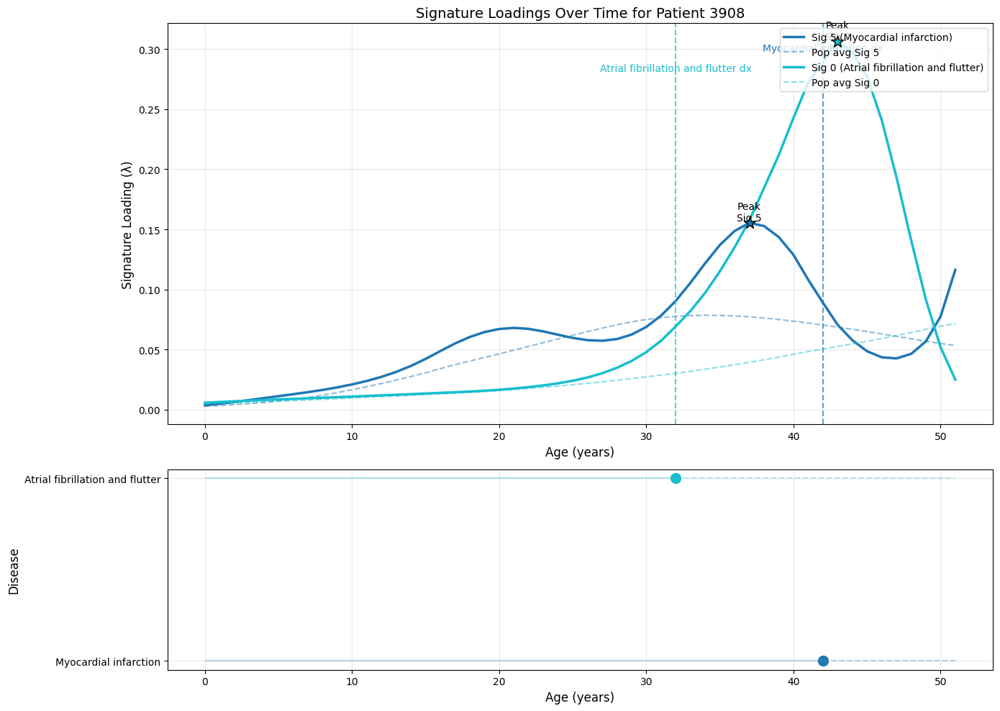


Peak Timing Analysis:
                      disease_name  signature  diagnosis_time  peak_time  \
0            Myocardial infarction          5              42         37   
1  Atrial fibrillation and flutter          0              32         43   

   peak_to_diagnosis  
0                 -5  
1                 11  

=== AGGREGATE ANALYSIS ===

Average Peak Timing Relative to Diagnosis:
                                      mean       std  count
disease_name                                               
Atrial fibrillation and flutter  13.333333  2.081666      3
Major depressive disorder        -2.000000  1.414214      2
Myocardial infarction             0.000000  6.519202      5

Signature Peak Sequence Analysis:

Common Peak Sequences:
  Myocardial infarction -> Atrial fibrillation and flutter: 2 patients
  Major depressive disorder -> Myocardial infarction: 2 patients
  Atrial fibrillation and flutter -> Myocardial infarction: 1 patients


In [59]:
def analyze_random_multi_disease_patients(model, patient_data, 
                                         disease_indices=None, 
                                         min_conditions=2,
                                         n_patients=5,
                                         random_seed=42):
    """
    Randomly select and analyze patients with multiple conditions
    
    Args:
        model: Trained model with lambda values
        patient_data: Disease occurrence data (Y matrix)
        disease_indices: List of disease indices to consider (default: common diseases)
        min_conditions: Minimum number of conditions a patient must have
        n_patients: Number of random patients to analyze
        random_seed: Random seed for reproducibility
    
    Returns:
        Dictionary with analysis results
    """
    import torch
    import numpy as np
    import matplotlib.pyplot as plt
    from matplotlib.gridspec import GridSpec
    import pandas as pd
    import random
    
    # Set random seed for reproducibility
    random.seed(random_seed)
    np.random.seed(random_seed)
    
    # Default to common diseases if not specified
    if disease_indices is None:
        disease_indices = [66, 17, 112, 73, 42, 88]  # MI, Breast Cancer, Diabetes, Depression, etc.
    
    # Get disease names if available
    if hasattr(model, 'disease_names') and model.disease_names is not None:
        disease_names = {idx: model.disease_names[idx] for idx in disease_indices}
    else:
        disease_names = {idx: f"Disease {idx}" for idx in disease_indices}
    
    # Find most associated signatures for each disease
    sig_indices = {}
    for disease_idx in disease_indices:
        psi_disease = model.psi[:, disease_idx].detach()
        sig_indices[disease_idx] = torch.argmax(psi_disease).item()
        print(f"Disease {disease_names[disease_idx]} (idx {disease_idx}) -> Signature {sig_indices[disease_idx]}")
    
    # Find patients with multiple conditions
    multi_disease_patients = []
    patient_conditions = []
    
    # Convert patient_data to numpy if it's a tensor
    if isinstance(patient_data, torch.Tensor):
        Y_data = patient_data.numpy()
    elif isinstance(patient_data, dict) and 'Y' in patient_data:
        Y_data = patient_data['Y'].numpy() if isinstance(patient_data['Y'], torch.Tensor) else patient_data['Y']
    else:
        Y_data = patient_data
    
    # Check each patient
    for patient_idx in range(Y_data.shape[0]):
        # Count conditions for this patient
        conditions = []
        for disease_idx in disease_indices:
            if np.any(Y_data[patient_idx, disease_idx]):
                diag_time = np.where(Y_data[patient_idx, disease_idx])[0][0]
                conditions.append((disease_idx, diag_time))
        
        # If patient has enough conditions, add to list
        if len(conditions) >= min_conditions:
            multi_disease_patients.append(patient_idx)
            patient_conditions.append(conditions)
    
    print(f"Found {len(multi_disease_patients)} patients with {min_conditions}+ conditions")
    
    # Randomly select patients
    if len(multi_disease_patients) > n_patients:
        selected_indices = random.sample(range(len(multi_disease_patients)), n_patients)
        selected_patients = [multi_disease_patients[i] for i in selected_indices]
        selected_conditions = [patient_conditions[i] for i in selected_indices]
    else:
        selected_patients = multi_disease_patients
        selected_conditions = patient_conditions
    
    print(f"Randomly selected {len(selected_patients)} patients for analysis")
    
    # Calculate population average signature loadings
    pop_lambda_values = {}
    for disease_idx, sig_idx in sig_indices.items():
        # Calculate mean across all patients
        all_lambdas = torch.softmax(model.lambda_.detach(), dim=1)[:, sig_idx].mean(dim=0).numpy()
        pop_lambda_values[sig_idx] = all_lambdas
    
    # Analyze each selected patient
    results = []
    
    for i, patient_idx in enumerate(selected_patients):
        print(f"\nAnalyzing Patient {patient_idx}:")
        
        # Get conditions for this patient
        conditions = selected_conditions[i]
        patient_disease_indices = [c[0] for c in conditions]
        
        # Print conditions
        for disease_idx, diag_time in conditions:
            print(f"  - {disease_names[disease_idx]} diagnosed at age {diag_time}")
        
        # Create patient-specific signature mapping
        patient_sig_mapping = {d: sig_indices[d] for d in patient_disease_indices}
        
        # Create figure
        fig = plt.figure(figsize=(14, 10))
        gs = GridSpec(2, 1, height_ratios=[2, 1])
        
        # Main plot for lambda values
        ax1 = fig.add_subplot(gs[0])
        
        # Get time points
        time_points = np.arange(model.lambda_.shape[2])
        
        # Plot lambda values for each signature
        colors = plt.cm.tab10(np.linspace(0, 1, len(patient_disease_indices)))
        
        # Store peak times and values
        peak_data = []
        
        for j, disease_idx in enumerate(patient_disease_indices):
            sig_idx = patient_sig_mapping[disease_idx]
            diag_time = next(t for d, t in conditions if d == disease_idx)
            
            # Get lambda values for this signature
            lambda_values = torch.softmax(model.lambda_[patient_idx].detach(), dim=0)[sig_idx].numpy()
            
            # Find peak
            peak_time = time_points[np.argmax(lambda_values)]
            peak_value = np.max(lambda_values)
            
            # Store peak data
            peak_data.append({
                'disease_idx': disease_idx,
                'disease_name': disease_names[disease_idx],
                'signature': sig_idx,
                'diagnosis_time': diag_time,
                'peak_time': peak_time,
                'peak_value': peak_value,
                'peak_to_diagnosis': peak_time - diag_time
            })
            
            # Plot with disease-specific color
            line, = ax1.plot(time_points, lambda_values, 
                            color=colors[j], 
                            linewidth=2.5,
                            label=f"Sig {sig_idx} ({disease_names[disease_idx]})")
            
            # Plot population average
            ax1.plot(time_points, pop_lambda_values[sig_idx], 
                    color=colors[j], linestyle='--', alpha=0.5,
                    label=f"Pop avg Sig {sig_idx}")
            
            # Mark diagnosis time
            ax1.axvline(x=diag_time, color=colors[j], linestyle='--', alpha=0.7)
            ax1.text(diag_time, 0.95 - 0.05*j, f"{disease_names[disease_idx]} dx", 
                    color=colors[j], ha='center', va='top', transform=ax1.get_xaxis_transform())
            
            # Mark peak time
            ax1.scatter(peak_time, peak_value, marker='*', s=150, color=colors[j], 
                       edgecolor='black', zorder=10)
            ax1.text(peak_time, peak_value, f"Peak\nSig {sig_idx}", 
                    ha='center', va='bottom', fontsize=10)
        
        # Set title and labels for main plot
        ax1.set_title(f'Signature Loadings Over Time for Patient {patient_idx}', fontsize=14)
        ax1.set_xlabel('Age (years)', fontsize=12)
        ax1.set_ylabel('Signature Loading (λ)', fontsize=12)
        ax1.grid(True, alpha=0.3)
        ax1.legend(loc='upper right')
        
        # Second plot for disease occurrence
        ax2 = fig.add_subplot(gs[1], sharex=ax1)
        
        # Create disease timeline
        for j, disease_idx in enumerate(patient_disease_indices):
            diag_time = next(t for d, t in conditions if d == disease_idx)
            ax2.scatter(diag_time, j, marker='o', s=100, color=colors[j])
            ax2.hlines(j, 0, diag_time, colors=colors[j], linestyles='-', alpha=0.3)
            ax2.hlines(j, diag_time, time_points[-1], colors=colors[j], linestyles='--', alpha=0.3)
        
        # Set y-ticks to disease names
        ax2.set_yticks(range(len(patient_disease_indices)))
        ax2.set_yticklabels([disease_names[idx] for idx in patient_disease_indices])
        ax2.set_ylabel('Disease', fontsize=12)
        ax2.set_xlabel('Age (years)', fontsize=12)
        ax2.grid(True, alpha=0.3)
        
        plt.tight_layout()
        plt.show()
        
        # Create peak timing summary
        peak_df = pd.DataFrame(peak_data)
        print("\nPeak Timing Analysis:")
        print(peak_df[['disease_name', 'signature', 'diagnosis_time', 'peak_time', 'peak_to_diagnosis']])
        
        # Store results
        results.append({
            'patient_idx': patient_idx,
            'conditions': conditions,
            'peak_data': peak_data,
            'peak_df': peak_df,
            'fig': fig
        })
    
    # Aggregate analysis across patients
    if results:
        all_peaks = pd.concat([r['peak_df'] for r in results])
        
        print("\n=== AGGREGATE ANALYSIS ===")
        print("\nAverage Peak Timing Relative to Diagnosis:")
        print(all_peaks.groupby('disease_name')['peak_to_diagnosis'].agg(['mean', 'std', 'count']))
        
        print("\nSignature Peak Sequence Analysis:")
        # For each patient, analyze the sequence of signature peaks
        sequence_patterns = []
        
        for r in results:
            # Sort peaks by time
            sorted_peaks = sorted(r['peak_data'], key=lambda x: x['peak_time'])
            sequence = [(p['disease_name'], p['peak_time']) for p in sorted_peaks]
            sequence_patterns.append(sequence)
        
        # Count common sequences
        sequence_counts = {}
        for seq in sequence_patterns:
            seq_names = tuple(s[0] for s in seq)
            if seq_names in sequence_counts:
                sequence_counts[seq_names] += 1
            else:
                sequence_counts[seq_names] = 1
        
        print("\nCommon Peak Sequences:")
        for seq, count in sorted(sequence_counts.items(), key=lambda x: x[1], reverse=True):
            print(f"  {' -> '.join(seq)}: {count} patients")
    
    return {
        'multi_disease_patients': multi_disease_patients,
        'selected_patients': selected_patients,
        'patient_conditions': selected_conditions,
        'patient_results': results,
        'disease_signatures': sig_indices,
        'aggregate_peaks': all_peaks if results else None
    }

# Usage:
results = analyze_random_multi_disease_patients(
    model,
    model.Y,  # Your disease occurrence data
    disease_indices=[66, 17, 112, 127],  # MI, Breast Cancer, Diabetes, Depression
    min_conditions=2,
    n_patients=5
)

Disease Primary open angle glaucoma (idx 88) -> Signature 10
Disease Hearing loss (idx 104) -> Signature 3
Disease Myocardial infarction (idx 112) -> Signature 5
Disease Atrial fibrillation and flutter (idx 127) -> Signature 0
Found 171 patients with 2+ conditions
Randomly selected 3 patients for analysis

Analyzing Patient 9439:
  - Myocardial infarction diagnosed at age 19
  - Atrial fibrillation and flutter diagnosed at age 23


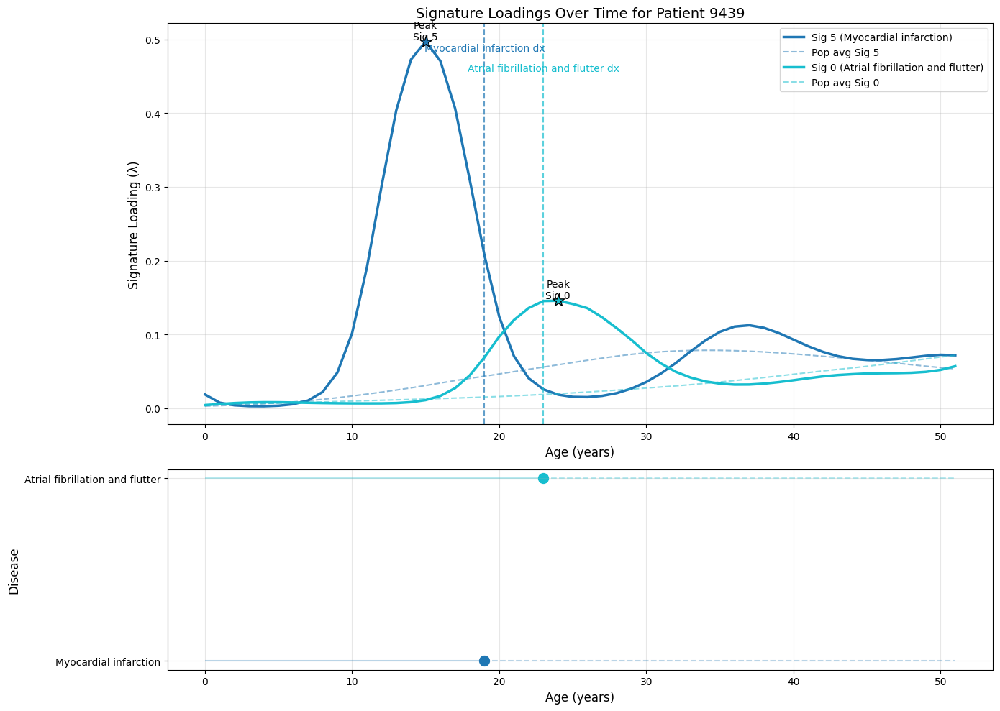


Peak Timing Analysis:
                      disease_name  signature  diagnosis_time  peak_time  \
0            Myocardial infarction          5              19         15   
1  Atrial fibrillation and flutter          0              23         24   

   peak_to_diagnosis  
0                 -4  
1                  1  

Analyzing Patient 1215:
  - Hearing loss diagnosed at age 42
  - Myocardial infarction diagnosed at age 44


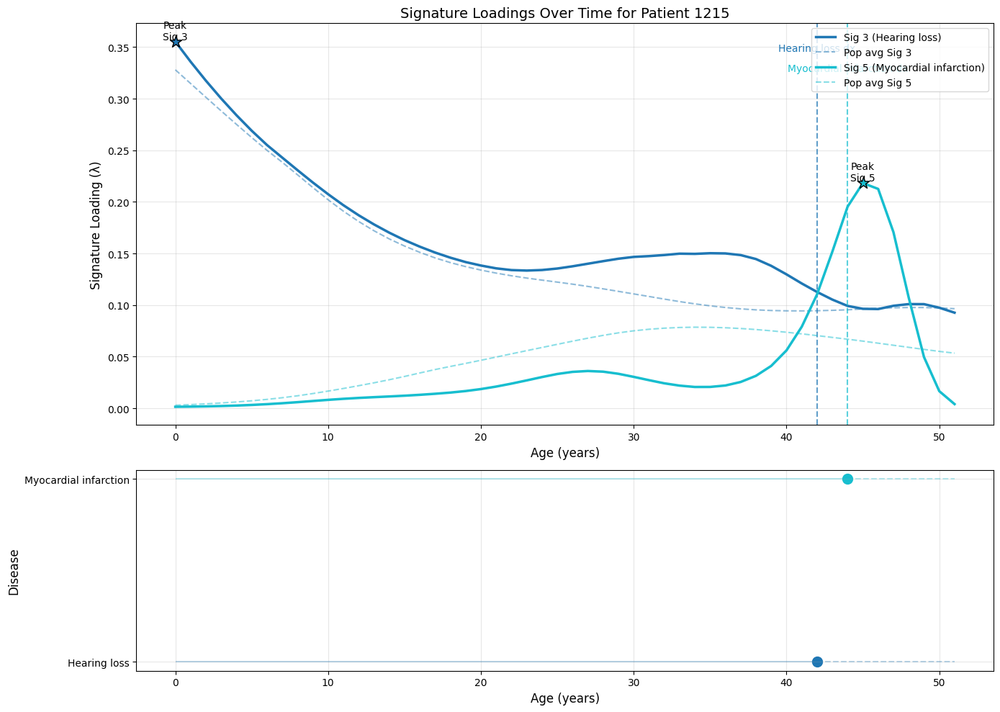


Peak Timing Analysis:
            disease_name  signature  diagnosis_time  peak_time  \
0           Hearing loss          3              42          0   
1  Myocardial infarction          5              44         45   

   peak_to_diagnosis  
0                -42  
1                  1  

Analyzing Patient 153:
  - Myocardial infarction diagnosed at age 28
  - Atrial fibrillation and flutter diagnosed at age 29


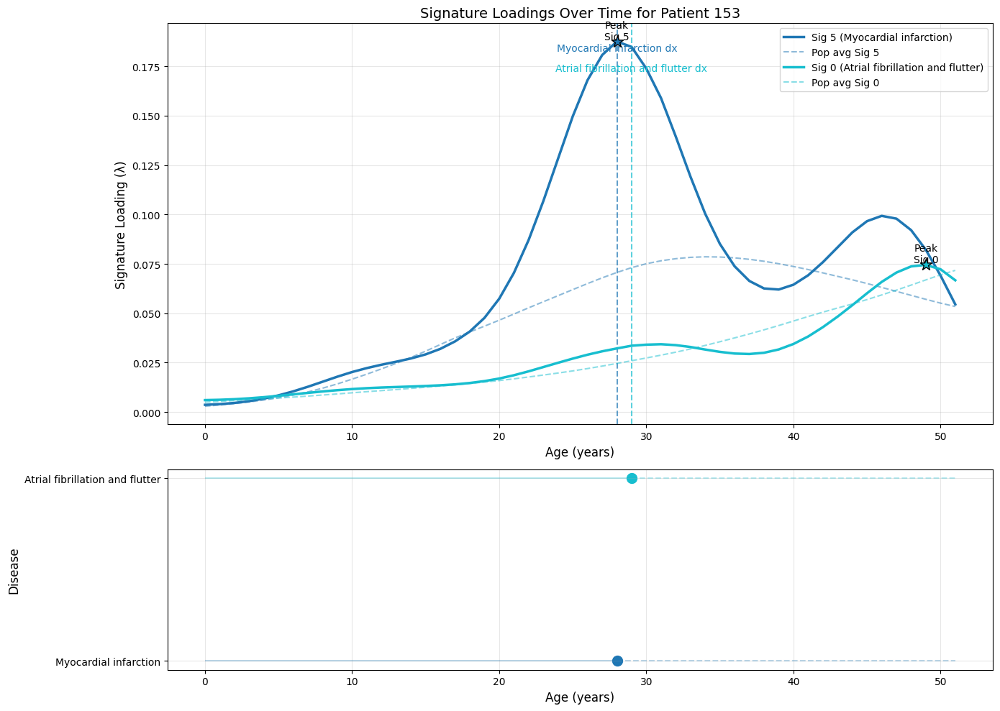


Peak Timing Analysis:
                      disease_name  signature  diagnosis_time  peak_time  \
0            Myocardial infarction          5              28         28   
1  Atrial fibrillation and flutter          0              29         49   

   peak_to_diagnosis  
0                  0  
1                 20  

=== AGGREGATE ANALYSIS ===

Average Peak Timing Relative to Diagnosis:
                                 mean        std  count
disease_name                                           
Atrial fibrillation and flutter  10.5  13.435029      2
Hearing loss                    -42.0        NaN      1
Myocardial infarction            -1.0   2.645751      3

Signature Peak Sequence Analysis:

Common Peak Sequences:
  Myocardial infarction -> Atrial fibrillation and flutter: 2 patients
  Hearing loss -> Myocardial infarction: 1 patients
Disease Malignant neoplasm of female breast (idx 17) -> Signature 19
Disease Secondary malignant neoplasm (idx 25) -> Signature 6
Disease Seconda

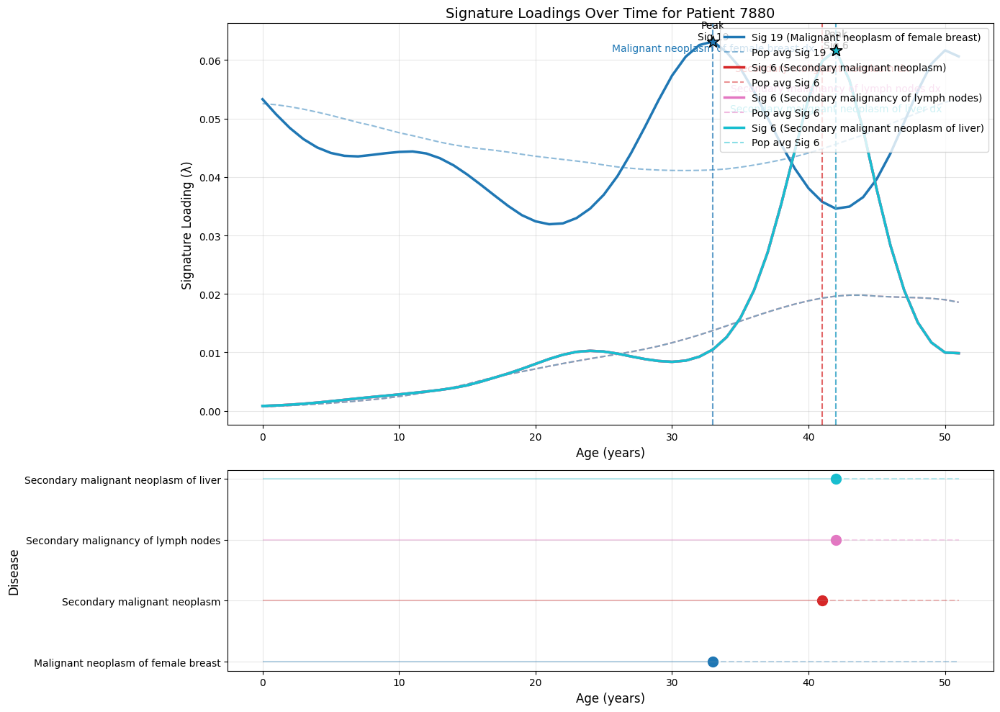


Peak Timing Analysis:
                            disease_name  signature  diagnosis_time  \
0    Malignant neoplasm of female breast         19              33   
1           Secondary malignant neoplasm          6              41   
2    Secondary malignancy of lymph nodes          6              42   
3  Secondary malignant neoplasm of liver          6              42   

   peak_time  peak_to_diagnosis  
0         33                  0  
1         42                  1  
2         42                  0  
3         42                  0  

Analyzing Patient 1556:
  - Secondary malignancy of lymph nodes diagnosed at age 42
  - Secondary malignant neoplasm of liver diagnosed at age 43


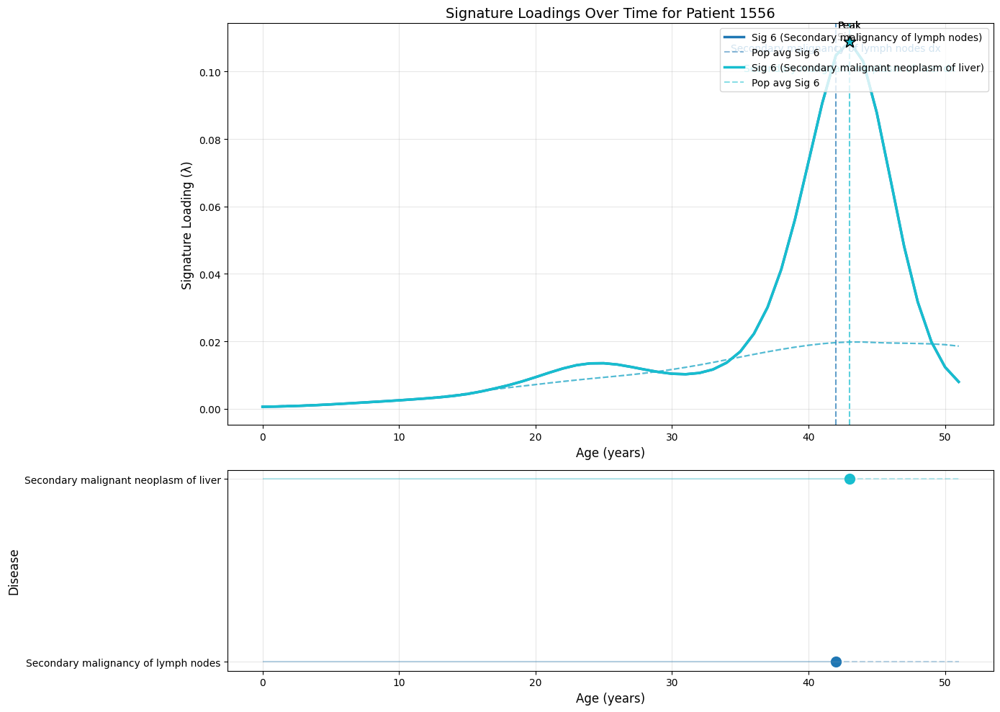


Peak Timing Analysis:
                            disease_name  signature  diagnosis_time  \
0    Secondary malignancy of lymph nodes          6              42   
1  Secondary malignant neoplasm of liver          6              43   

   peak_time  peak_to_diagnosis  
0         43                  1  
1         43                  0  

Analyzing Patient 290:
  - Malignant neoplasm of female breast diagnosed at age 40
  - Secondary malignancy of lymph nodes diagnosed at age 40


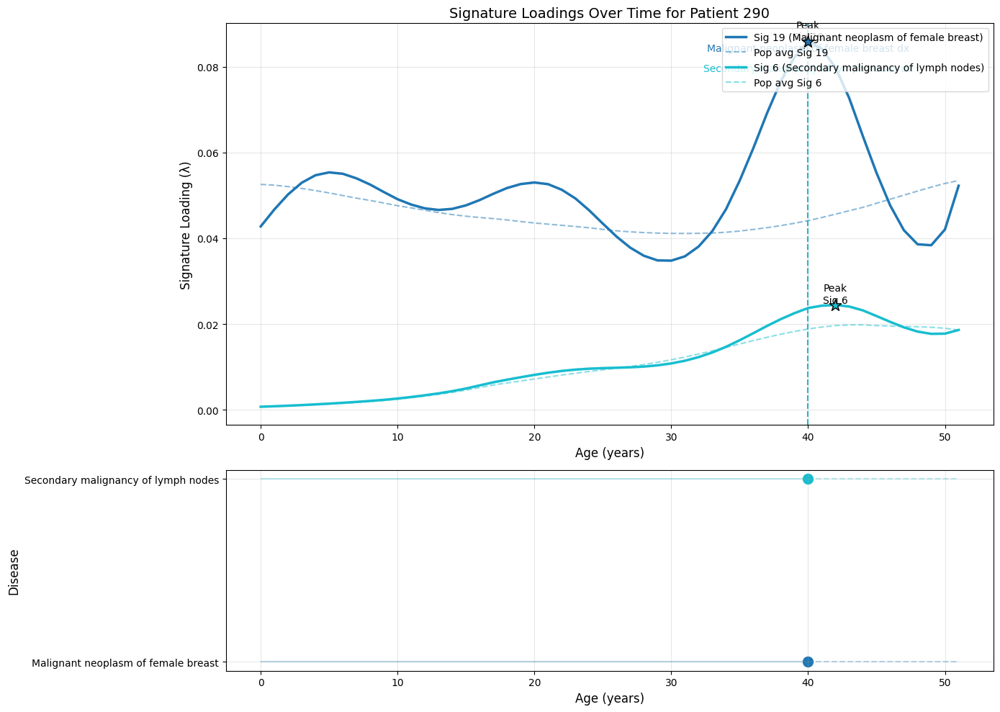


Peak Timing Analysis:
                          disease_name  signature  diagnosis_time  peak_time  \
0  Malignant neoplasm of female breast         19              40         40   
1  Secondary malignancy of lymph nodes          6              40         42   

   peak_to_diagnosis  
0                  0  
1                  2  

=== AGGREGATE ANALYSIS ===

Average Peak Timing Relative to Diagnosis:
                                       mean  std  count
disease_name                                           
Malignant neoplasm of female breast     0.0  0.0      2
Secondary malignancy of lymph nodes     1.0  1.0      3
Secondary malignant neoplasm            1.0  NaN      1
Secondary malignant neoplasm of liver   0.0  0.0      2

Signature Peak Sequence Analysis:

Common Peak Sequences:
  Malignant neoplasm of female breast -> Secondary malignant neoplasm -> Secondary malignancy of lymph nodes -> Secondary malignant neoplasm of liver: 1 patients
  Secondary malignancy of lymph nodes 

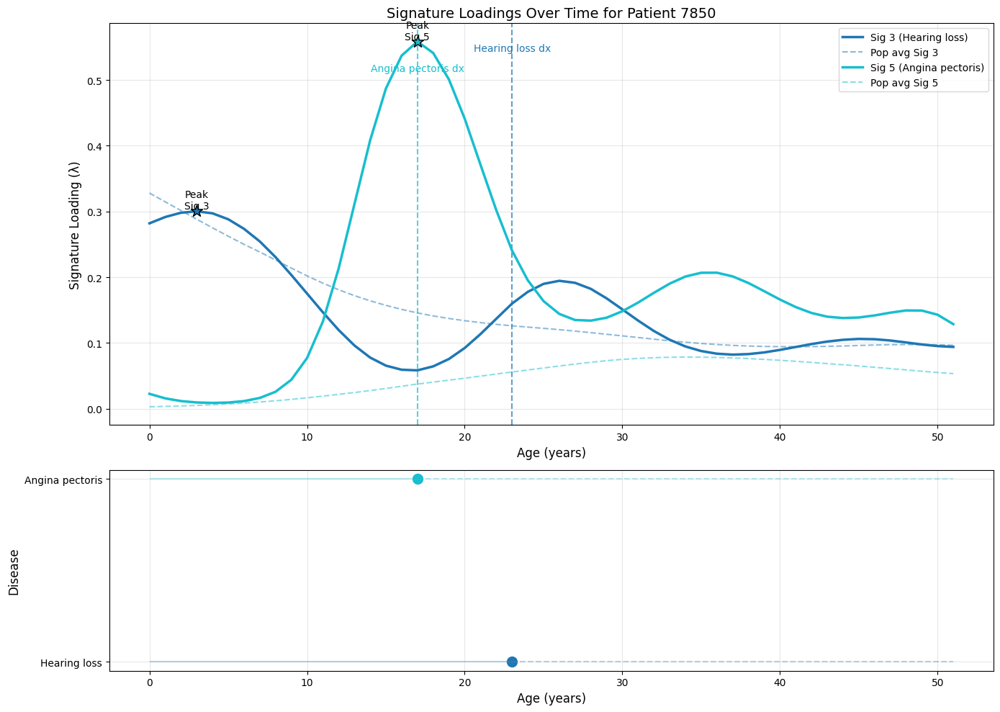


Peak Timing Analysis:
      disease_name  signature  diagnosis_time  peak_time  peak_to_diagnosis
0     Hearing loss          3              23          3                -20
1  Angina pectoris          5              17         17                  0

Analyzing Patient 1593:
  - Type 2 diabetes diagnosed at age 37
  - Iron deficiency anemias, unspecified or not due to blood loss diagnosed at age 48
  - Angina pectoris diagnosed at age 50


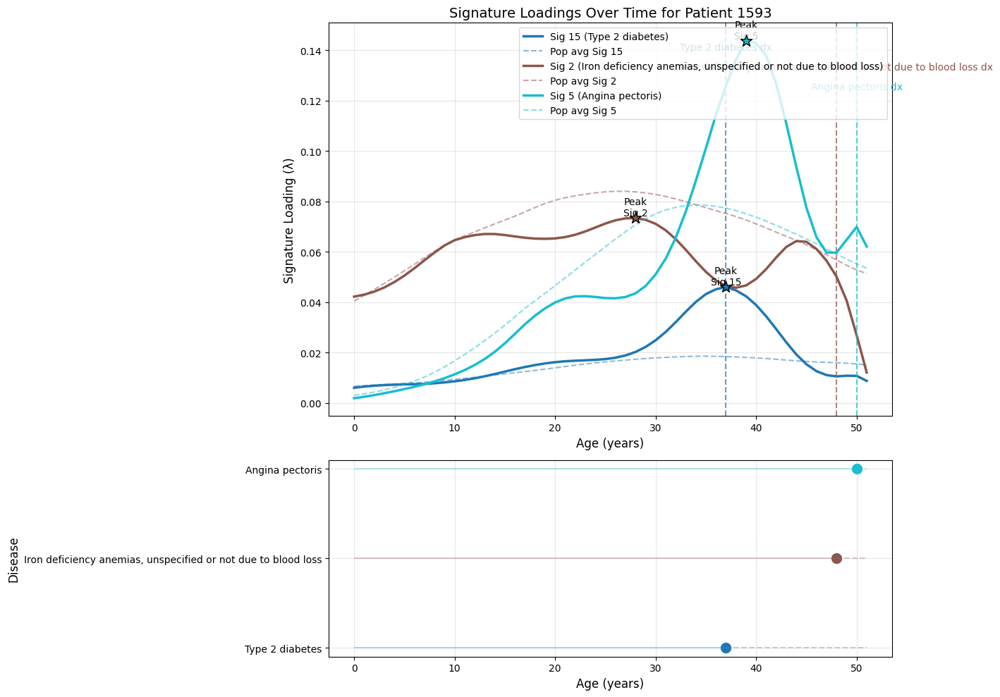


Peak Timing Analysis:
                                        disease_name  signature  \
0                                    Type 2 diabetes         15   
1  Iron deficiency anemias, unspecified or not du...          2   
2                                    Angina pectoris          5   

   diagnosis_time  peak_time  peak_to_diagnosis  
0              37         37                  0  
1              48         28                -20  
2              50         39                -11  

Analyzing Patient 345:
  - Type 2 diabetes diagnosed at age 39
  - Angina pectoris diagnosed at age 32


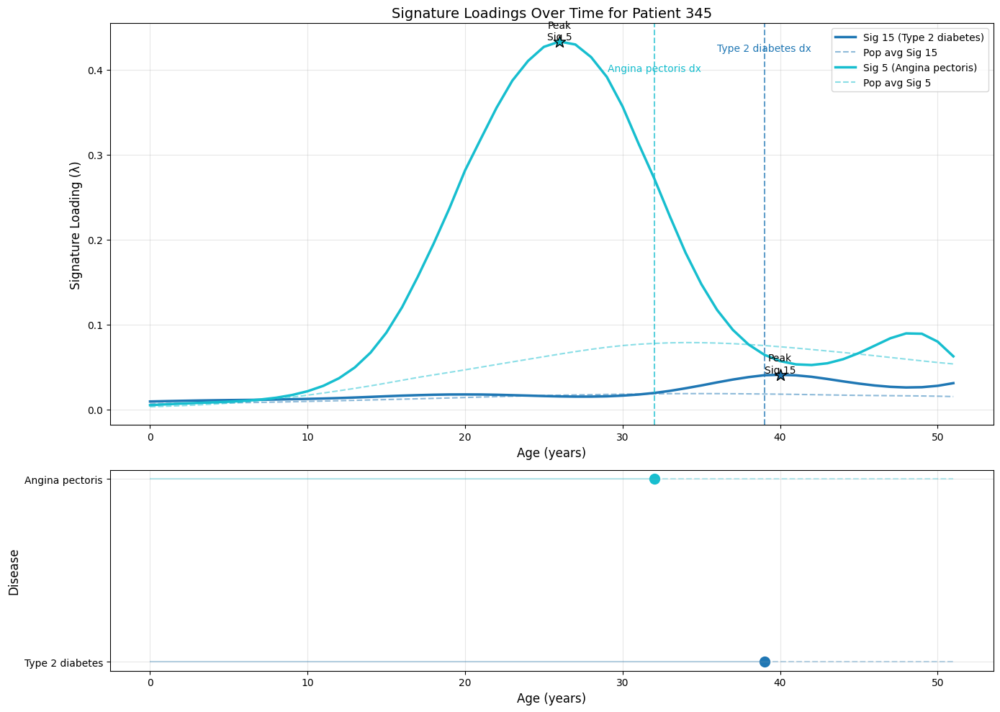


Peak Timing Analysis:
      disease_name  signature  diagnosis_time  peak_time  peak_to_diagnosis
0  Type 2 diabetes         15              39         40                  1
1  Angina pectoris          5              32         26                 -6

=== AGGREGATE ANALYSIS ===

Average Peak Timing Relative to Diagnosis:
                                                         mean       std  count
disease_name                                                                  
Angina pectoris                                     -5.666667  5.507571      3
Hearing loss                                       -20.000000       NaN      1
Iron deficiency anemias, unspecified or not due... -20.000000       NaN      1
Type 2 diabetes                                      0.500000  0.707107      2

Signature Peak Sequence Analysis:

Common Peak Sequences:
  Hearing loss -> Angina pectoris: 1 patients
  Iron deficiency anemias, unspecified or not due to blood loss -> Type 2 diabetes -> Angina pecto

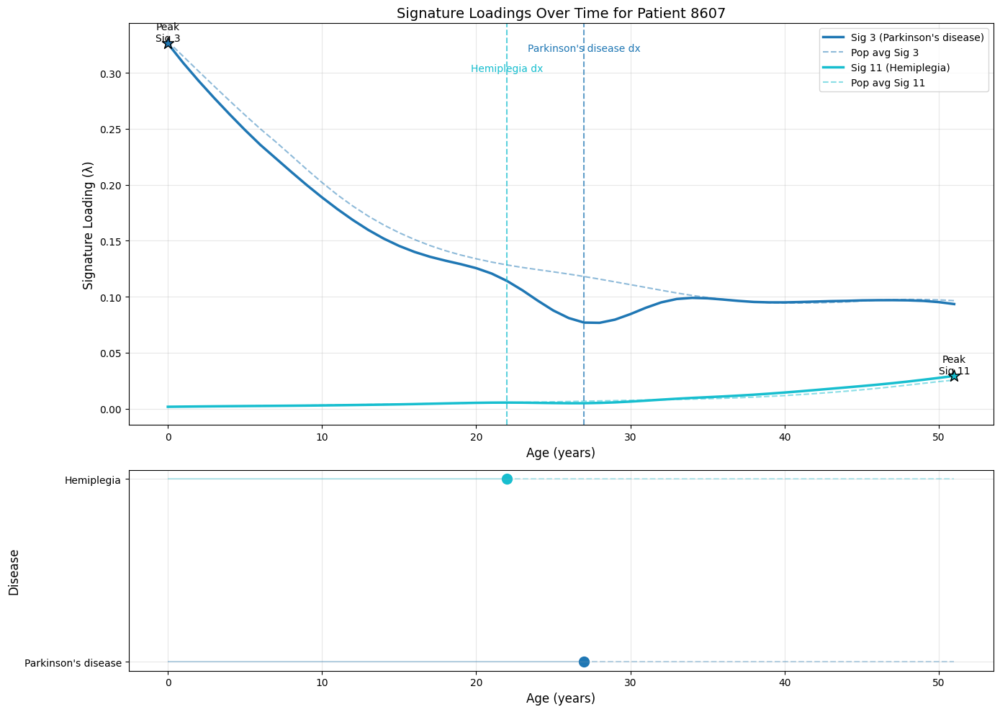


Peak Timing Analysis:
          disease_name  signature  diagnosis_time  peak_time  \
0  Parkinson's disease          3              27          0   
1           Hemiplegia         11              22         51   

   peak_to_diagnosis  
0                -27  
1                 29  

Analyzing Patient 326:
  - Degenerative disease of the spinal cord diagnosed at age 31
  - Hemiplegia diagnosed at age 27


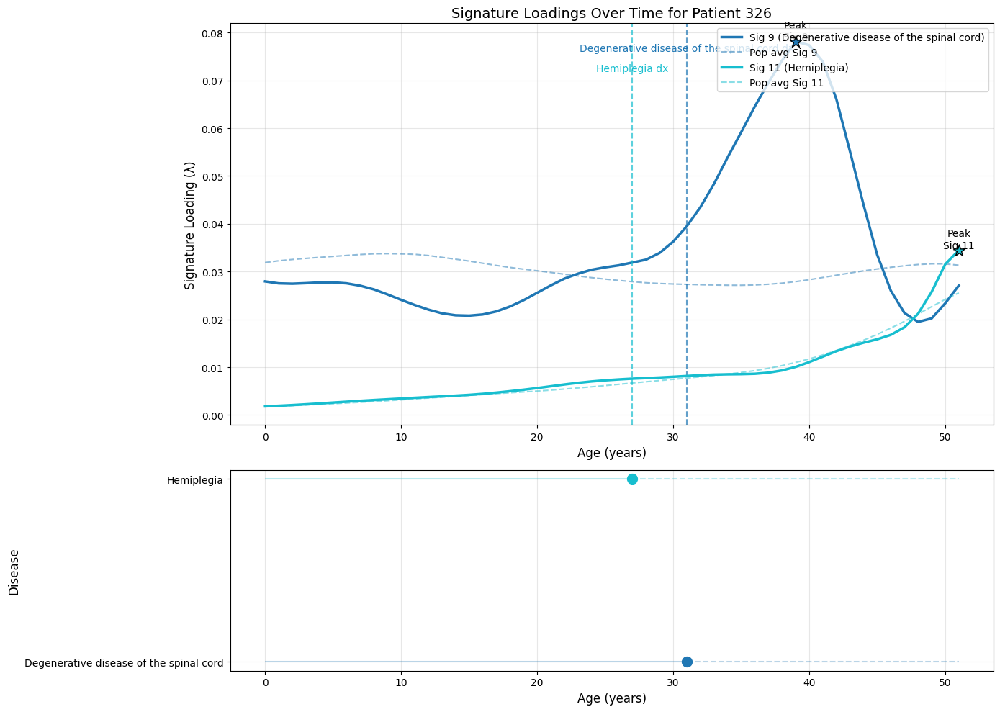


Peak Timing Analysis:
                              disease_name  signature  diagnosis_time  \
0  Degenerative disease of the spinal cord          9              31   
1                               Hemiplegia         11              27   

   peak_time  peak_to_diagnosis  
0         39                  8  
1         51                 24  

Analyzing Patient 117:
  - Parkinson's disease diagnosed at age 43
  - Hemiplegia diagnosed at age 45


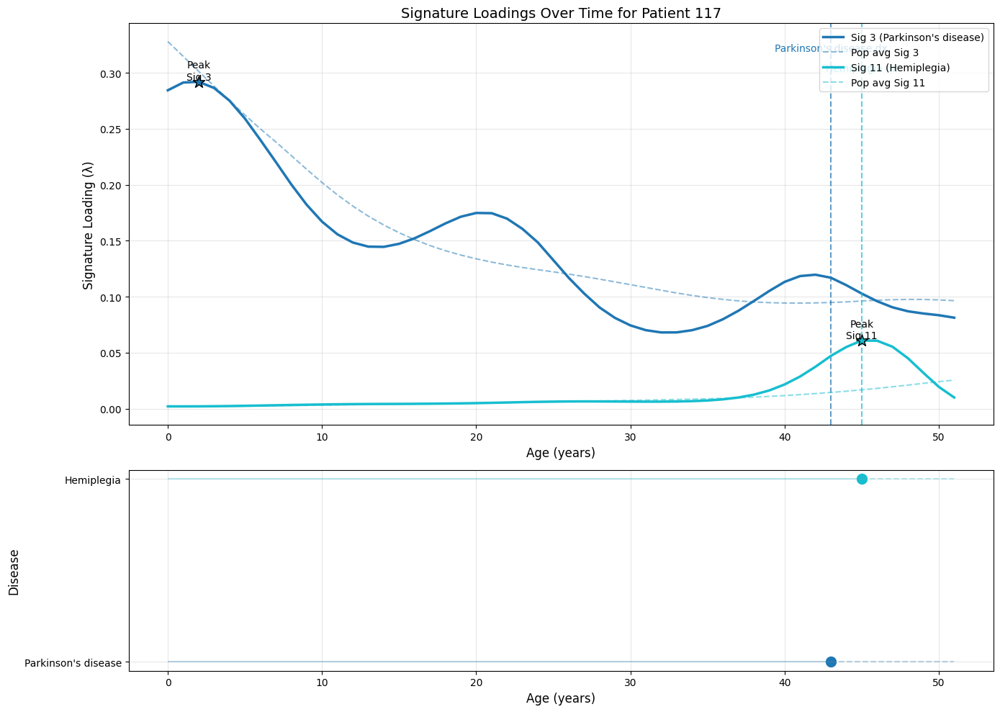


Peak Timing Analysis:
          disease_name  signature  diagnosis_time  peak_time  \
0  Parkinson's disease          3              43          2   
1           Hemiplegia         11              45         45   

   peak_to_diagnosis  
0                -41  
1                  0  

=== AGGREGATE ANALYSIS ===

Average Peak Timing Relative to Diagnosis:
                                              mean        std  count
disease_name                                                        
Degenerative disease of the spinal cord   8.000000        NaN      1
Hemiplegia                               17.666667  15.502688      3
Parkinson's disease                     -34.000000   9.899495      2

Signature Peak Sequence Analysis:

Common Peak Sequences:
  Parkinson's disease -> Hemiplegia: 2 patients
  Degenerative disease of the spinal cord -> Hemiplegia: 1 patients


In [61]:
# 1. Cardiovascular Disease Progression
cv_results = analyze_random_multi_disease_patients(
    model,
    model.Y,
    disease_indices=[88, 104, 112, 127],  # AFib, Hypertension, MI, Stroke
    min_conditions=2,
    n_patients=3
)

# 2. Cancer Metastasis Patterns
cancer_results = analyze_random_multi_disease_patients(
    model,
    model.Y,
    disease_indices=[17, 25, 26, 29],  # Breast cancer, Secondary malignancies
    min_conditions=2,
    n_patients=3
)

# 3. Metabolic Syndrome Progression
metabolic_results = analyze_random_multi_disease_patients(
    model,
    model.Y,
    disease_indices=[47, 61, 104, 113],  # T2D, Obesity, Hypertension, CAD
    min_conditions=2,
    n_patients=3
)

# 4. Neurological-Psychiatric Comorbidity
neuro_psych_results = analyze_random_multi_disease_patients(
    model,
    model.Y,
    disease_indices=[73, 74, 77, 82],  # Depression, Anxiety, Sleep disorders, Migraine
    min_conditions=2,
    n_patients=3
)

In [63]:
def plot_disease_lambda_alignment_for_test(model, Y_test, censored_indices, original_event_times, 
                                          disease_idx=112, sig_idx=None, n_samples=5):
    """
    Plot lambda values aligned with disease occurrences for censored patients
    
    Args:
        model: Trained model with censored event times
        Y_test: Original uncensored data
        censored_indices: Indices of patients who were censored
        original_event_times: Original event times for censored patients
        disease_idx: Index of the disease to analyze (default: 112 for MI)
        sig_idx: Specific signature index to plot (if None, will use most associated)
        n_samples: Number of patients to sample for plotting
    """
    # Filter patients who actually had the disease
    patients_with_disease = []
    diagnosis_times = []
    patient_indices = []
    
    for i, patient_idx in enumerate(censored_indices):
        # Check if this patient had the disease in the test data
        diag_time = torch.where(Y_test[patient_idx, disease_idx])[0]
        if len(diag_time) > 0:
            patients_with_disease.append(patient_idx)
            diagnosis_times.append(diag_time[0].item())
            patient_indices.append(i)  # Store position in censored_indices list
    
    # If no patients found, try a different disease
    if len(patients_with_disease) == 0:
        print(f"No patients found with disease {disease_idx}. Try a different disease index.")
        return
    
    # Sample patients if we have more than requested
    if len(patients_with_disease) > n_samples:
        sample_idx = np.random.choice(len(patients_with_disease), n_samples, replace=False)
        patients_with_disease = [patients_with_disease[i] for i in sample_idx]
        diagnosis_times = [diagnosis_times[i] for i in sample_idx]
        patient_indices = [patient_indices[i] for i in sample_idx]
    
    # Create plot
    fig, ax = plt.subplots(figsize=(12, 6))
    time_points = np.arange(model.T)
    
    # Find signature that most strongly associates with this disease if not specified
    if sig_idx is None:
        psi_disease = model.psi[:, disease_idx].detach()
        sig_idx = torch.argmax(psi_disease).item()
    
    # Get disease name if available
    disease_name = model.disease_names[disease_idx] if hasattr(model, 'disease_names') and model.disease_names is not None else f"Disease {disease_idx}"
    
    # Plot for each sampled patient
    for i, patient in enumerate(patients_with_disease):
        diag_time = diagnosis_times[i]
        censor_time = original_event_times[patient_indices[i]] - 2  # 2 years before event
        
        # Plot lambda (detached)
        lambda_values = torch.softmax(model.lambda_[patient].detach(), dim=0)[sig_idx]
        ax.plot(time_points, lambda_values.numpy(), alpha=0.7, label=f'Patient {patient}')
        
        # Mark diagnosis time with solid line
        ax.axvline(x=diag_time, linestyle='-', color='blue', alpha=0.3)
        
        # Mark censoring time with dashed line
        ax.axvline(x=censor_time, linestyle='--', color='red', alpha=0.3)
    
    # Add legend for vertical lines
    ax.axvline(x=0, linestyle='-', color='blue', alpha=0.3, label='Diagnosis Time')
    ax.axvline(x=0, linestyle='--', color='red', alpha=0.3, label='Censoring Time')
    
    # Set title and labels
    ax.set_title(f'Lambda Values for Signature {sig_idx} (Most Associated with {disease_name})\n'
                f'Blue Lines: Diagnosis Times, Red Lines: Censoring Times')
    ax.set_xlabel('Time')
    ax.set_ylabel('Lambda (proportion)')
    ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    ax.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()
    
    # Return patient info for further analysis
    return {
        'patients': patients_with_disease,
        'diagnosis_times': diagnosis_times,
        'censoring_times': [original_event_times[i] - 2 for i in patient_indices]
    }

# Usage example:
patient_info = plot_disease_lambda_alignment_for_test(
     model, model.Y, censored_indices, original_event_times, 
     disease_idx=112  # MI
)

NameError: name 'censored_indices' is not defined